### My test notebook

In [1]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Set the base directory for reading and saving files
BASE_DIR = os.path.expanduser("~/Downloads/diabetes_subset_sensor_data")
#RAW_DATA_DIR = os.path.join(os.path.dirname(BASE_DIR), "raw_data")  # Save raw_data in the root folder
RAW_DATA_DIR = "../raw_data/sensor"  # Directory to save processed files
#/Users/jenniferdanielonwuchekwa/code/sasha17demin/hypopredict/raw_data


# Ensure the raw_data directory exists
os.makedirs(RAW_DATA_DIR, exist_ok=True)

In [3]:
def parse_compress_csv(file_path, signal_type=None):
    """
    Reads and compresses a CSV file, parsing dates and setting datetime index.
    """
    print(f"Processing file: {file_path}")
    csv_size = os.path.getsize(file_path) / 1024**2
    print(f"Original CSV file size: {csv_size:.2f} MB")

    # Read and preprocess the CSV file
    df = pd.read_csv(file_path, parse_dates=['Time'])
    df['datetime'] = pd.to_datetime(df['Time'], dayfirst=True, format='%d/%m/%Y %H:%M:%S.%f')
    df.drop(columns=['Time'], inplace=True)
    df.set_index('datetime', inplace=True)

    return df

In [4]:
def save_to_feather(df, file_path, patient_id, sensor_type):
    """
    Saves the processed DataFrame to a feather file in the patient's directory.
    """
    # Create a directory for the patient if it doesn't exist
    patient_dir = os.path.join(RAW_DATA_DIR, patient_id)
    os.makedirs(patient_dir, exist_ok=True)

    # Define the naming convention
    new_feather = os.path.join(patient_dir, f"d1namo_t1d_{sensor_type}_{patient_id}.feather")

    # Save to feather format
    df.to_feather(new_feather)
    feather_size = os.path.getsize(new_feather) / 1024**2
    print(f"Saved to feather: {new_feather} ({feather_size:.2f} MB)")

    return new_feather

In [5]:
def process_sensor_data(sensor_dir, patient_id, sensor_type):
    """
    Processes all sensor data files for a specific sensor type.
    """
    try:
        csv_files = glob.glob(os.path.join(sensor_dir, "*.csv"))
        if not csv_files:
            print(f"No CSV files found for sensor '{sensor_type}' in patient {patient_id}. Skipping...")
            return

        print(f"Detected CSV files for sensor '{sensor_type}' in patient {patient_id}: {csv_files}")

        for file_path in csv_files:
            try:
                # Parse and compress the CSV file
                df = parse_compress_csv(file_path, signal_type=sensor_type)

                # Save the compressed data to feather format
                save_to_feather(df, file_path, patient_id, sensor_type)

                # Optional: Plot a segment for visual inspection
                print(f"Visualizing data for sensor '{sensor_type}' in patient {patient_id}")
                df.iloc[15000:15000*3].plot(figsize=(11, 3))
                plt.show()

                # Clean up memory
                del df
            except Exception as e:
                print(f"Error processing file {file_path}: {e}. Skipping...")
    except Exception as e:
        print(f"Error processing sensor '{sensor_type}' for patient {patient_id}: {e}. Skipping...")

In [6]:
def process_patient_data(patient_dir, patient_id):
    """
    Processes all sensor data for a single patient.
    """
    try:
        sensor_dirs = [os.path.join(patient_dir, sensor) for sensor in os.listdir(patient_dir) if os.path.isdir(os.path.join(patient_dir, sensor))]
        if not sensor_dirs:
            print(f"No sensor directories found for patient {patient_id}. Skipping...")
            return

        print(f"Detected sensors for patient {patient_id}: {sensor_dirs}")

        for sensor_dir in sensor_dirs:
            sensor_type = os.path.basename(sensor_dir)  # Use folder name as sensor type
            process_sensor_data(sensor_dir, patient_id, sensor_type)
    except Exception as e:
        print(f"Error processing patient {patient_id}: {e}. Skipping...")

Detected patient directories: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002']

Processing data for patient 007 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007
Detected sensors for patient 007: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/acceleration', '/Users/jenniferdanielonwuchek

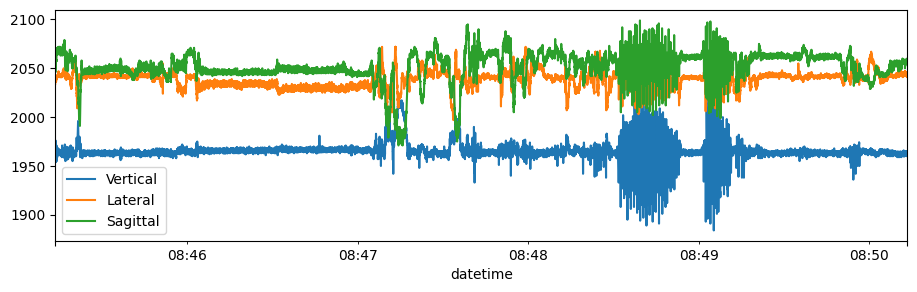

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/acceleration/2014_10_04-08_27_21_Accel.csv
Original CSV file size: 183.39 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_acceleration_007.feather (60.63 MB)
Visualizing data for sensor 'acceleration' in patient 007


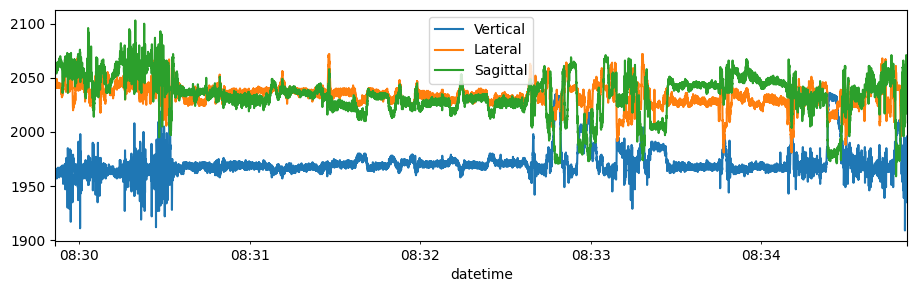

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/acceleration/2014_10_03-06_46_57_Accel.csv
Original CSV file size: 266.42 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_acceleration_007.feather (88.75 MB)
Visualizing data for sensor 'acceleration' in patient 007


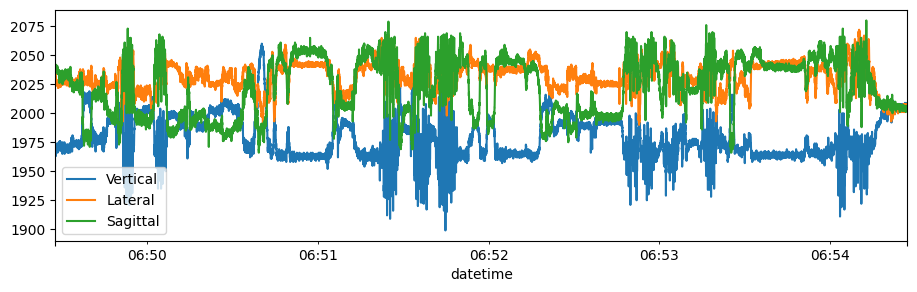

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/acceleration/2014_10_02-07_52_44_Accel.csv
Original CSV file size: 145.59 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_acceleration_007.feather (49.68 MB)
Visualizing data for sensor 'acceleration' in patient 007


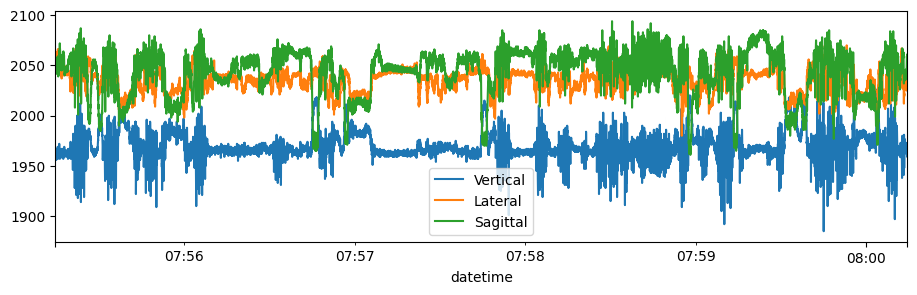

Detected CSV files for sensor 'BB' in patient 007: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_03-06_46_57_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_02-07_52_44_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_04-08_27_21_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_01-08_42_43_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_03-06_46_57_BB.csv
Original CSV file size: 0.11 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_BB_007.feather (0.06 MB)
Visualizing data for sensor 'BB' in patient 007


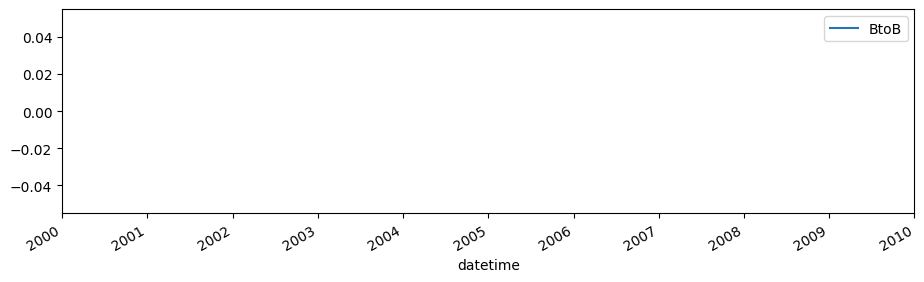

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_02-07_52_44_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_BB_007.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 007


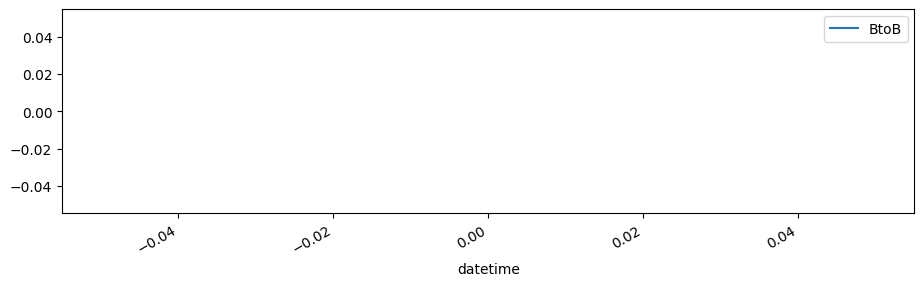

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_04-08_27_21_BB.csv
Original CSV file size: 0.06 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_BB_007.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 007


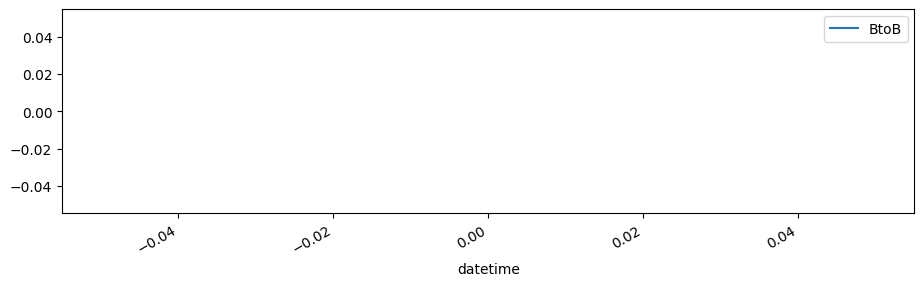

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/BB/2014_10_01-08_42_43_BB.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_BB_007.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 007


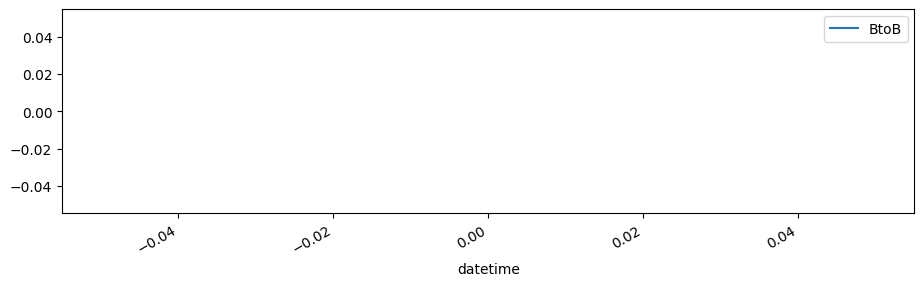

Detected CSV files for sensor 'breathing' in patient 007: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_03-06_46_57_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_01-08_42_43_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_02-07_52_44_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_04-08_27_21_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_03-06_46_57_Breathing.csv
Original CSV file size: 54.72 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_breathing_007.feather (16.15 MB)
Visualizing data for sensor 'breathing' in patient 007


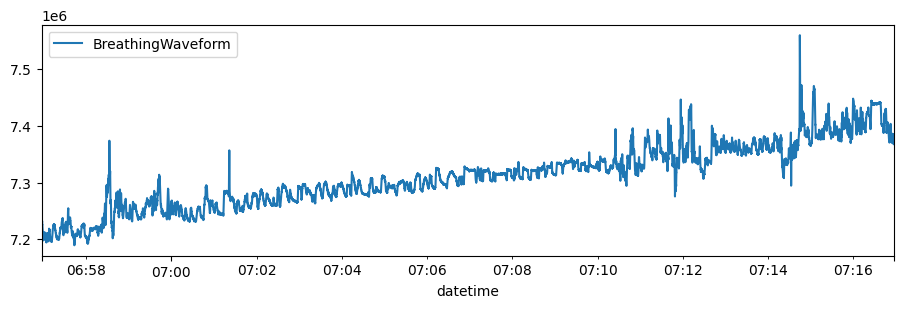

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_01-08_42_43_Breathing.csv
Original CSV file size: 41.36 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_breathing_007.feather (12.08 MB)
Visualizing data for sensor 'breathing' in patient 007


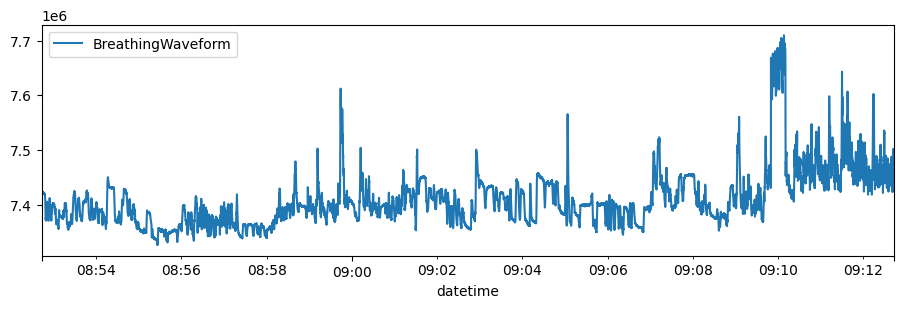

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_02-07_52_44_Breathing.csv
Original CSV file size: 30.39 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_breathing_007.feather (8.92 MB)
Visualizing data for sensor 'breathing' in patient 007


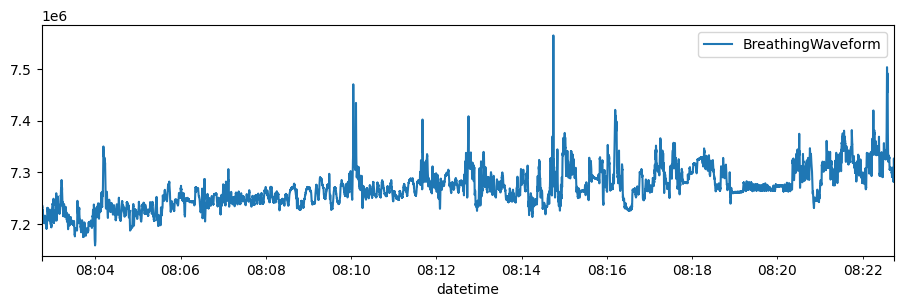

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/breathing/2014_10_04-08_27_21_Breathing.csv
Original CSV file size: 37.62 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_breathing_007.feather (10.96 MB)
Visualizing data for sensor 'breathing' in patient 007


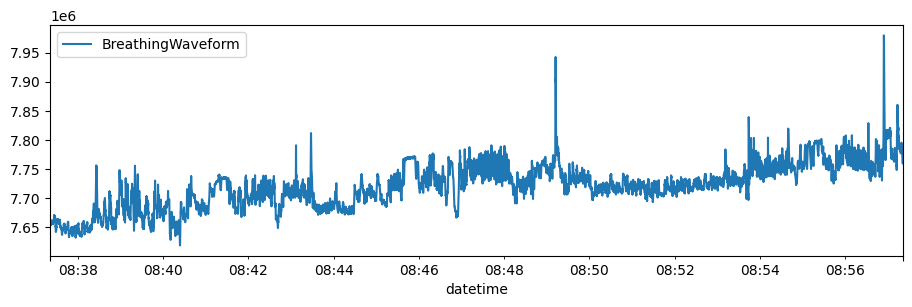

Detected CSV files for sensor 'RR' in patient 007: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_02-07_52_44_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_04-08_27_21_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_01-08_42_43_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_03-06_46_57_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_02-07_52_44_RR.csv
Original CSV file size: 0.35 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_RR_007.feather (0.21 MB)
Visualizing data for sensor 'RR' in patient 007


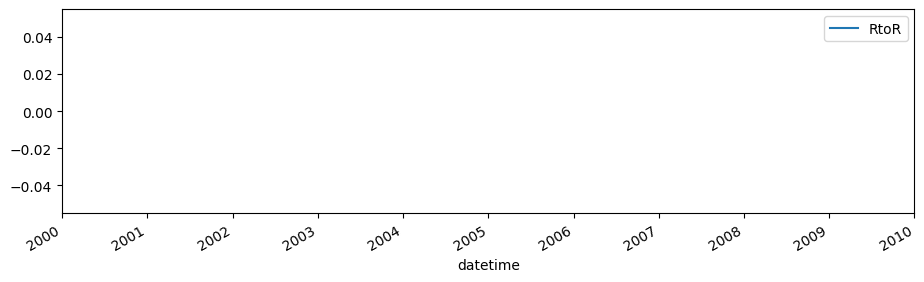

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_04-08_27_21_RR.csv
Original CSV file size: 0.27 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_RR_007.feather (0.17 MB)
Visualizing data for sensor 'RR' in patient 007


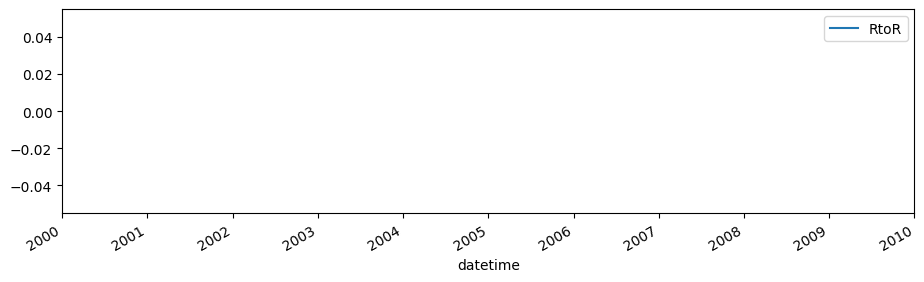

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_01-08_42_43_RR.csv
Original CSV file size: 0.32 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_RR_007.feather (0.20 MB)
Visualizing data for sensor 'RR' in patient 007


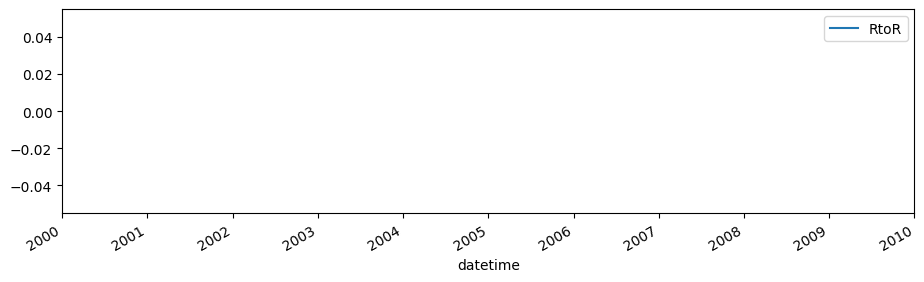

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/RR/2014_10_03-06_46_57_RR.csv
Original CSV file size: 0.47 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_RR_007.feather (0.29 MB)
Visualizing data for sensor 'RR' in patient 007


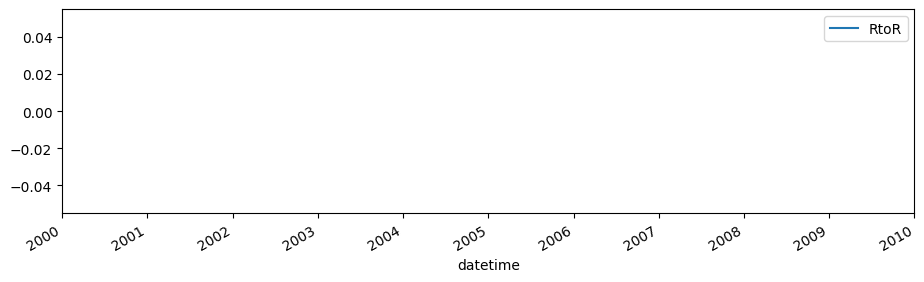

Detected CSV files for sensor 'summary' in patient 007: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_01-08_42_43_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_03-06_46_57_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_02-07_52_44_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_04-08_27_21_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_01-08_42_43_Summary.csv
Original CSV file size: 10.22 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_summary_007.feather (2.65 MB)
Visualizing data for sensor 'summary' in patient 007


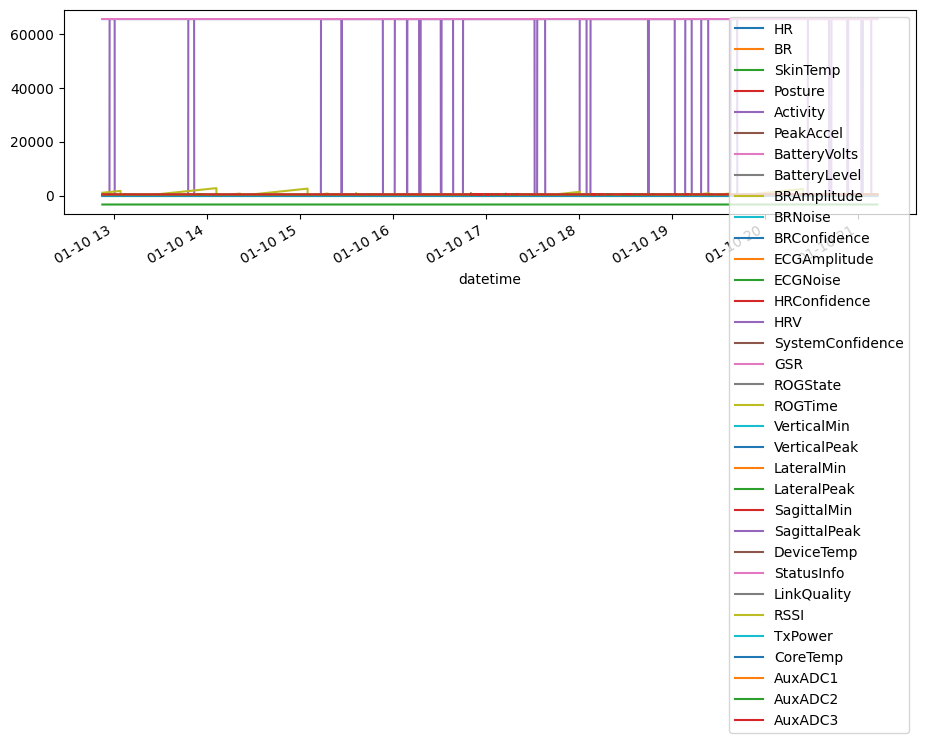

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_03-06_46_57_Summary.csv
Original CSV file size: 13.50 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_summary_007.feather (3.60 MB)
Visualizing data for sensor 'summary' in patient 007


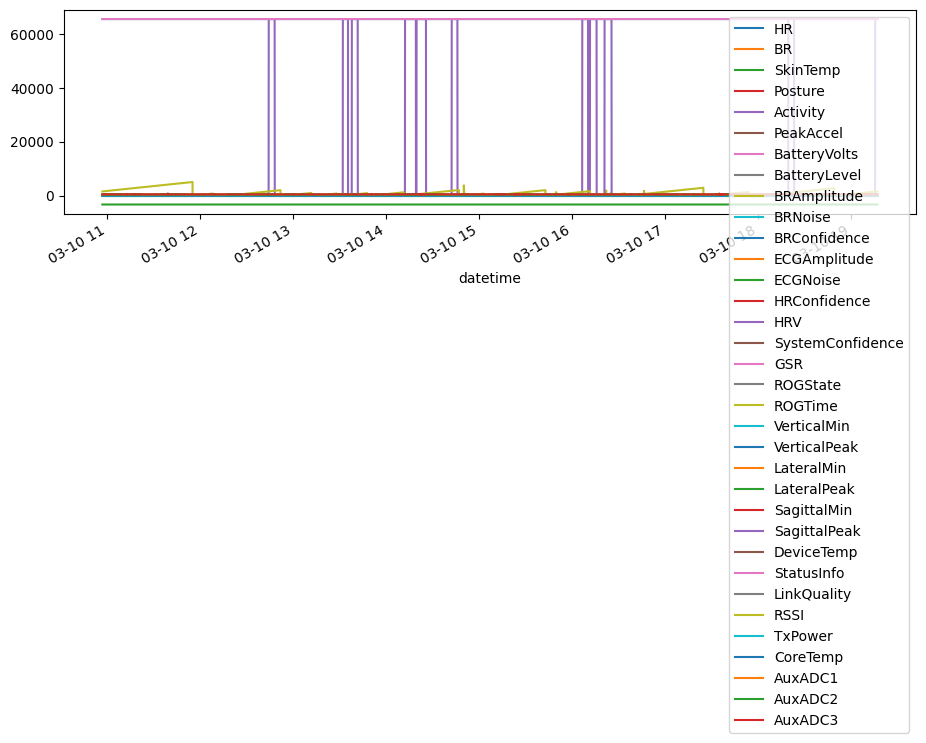

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_02-07_52_44_Summary.csv
Original CSV file size: 7.38 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_summary_007.feather (1.97 MB)
Visualizing data for sensor 'summary' in patient 007


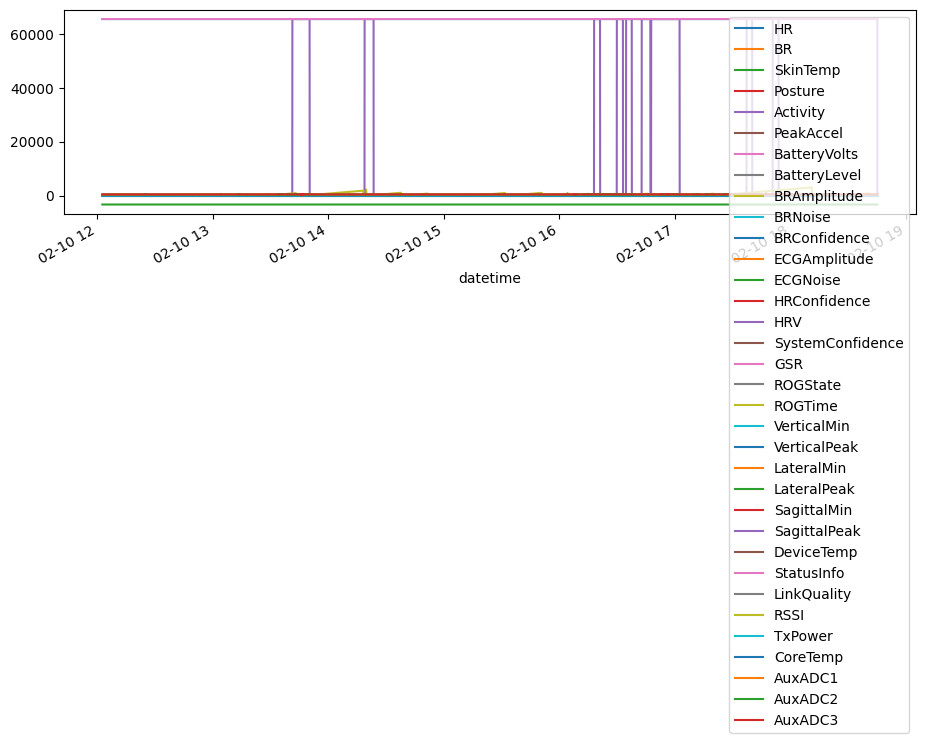

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/007/summary/2014_10_04-08_27_21_Summary.csv
Original CSV file size: 9.28 MB
Saved to feather: ../raw_data/sensor/007/d1namo_t1d_summary_007.feather (2.36 MB)
Visualizing data for sensor 'summary' in patient 007


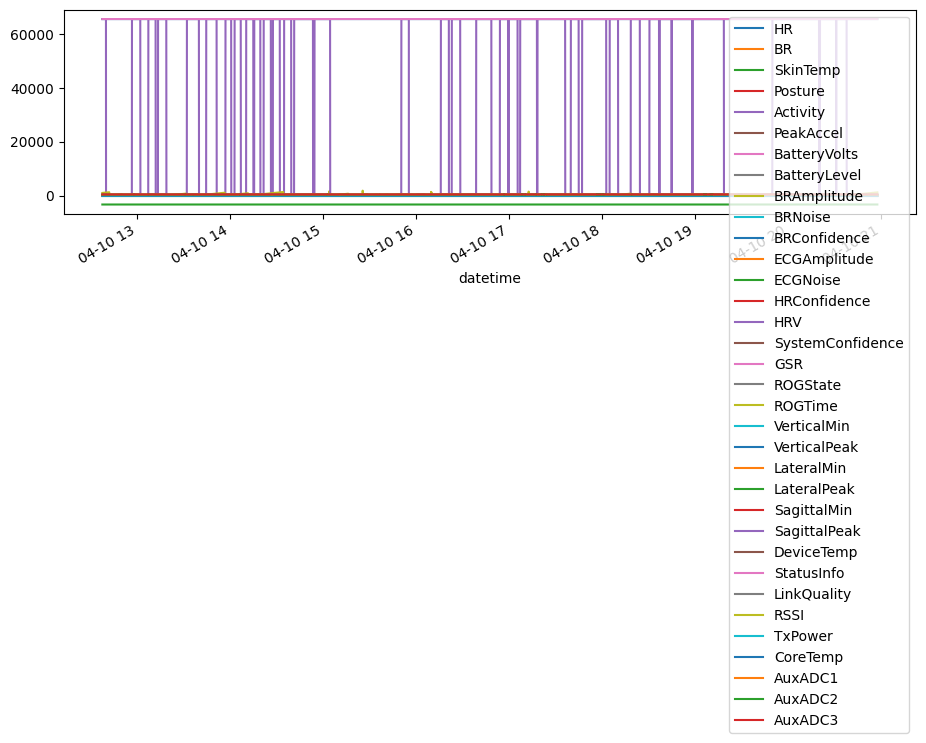


Processing data for patient 009 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009
Detected sensors for patient 009: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary']
Detected CSV files for sensor 'acceleration' in patient 009: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_03-08_21_59_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_04-15_03_37_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_02-06_14_52_Accel.csv', 

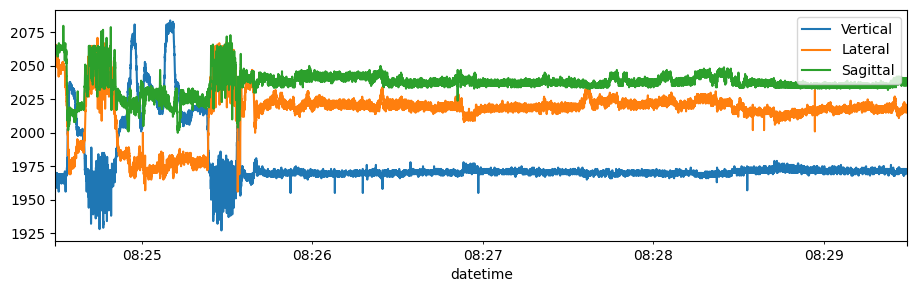

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_04-15_03_37_Accel.csv
Original CSV file size: 103.13 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_acceleration_009.feather (32.30 MB)
Visualizing data for sensor 'acceleration' in patient 009


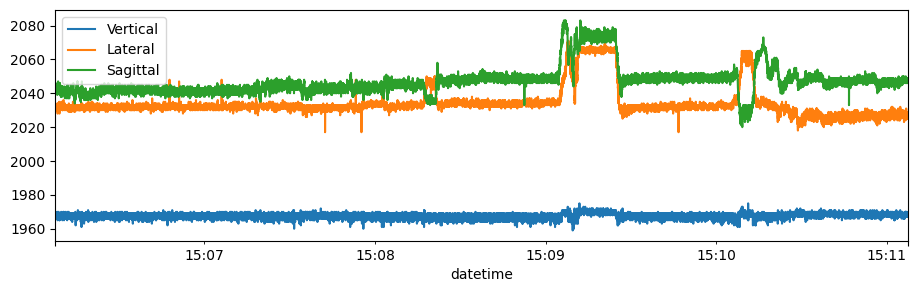

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_02-06_14_52_Accel.csv
Original CSV file size: 192.89 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_acceleration_009.feather (63.51 MB)
Visualizing data for sensor 'acceleration' in patient 009


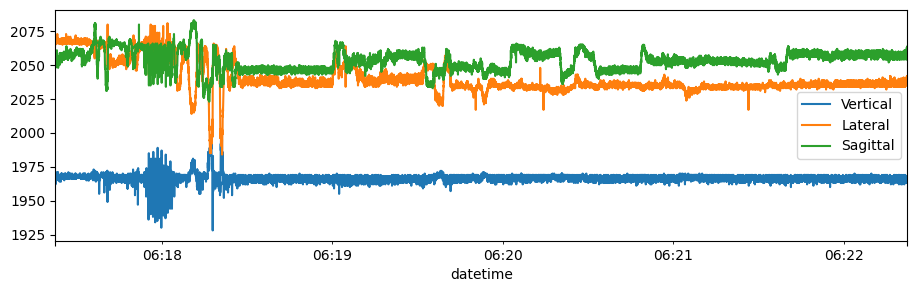

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_01-05_59_30_Accel.csv
Original CSV file size: 171.04 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_acceleration_009.feather (56.79 MB)
Visualizing data for sensor 'acceleration' in patient 009


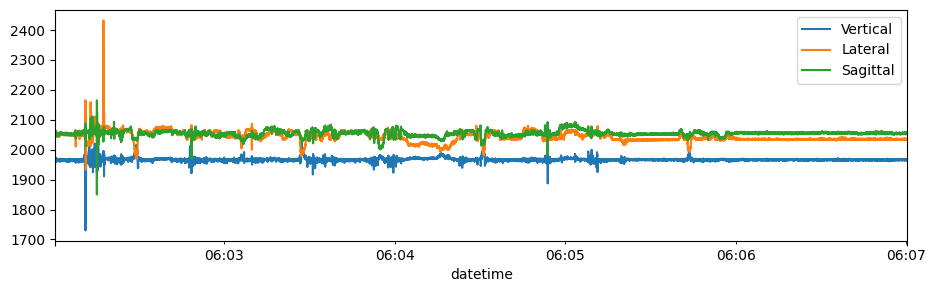

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/acceleration/2014_10_04-09_09_29_Accel.csv
Original CSV file size: 79.03 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_acceleration_009.feather (25.63 MB)
Visualizing data for sensor 'acceleration' in patient 009


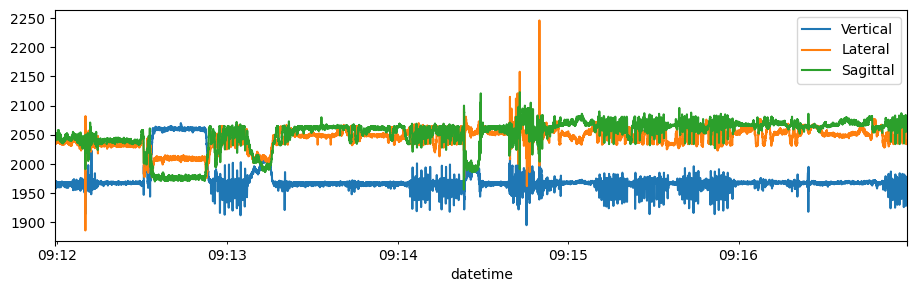

Detected CSV files for sensor 'BB' in patient 009: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_01-05_59_30_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_04-09_09_29_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_02-06_14_52_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_03-08_21_59_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_04-15_03_37_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_01-05_59_30_BB.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_BB_009.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 009


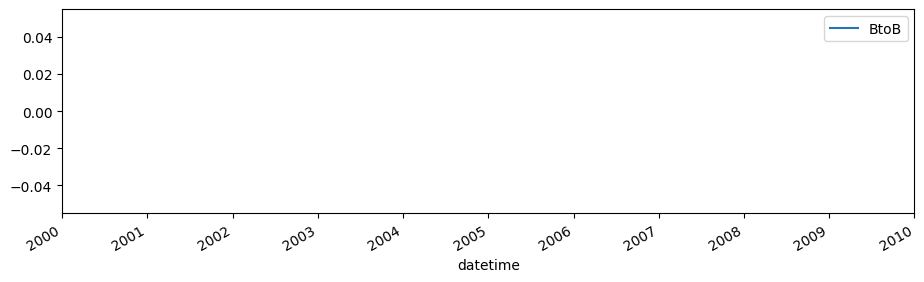

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_04-09_09_29_BB.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_BB_009.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 009


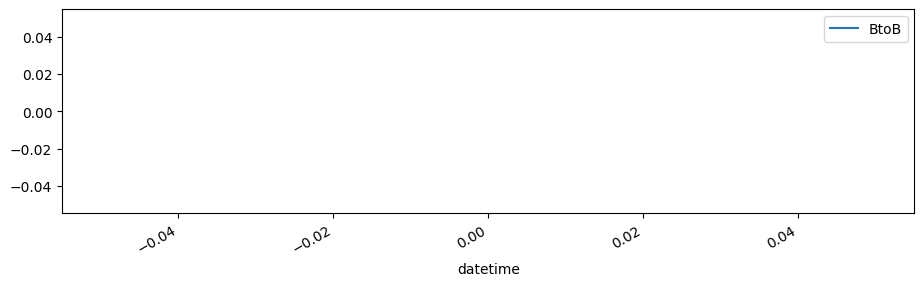

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_02-06_14_52_BB.csv
Original CSV file size: 0.10 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_BB_009.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 009


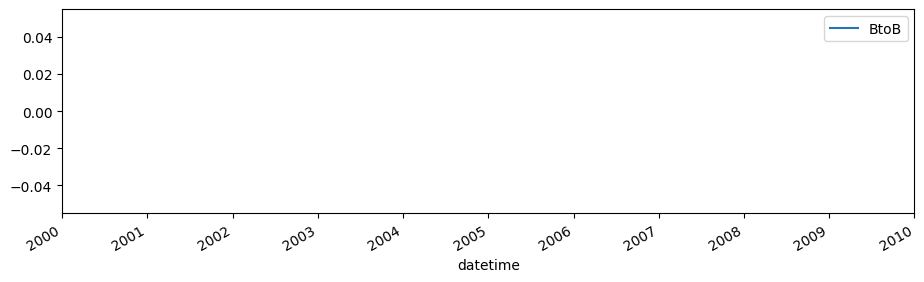

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_03-08_21_59_BB.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_BB_009.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 009


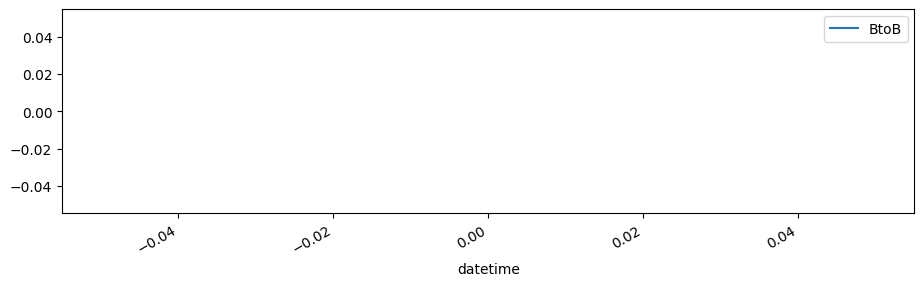

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/BB/2014_10_04-15_03_37_BB.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_BB_009.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 009


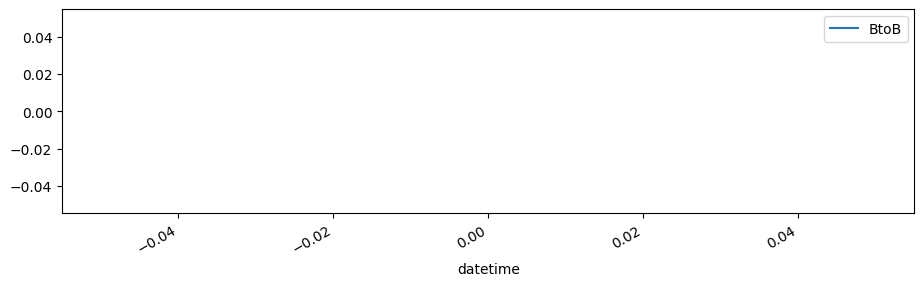

Detected CSV files for sensor 'breathing' in patient 009: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_04-09_09_29_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_02-06_14_52_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_04-15_03_37_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_01-05_59_30_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_03-08_21_59_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_04-09_09_29_Breathing.csv
Original CSV file size: 16.21 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_breathing_009.feather (4.65 MB)
Visualizing data for sensor 'breathing' in patient 009


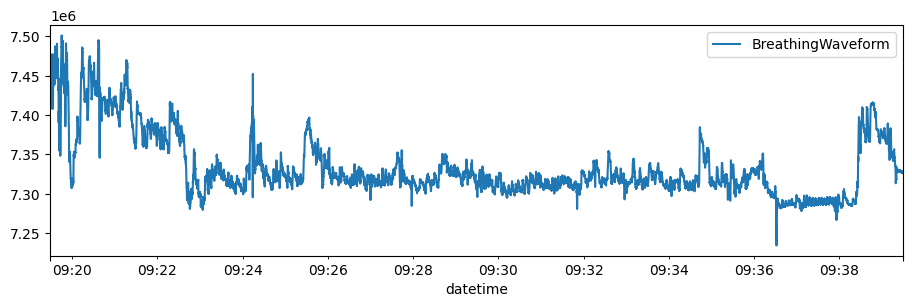

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_02-06_14_52_Breathing.csv
Original CSV file size: 39.57 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_breathing_009.feather (11.60 MB)
Visualizing data for sensor 'breathing' in patient 009


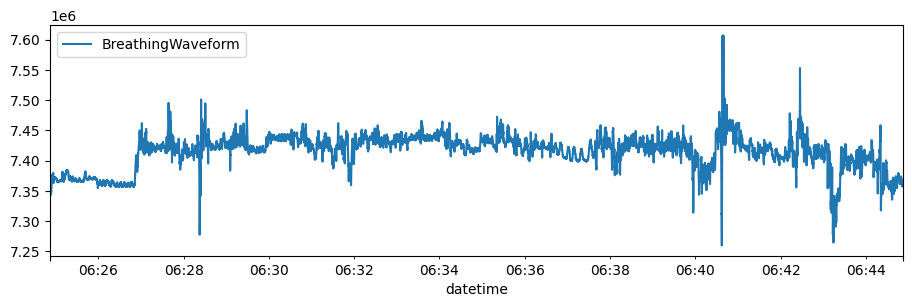

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_04-15_03_37_Breathing.csv
Original CSV file size: 21.15 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_breathing_009.feather (5.99 MB)
Visualizing data for sensor 'breathing' in patient 009


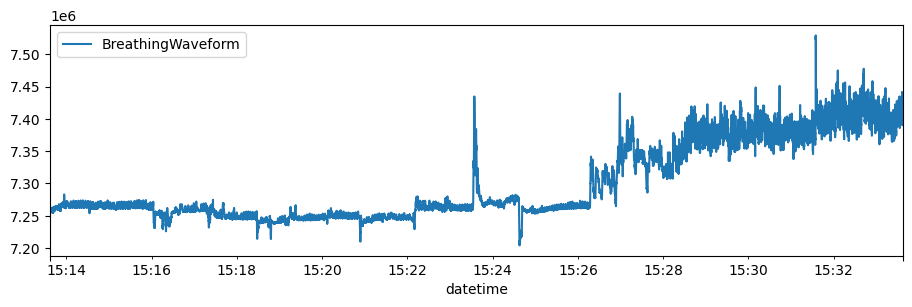

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_01-05_59_30_Breathing.csv
Original CSV file size: 35.08 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_breathing_009.feather (10.39 MB)
Visualizing data for sensor 'breathing' in patient 009


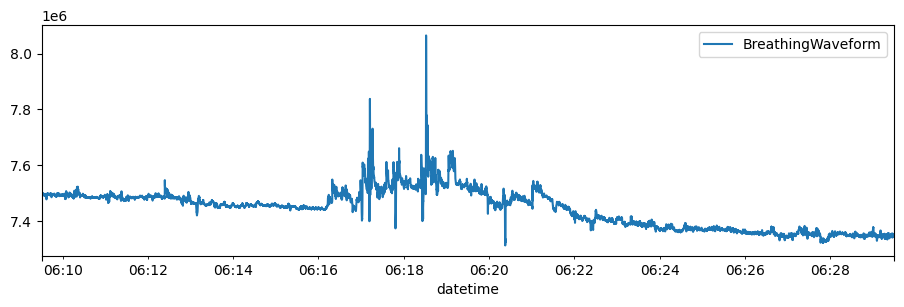

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/breathing/2014_10_03-08_21_59_Breathing.csv
Original CSV file size: 32.40 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_breathing_009.feather (9.36 MB)
Visualizing data for sensor 'breathing' in patient 009


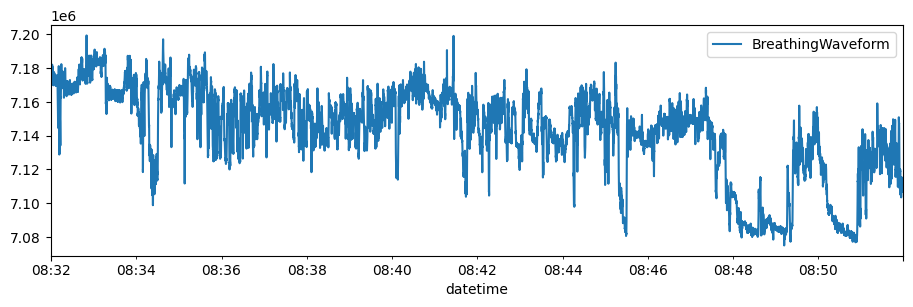

Detected CSV files for sensor 'RR' in patient 009: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_04-15_03_37_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_01-05_59_30_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_04-09_09_29_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_02-06_14_52_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_03-08_21_59_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_04-15_03_37_RR.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_RR_009.feather (0.00 MB)
Visualizing data for sensor 'RR' in patient 009


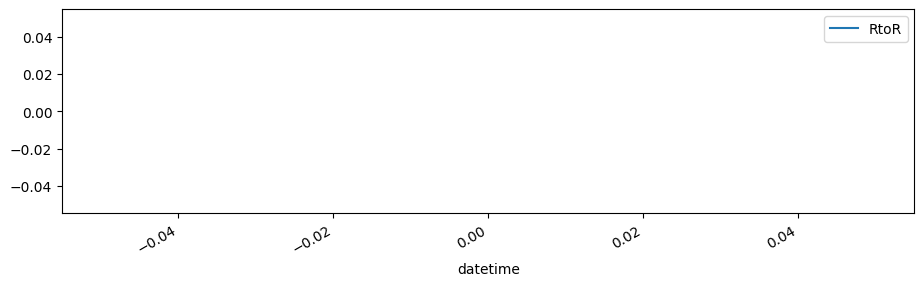

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_01-05_59_30_RR.csv
Original CSV file size: 0.03 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_RR_009.feather (0.02 MB)
Visualizing data for sensor 'RR' in patient 009


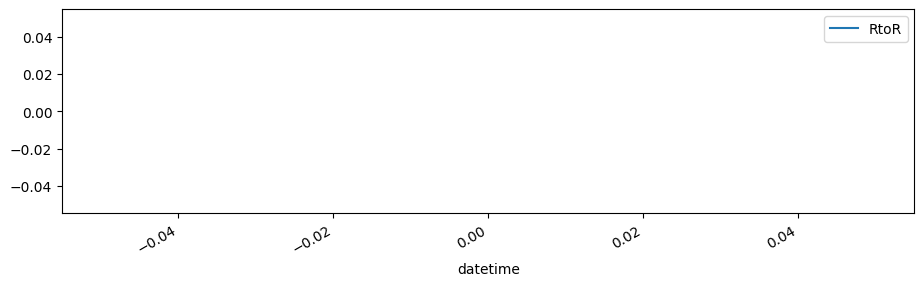

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_04-09_09_29_RR.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_RR_009.feather (0.01 MB)
Visualizing data for sensor 'RR' in patient 009


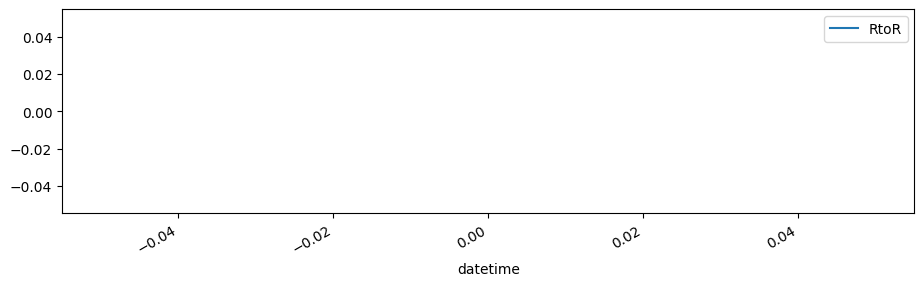

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_02-06_14_52_RR.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_RR_009.feather (0.04 MB)
Visualizing data for sensor 'RR' in patient 009


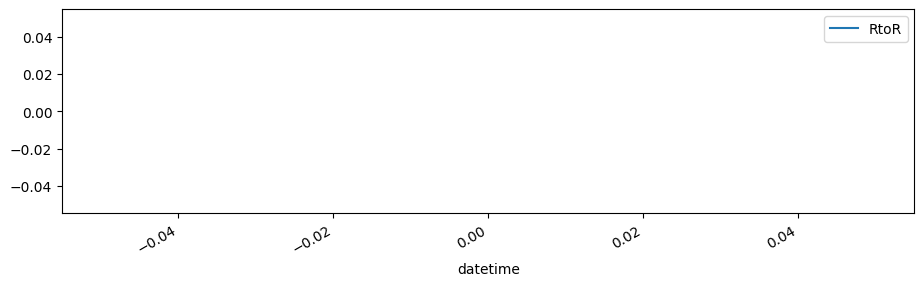

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/RR/2014_10_03-08_21_59_RR.csv
Original CSV file size: 0.03 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_RR_009.feather (0.02 MB)
Visualizing data for sensor 'RR' in patient 009


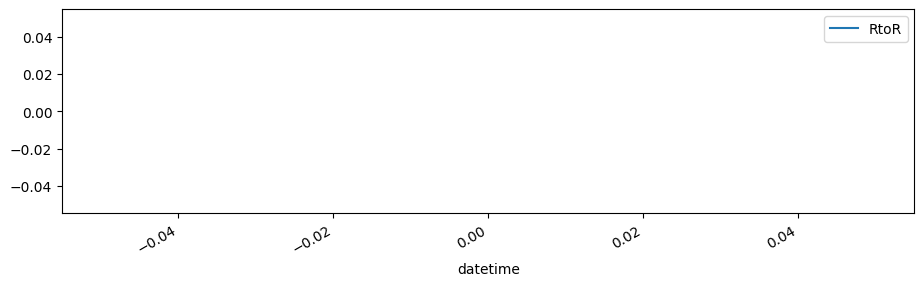

Detected CSV files for sensor 'summary' in patient 009: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_02-06_14_52_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_04-15_03_37_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_04-09_09_29_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_01-05_59_30_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_03-08_21_59_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_02-06_14_52_Summary.csv
Original CSV file size: 9.63 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_summary_009.feather (2.40 MB)
Visualizing data for sensor 'summary' in patient 009


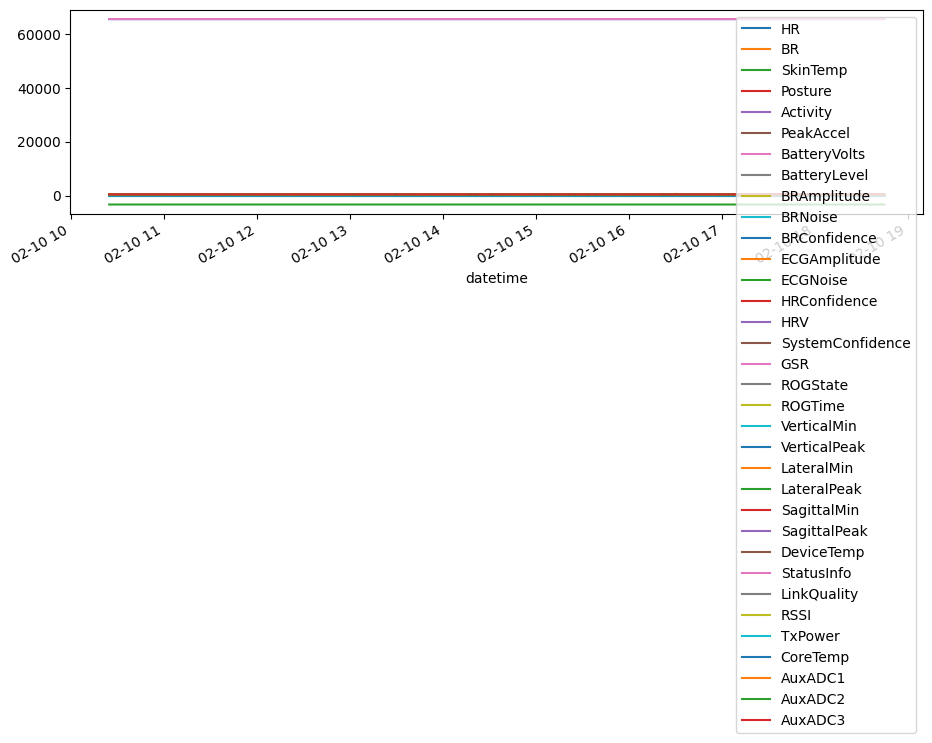

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_04-15_03_37_Summary.csv
Original CSV file size: 5.09 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_summary_009.feather (0.97 MB)
Visualizing data for sensor 'summary' in patient 009


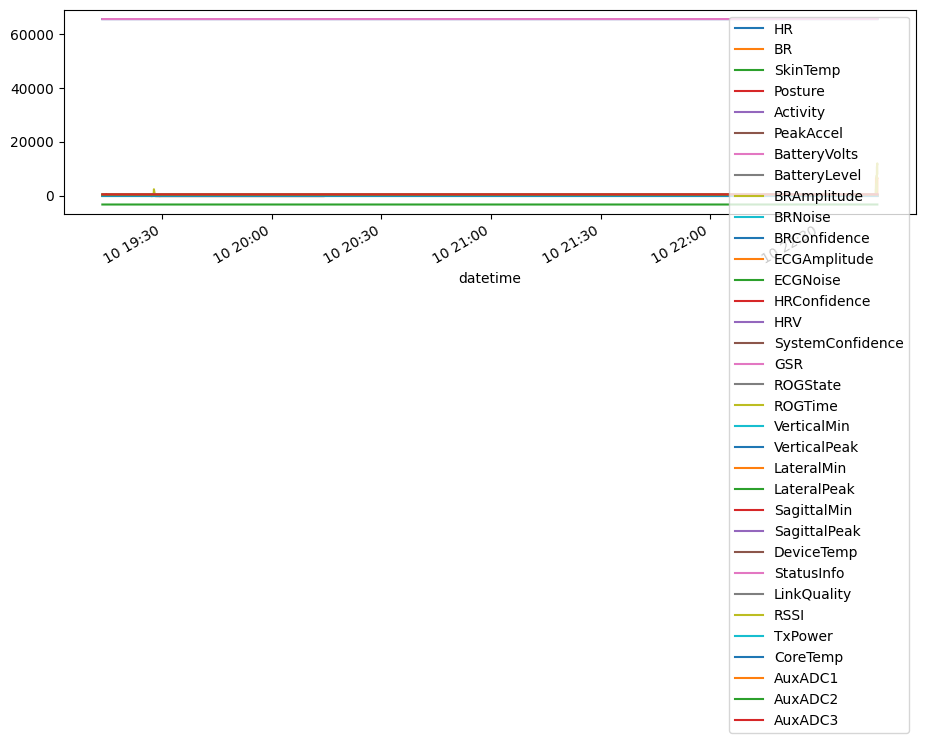

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_04-09_09_29_Summary.csv
Original CSV file size: 3.93 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_summary_009.feather (0.86 MB)
Visualizing data for sensor 'summary' in patient 009


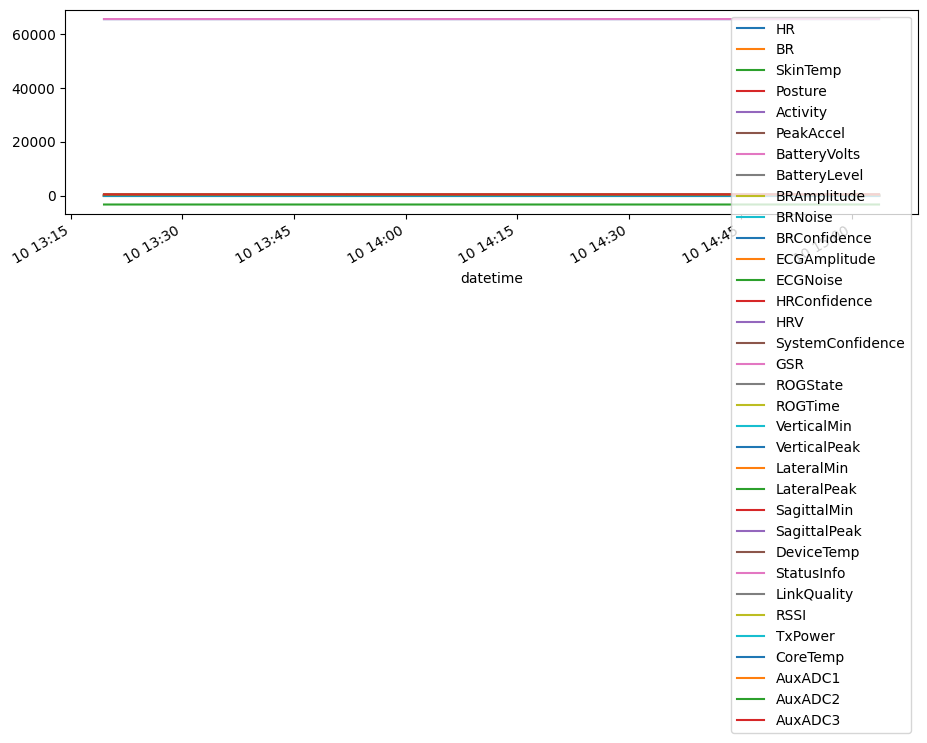

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_01-05_59_30_Summary.csv
Original CSV file size: 8.53 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_summary_009.feather (2.22 MB)
Visualizing data for sensor 'summary' in patient 009


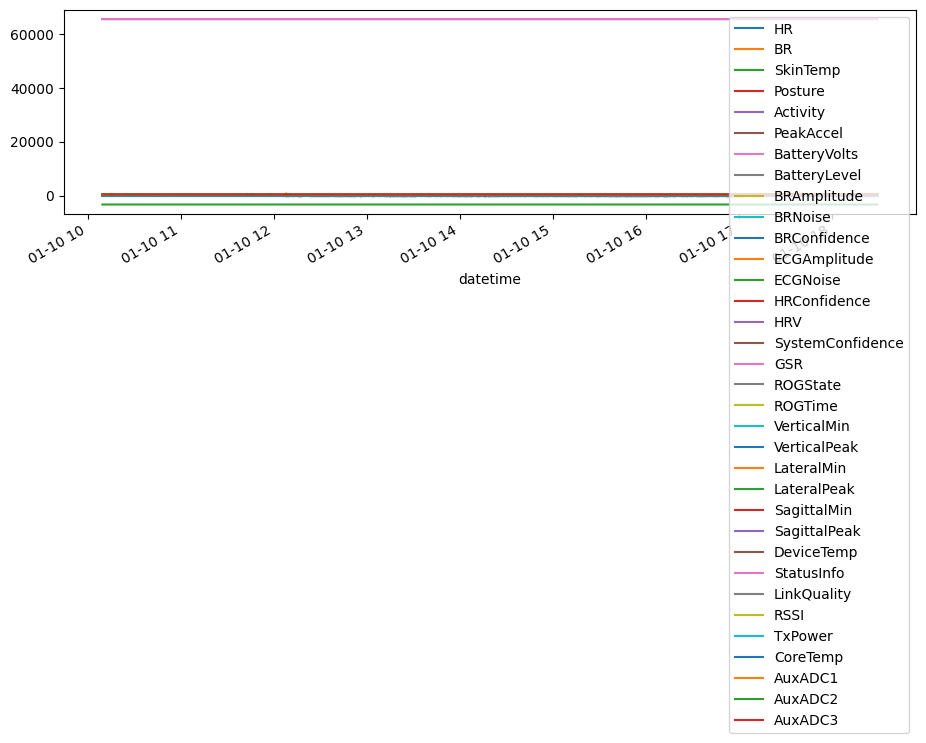

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/009/summary/2014_10_03-08_21_59_Summary.csv
Original CSV file size: 7.87 MB
Saved to feather: ../raw_data/sensor/009/d1namo_t1d_summary_009.feather (1.90 MB)
Visualizing data for sensor 'summary' in patient 009


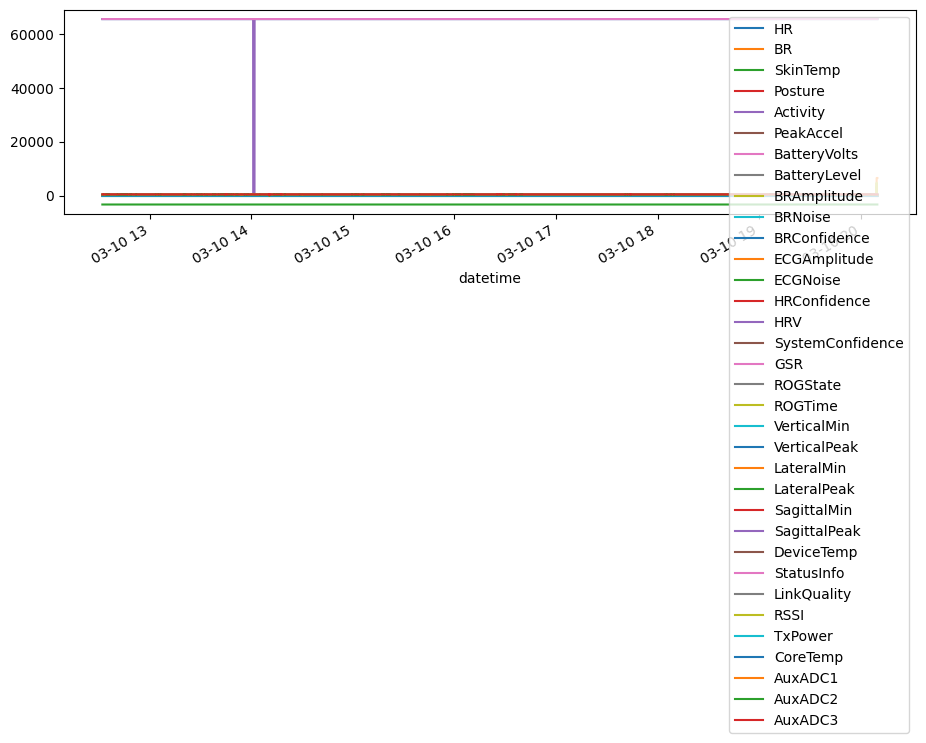


Processing data for patient 008 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008
Detected sensors for patient 008: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary']
Detected CSV files for sensor 'acceleration' in patient 008: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration/2014_10_01-06_43_00_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration/2014_10_03-22_54_51_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration/2014_10_02-10_13_52_Accel.csv', 

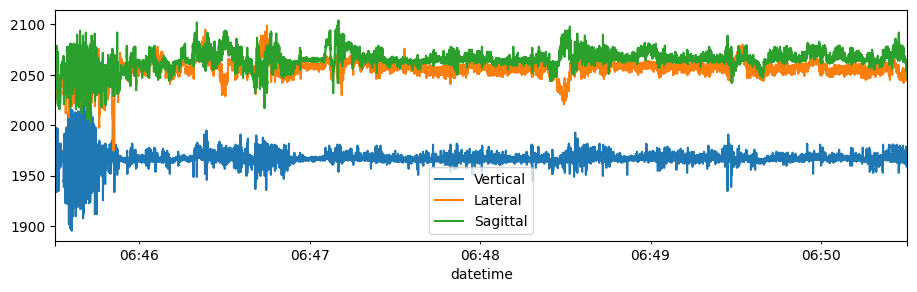

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration/2014_10_03-22_54_51_Accel.csv
Original CSV file size: 122.80 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_acceleration_008.feather (38.22 MB)
Visualizing data for sensor 'acceleration' in patient 008


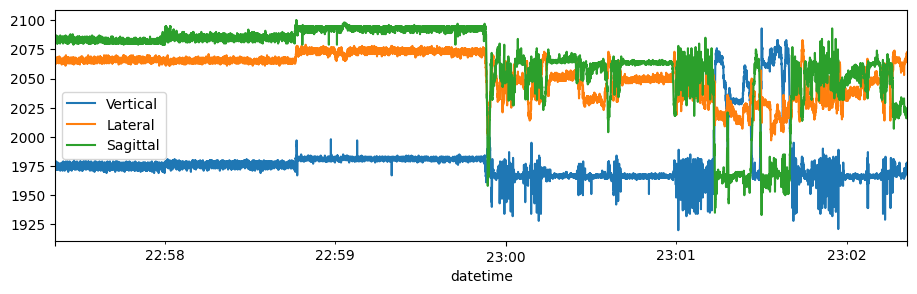

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration/2014_10_02-10_13_52_Accel.csv
Original CSV file size: 230.44 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_acceleration_008.feather (73.73 MB)
Visualizing data for sensor 'acceleration' in patient 008


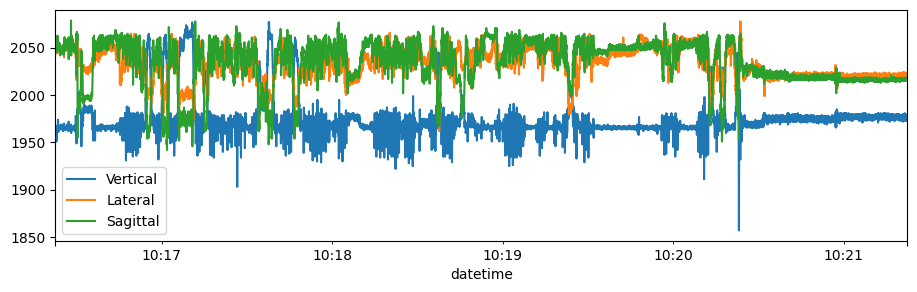

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/acceleration/2014_10_03-10_51_39_Accel.csv
Original CSV file size: 161.39 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_acceleration_008.feather (51.90 MB)
Visualizing data for sensor 'acceleration' in patient 008


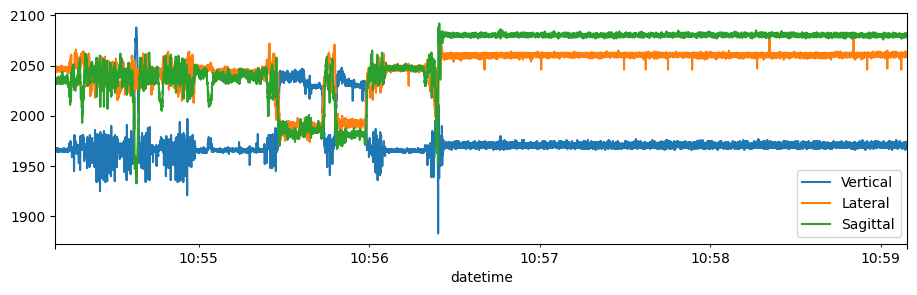

Detected CSV files for sensor 'BB' in patient 008: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_03-22_54_51_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_01-06_43_00_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_02-10_13_52_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_03-10_51_39_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_03-22_54_51_BB.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_BB_008.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 008


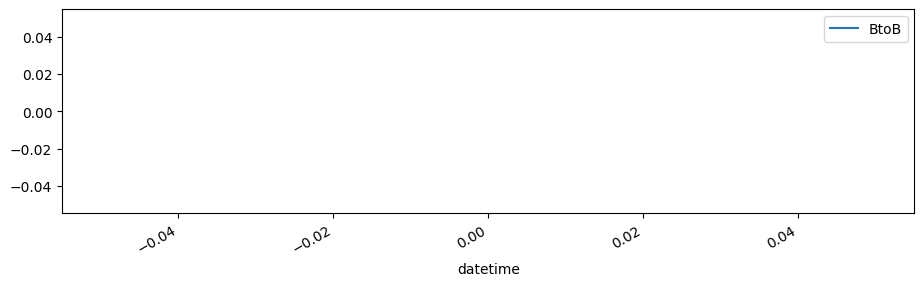

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_01-06_43_00_BB.csv
Original CSV file size: 0.10 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_BB_008.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 008


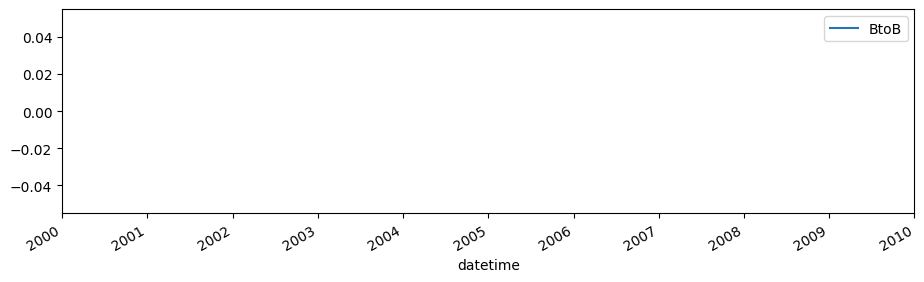

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_02-10_13_52_BB.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_BB_008.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 008


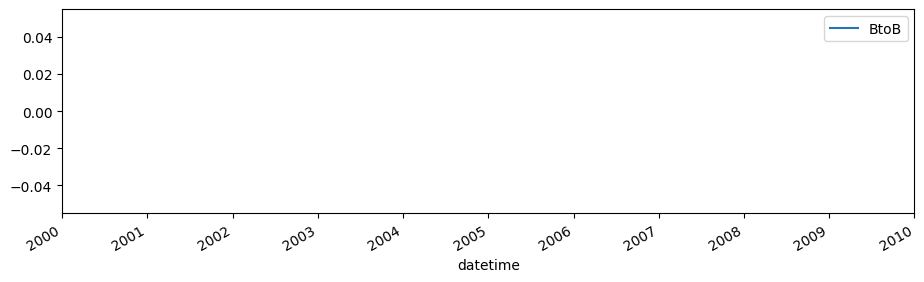

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/BB/2014_10_03-10_51_39_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_BB_008.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 008


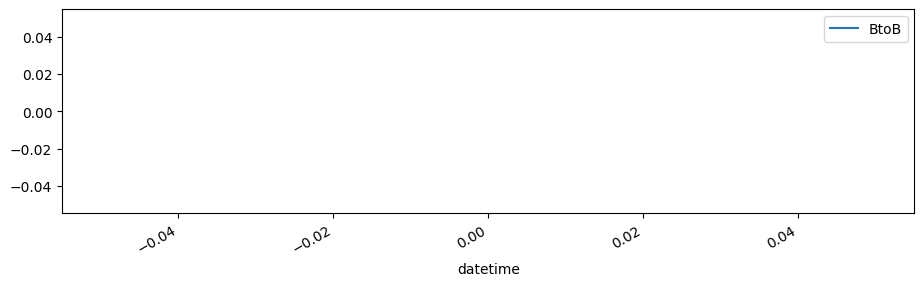

Detected CSV files for sensor 'breathing' in patient 008: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_01-06_43_00_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_02-10_13_52_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_03-22_54_51_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_03-10_51_39_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_01-06_43_00_Breathing.csv
Original CSV file size: 42.16 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_breathing_008.feather (12.23 MB)
Visualizing data for sensor 'breathing' in patient 008


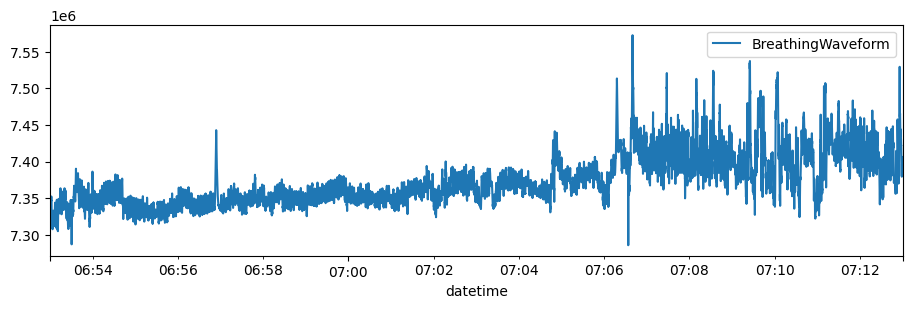

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_02-10_13_52_Breathing.csv
Original CSV file size: 47.27 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_breathing_008.feather (13.38 MB)
Visualizing data for sensor 'breathing' in patient 008


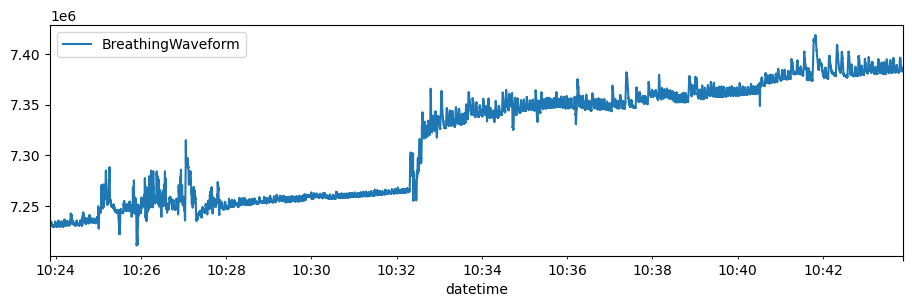

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_03-22_54_51_Breathing.csv
Original CSV file size: 25.19 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_breathing_008.feather (7.12 MB)
Visualizing data for sensor 'breathing' in patient 008


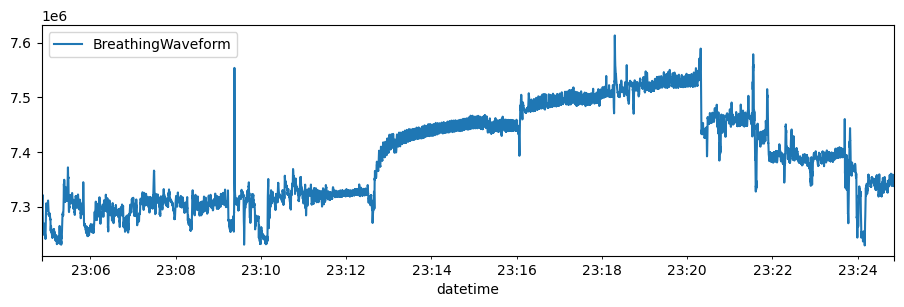

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/breathing/2014_10_03-10_51_39_Breathing.csv
Original CSV file size: 33.11 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_breathing_008.feather (9.44 MB)
Visualizing data for sensor 'breathing' in patient 008


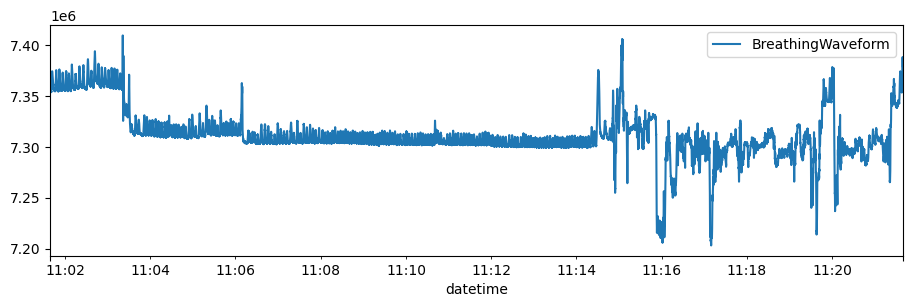

Detected CSV files for sensor 'RR' in patient 008: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_02-10_13_52_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_03-10_51_39_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_03-22_54_51_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_01-06_43_00_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_02-10_13_52_RR.csv
Original CSV file size: 0.33 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_RR_008.feather (0.20 MB)
Visualizing data for sensor 'RR' in patient 008


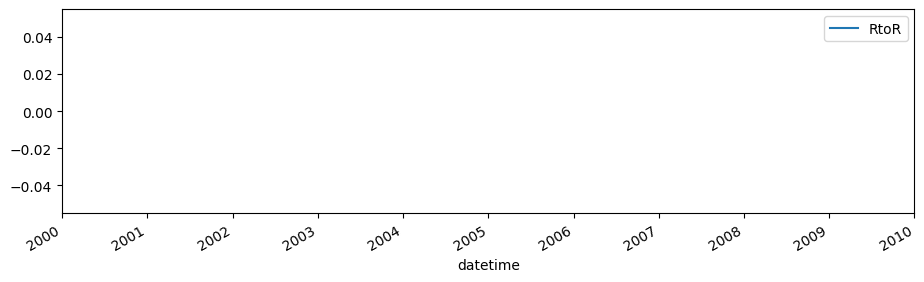

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_03-10_51_39_RR.csv
Original CSV file size: 0.27 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_RR_008.feather (0.16 MB)
Visualizing data for sensor 'RR' in patient 008


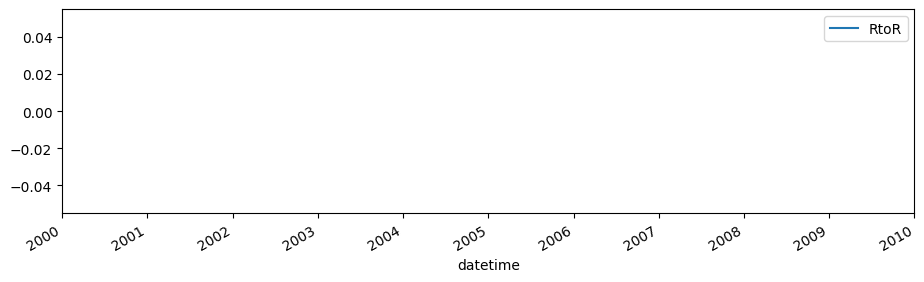

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_03-22_54_51_RR.csv
Original CSV file size: 0.13 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_RR_008.feather (0.08 MB)
Visualizing data for sensor 'RR' in patient 008


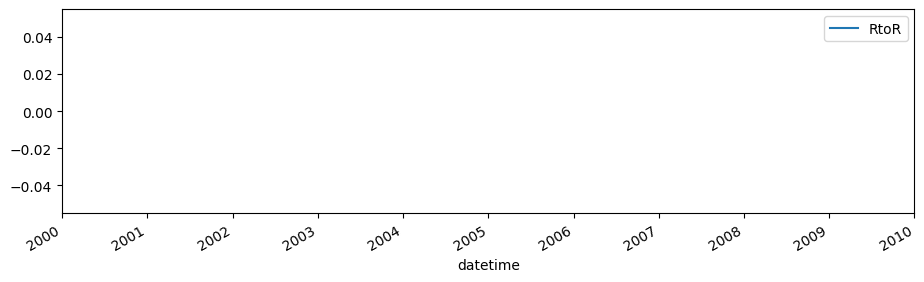

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/RR/2014_10_01-06_43_00_RR.csv
Original CSV file size: 0.35 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_RR_008.feather (0.22 MB)
Visualizing data for sensor 'RR' in patient 008


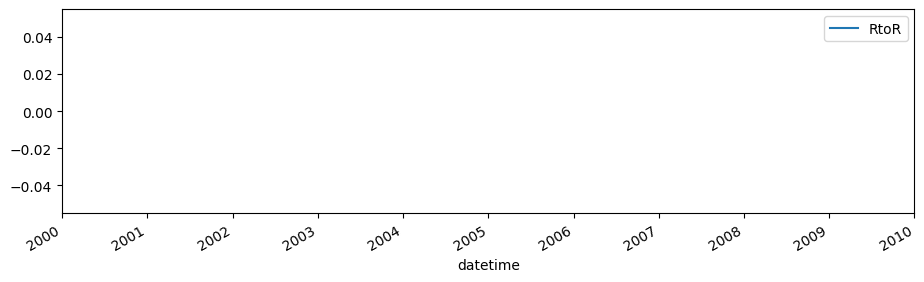

Detected CSV files for sensor 'summary' in patient 008: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_01-06_43_00_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_03-22_54_51_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_02-10_13_52_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_03-10_51_39_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_01-06_43_00_Summary.csv
Original CSV file size: 10.40 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_summary_008.feather (2.65 MB)
Visualizing data for sensor 'summary' in patient 008


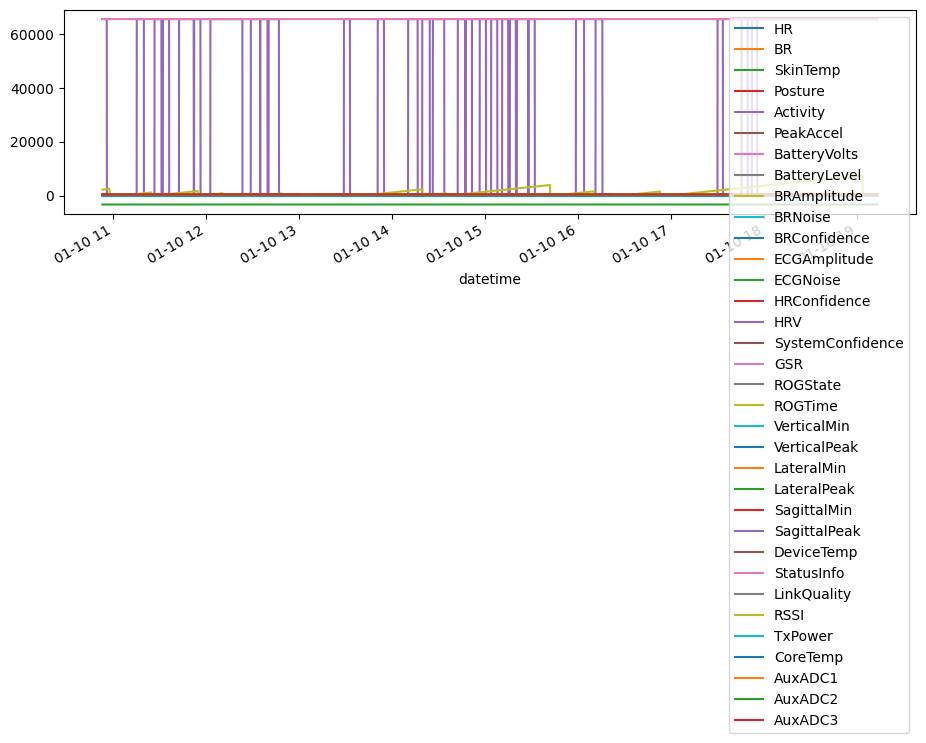

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_03-22_54_51_Summary.csv
Original CSV file size: 6.14 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_summary_008.feather (1.17 MB)
Visualizing data for sensor 'summary' in patient 008


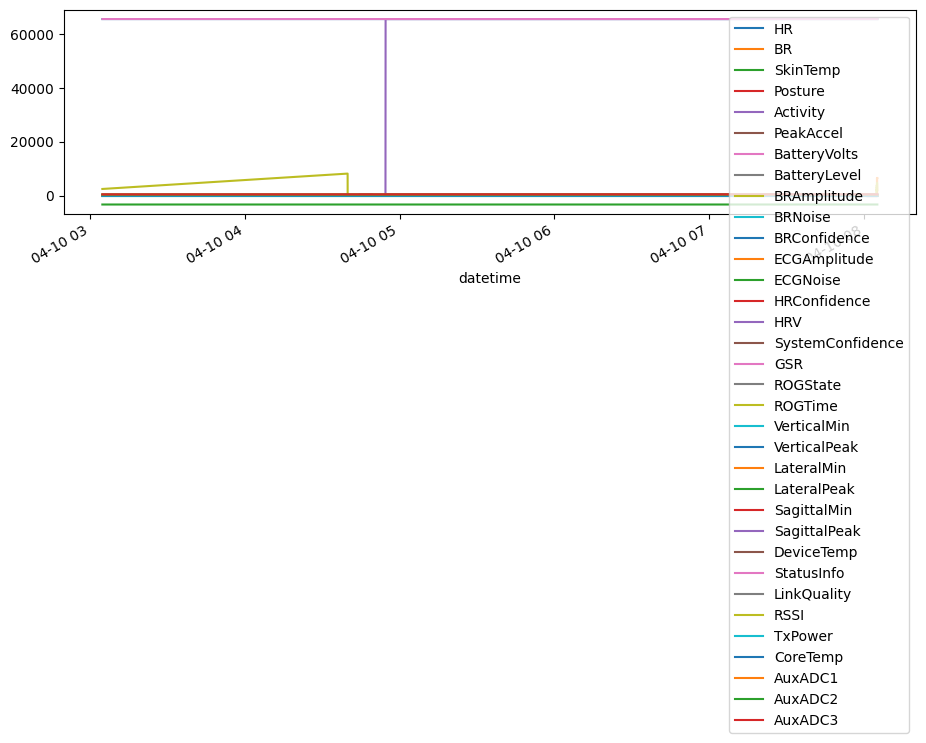

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_02-10_13_52_Summary.csv
Original CSV file size: 11.54 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_summary_008.feather (2.48 MB)
Visualizing data for sensor 'summary' in patient 008


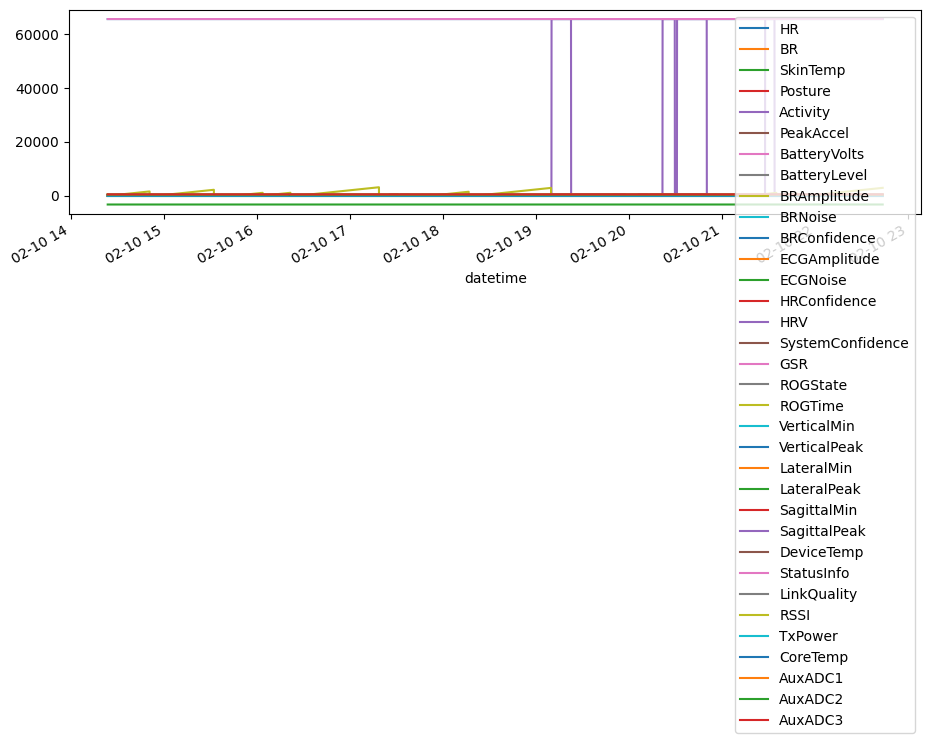

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/008/summary/2014_10_03-10_51_39_Summary.csv
Original CSV file size: 8.14 MB
Saved to feather: ../raw_data/sensor/008/d1namo_t1d_summary_008.feather (1.84 MB)
Visualizing data for sensor 'summary' in patient 008


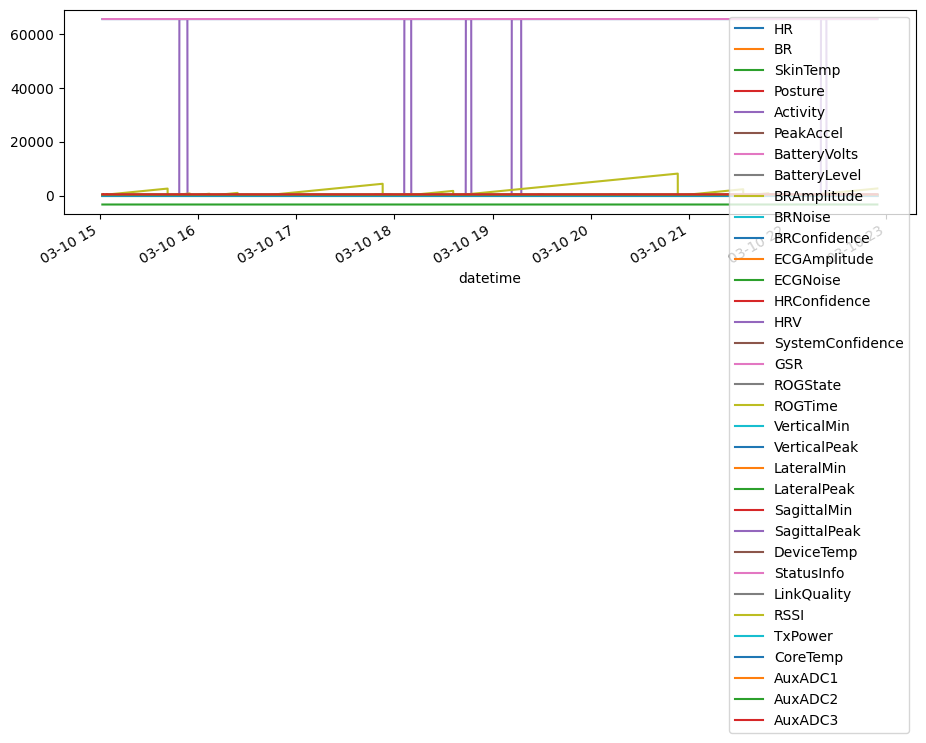


Processing data for patient 001 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001
Detected sensors for patient 001: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary']
Detected CSV files for sensor 'acceleration' in patient 001: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration/2014_10_02-10_56_44_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration/2014_10_01-10_09_39_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration/2014_10_04-06_34_57_Accel.csv', 

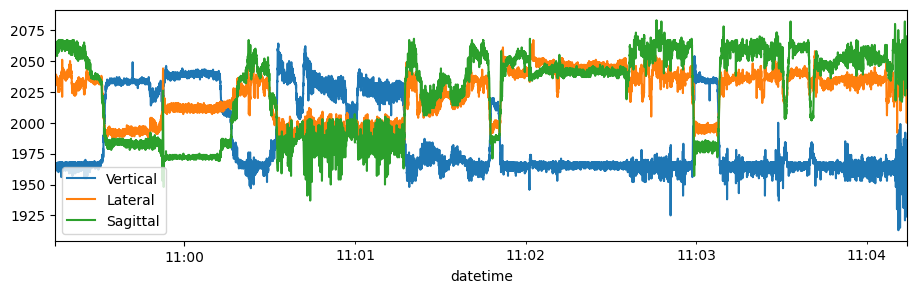

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration/2014_10_01-10_09_39_Accel.csv
Original CSV file size: 163.75 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_acceleration_001.feather (52.78 MB)
Visualizing data for sensor 'acceleration' in patient 001


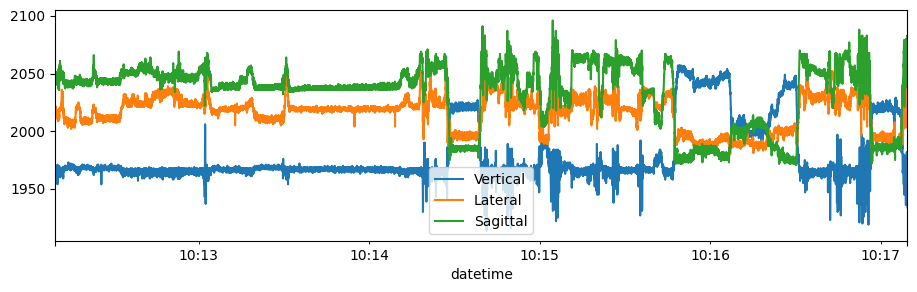

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration/2014_10_04-06_34_57_Accel.csv
Original CSV file size: 96.64 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_acceleration_001.feather (31.52 MB)
Visualizing data for sensor 'acceleration' in patient 001


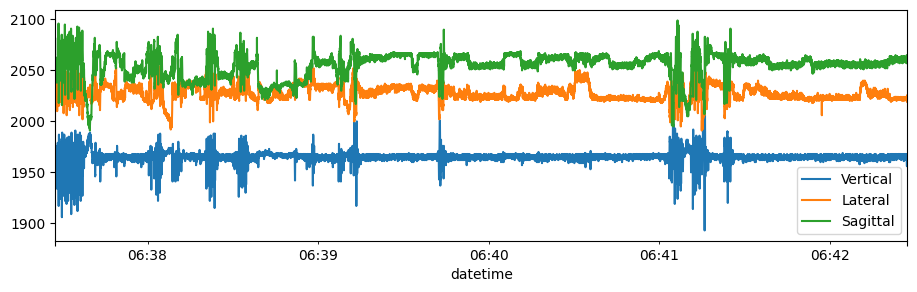

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/acceleration/2014_10_03-06_36_24_Accel.csv
Original CSV file size: 170.40 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_acceleration_001.feather (55.74 MB)
Visualizing data for sensor 'acceleration' in patient 001


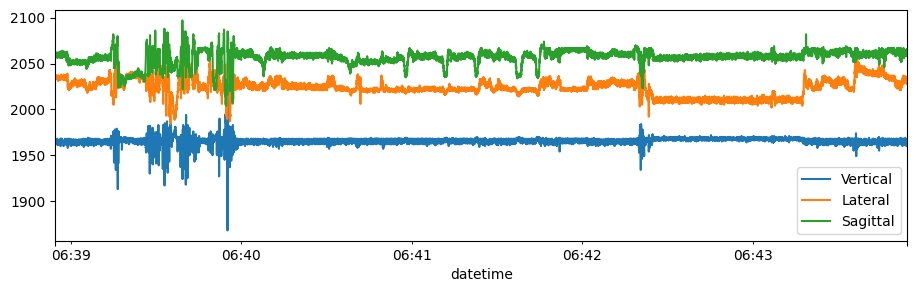

Detected CSV files for sensor 'BB' in patient 001: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_03-06_36_24_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_04-06_34_57_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_01-10_09_39_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_02-10_56_44_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_03-06_36_24_BB.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_BB_001.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 001


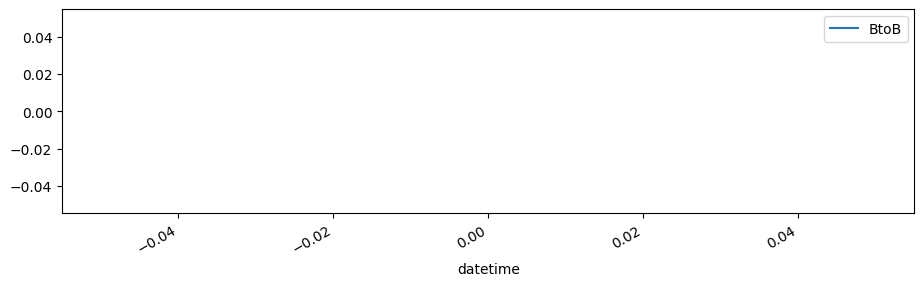

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_04-06_34_57_BB.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_BB_001.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 001


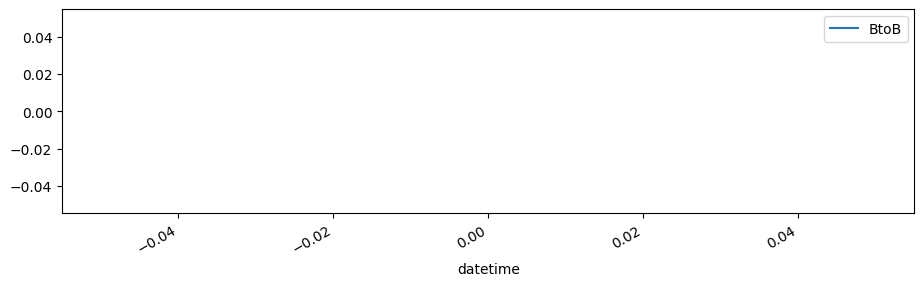

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_01-10_09_39_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_BB_001.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 001


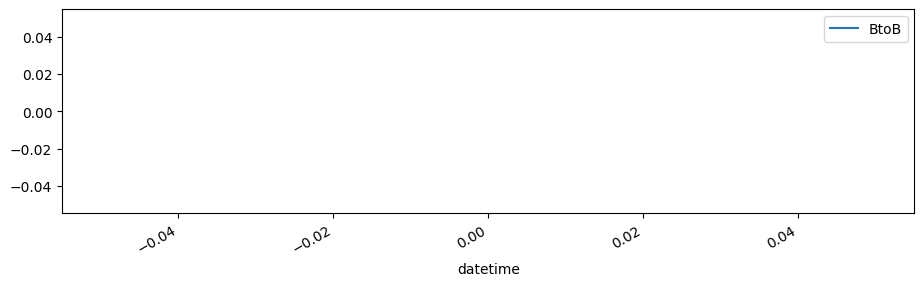

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/BB/2014_10_02-10_56_44_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_BB_001.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 001


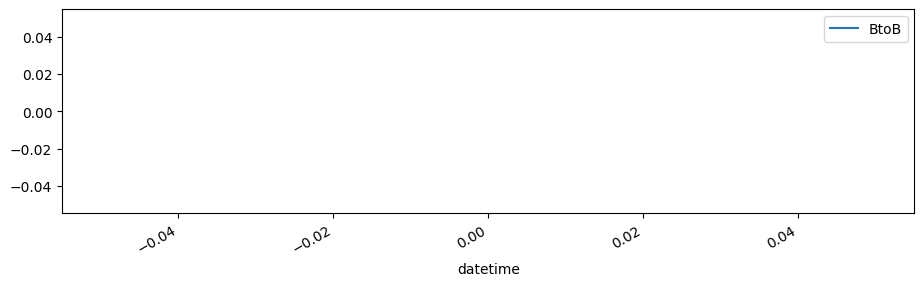

Detected CSV files for sensor 'breathing' in patient 001: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_02-10_56_44_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_01-10_09_39_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_03-06_36_24_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_04-06_34_57_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_02-10_56_44_Breathing.csv
Original CSV file size: 29.50 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_breathing_001.feather (8.73 MB)
Visualizing data for sensor 'breathing' in patient 001


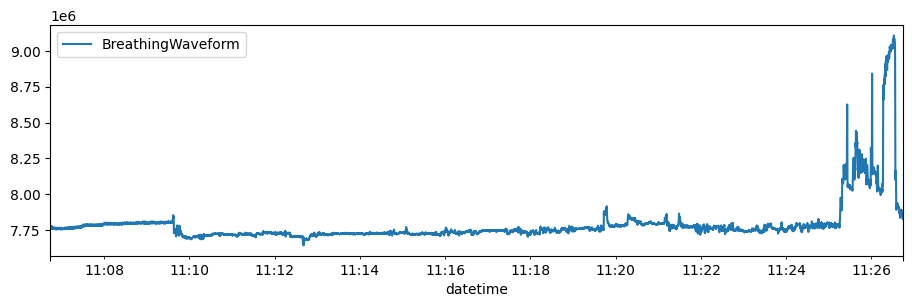

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_01-10_09_39_Breathing.csv
Original CSV file size: 33.59 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_breathing_001.feather (9.81 MB)
Visualizing data for sensor 'breathing' in patient 001


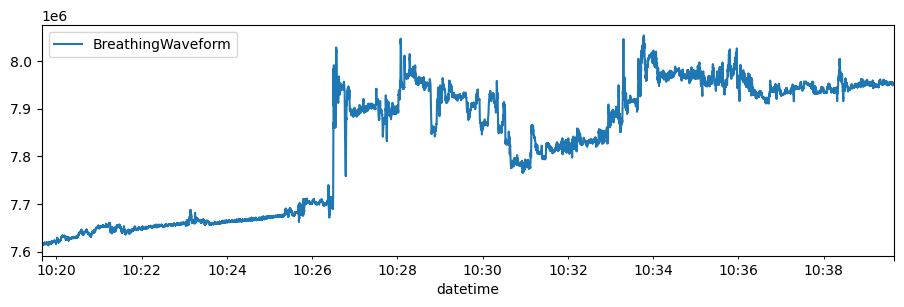

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_03-06_36_24_Breathing.csv
Original CSV file size: 34.95 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_breathing_001.feather (10.44 MB)
Visualizing data for sensor 'breathing' in patient 001


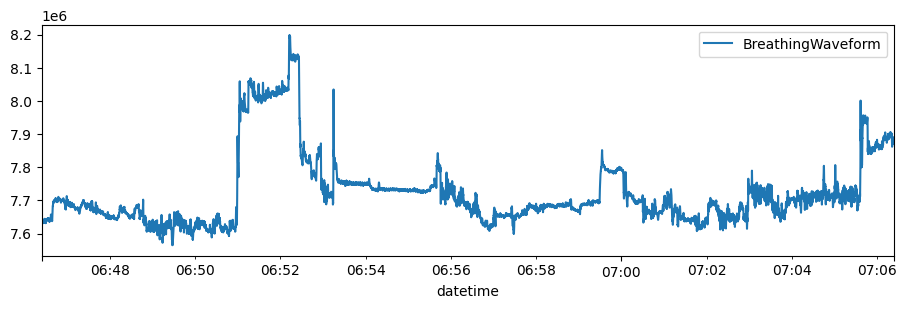

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/breathing/2014_10_04-06_34_57_Breathing.csv
Original CSV file size: 19.82 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_breathing_001.feather (5.86 MB)
Visualizing data for sensor 'breathing' in patient 001


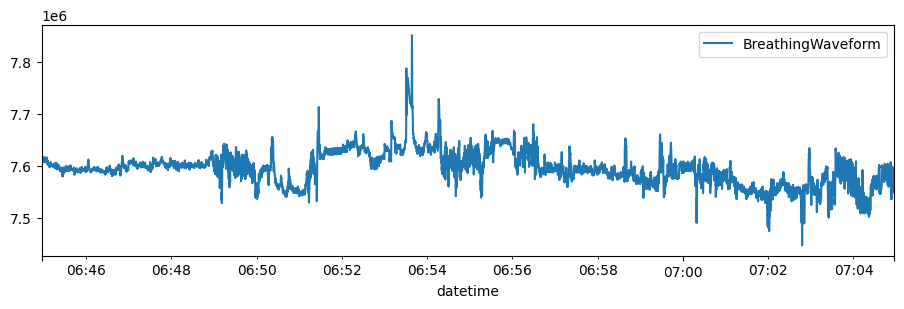

Detected CSV files for sensor 'RR' in patient 001: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_04-06_34_57_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_02-10_56_44_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_01-10_09_39_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_03-06_36_24_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_04-06_34_57_RR.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_RR_001.feather (0.01 MB)
Visualizing data for sensor 'RR' in patient 001


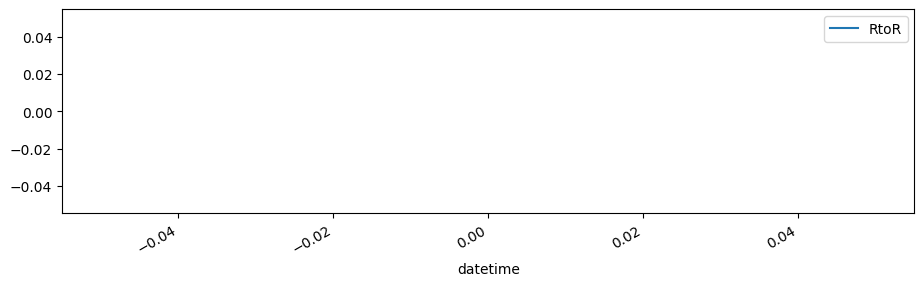

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_02-10_56_44_RR.csv
Original CSV file size: 0.11 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_RR_001.feather (0.07 MB)
Visualizing data for sensor 'RR' in patient 001


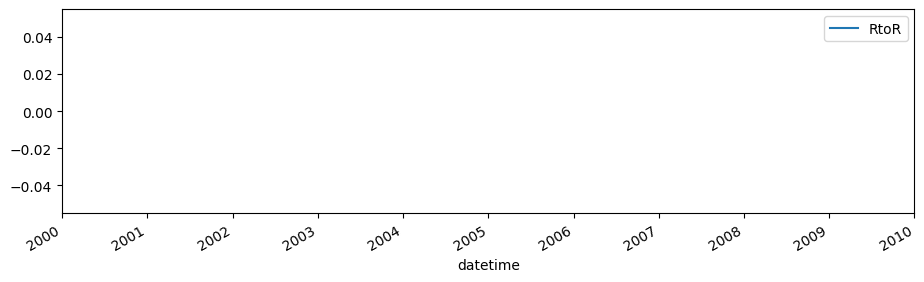

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_01-10_09_39_RR.csv
Original CSV file size: 0.23 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_RR_001.feather (0.14 MB)
Visualizing data for sensor 'RR' in patient 001


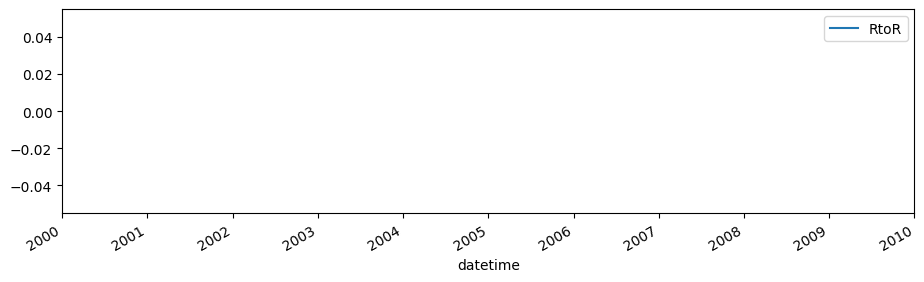

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/RR/2014_10_03-06_36_24_RR.csv
Original CSV file size: 0.12 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_RR_001.feather (0.08 MB)
Visualizing data for sensor 'RR' in patient 001


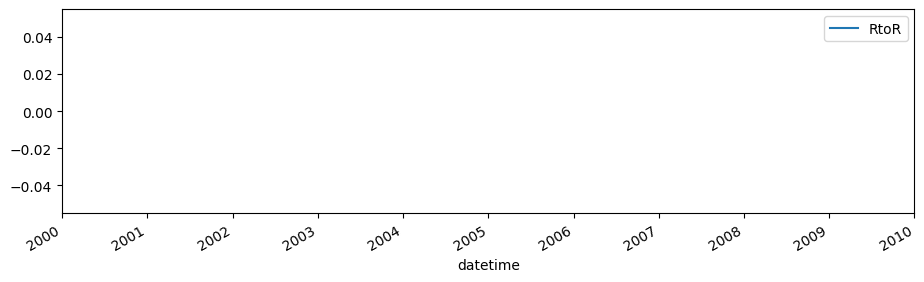

Detected CSV files for sensor 'summary' in patient 001: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_04-06_34_57_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_02-10_56_44_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_03-06_36_24_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_01-10_09_39_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_04-06_34_57_Summary.csv
Original CSV file size: 4.83 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_summary_001.feather (1.08 MB)
Visualizing data for sensor 'summary' in patient 001


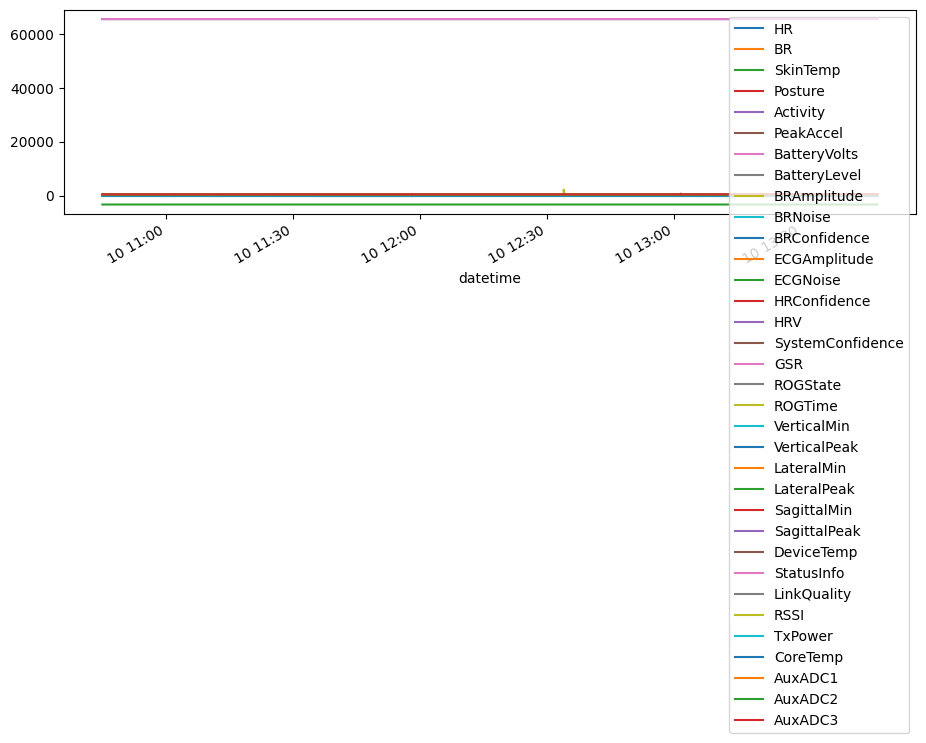

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_02-10_56_44_Summary.csv
Original CSV file size: 7.23 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_summary_001.feather (1.73 MB)
Visualizing data for sensor 'summary' in patient 001


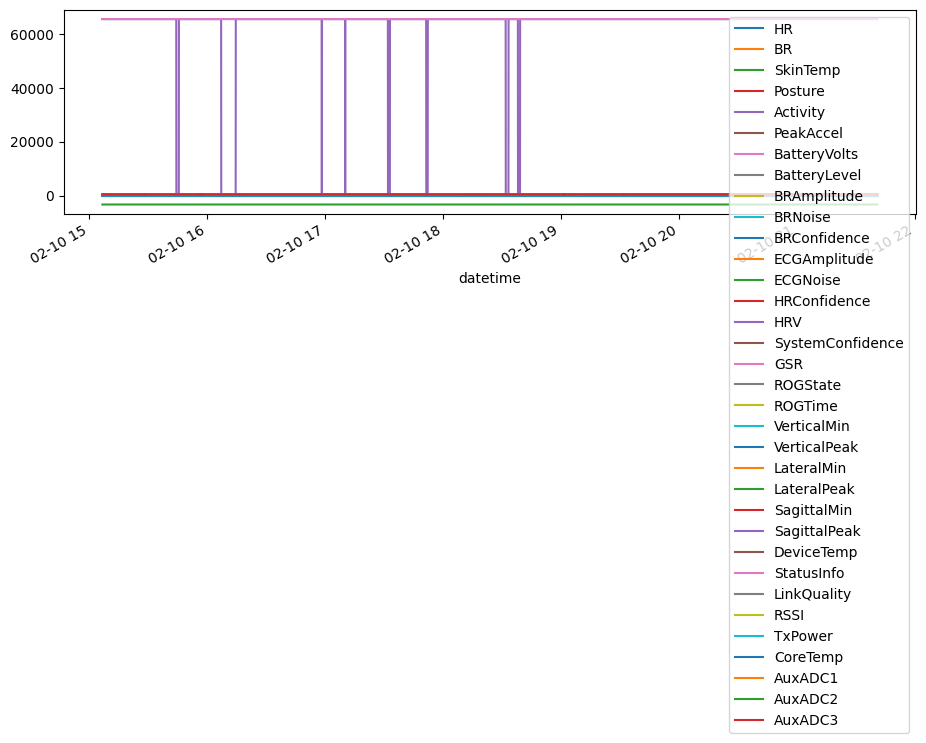

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_03-06_36_24_Summary.csv
Original CSV file size: 8.58 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_summary_001.feather (2.05 MB)
Visualizing data for sensor 'summary' in patient 001


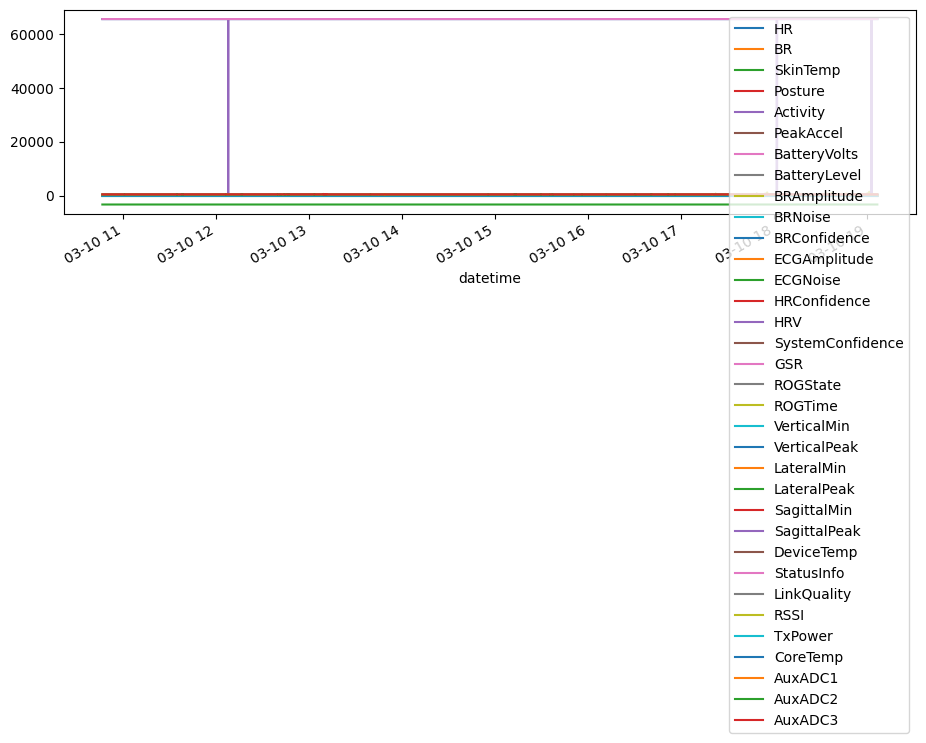

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/001/summary/2014_10_01-10_09_39_Summary.csv
Original CSV file size: 8.27 MB
Saved to feather: ../raw_data/sensor/001/d1namo_t1d_summary_001.feather (1.90 MB)
Visualizing data for sensor 'summary' in patient 001


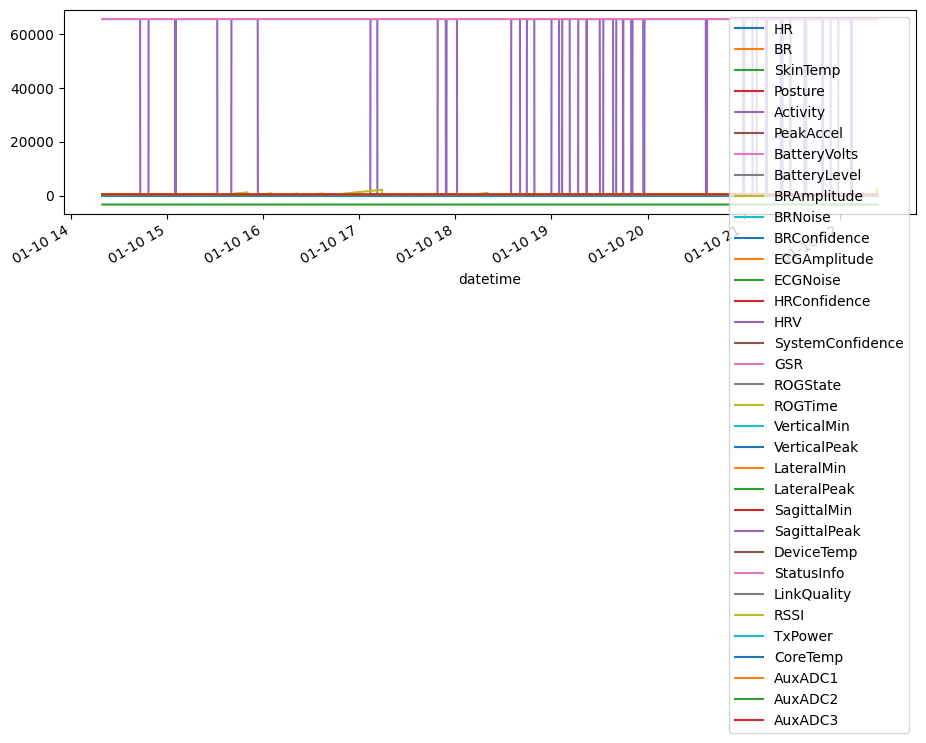


Processing data for patient 006 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006
Detected sensors for patient 006: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary']
Detected CSV files for sensor 'acceleration' in patient 006: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_01-15_08_04_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_03-08_57_56_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_02-08_03_53_Accel.csv', 

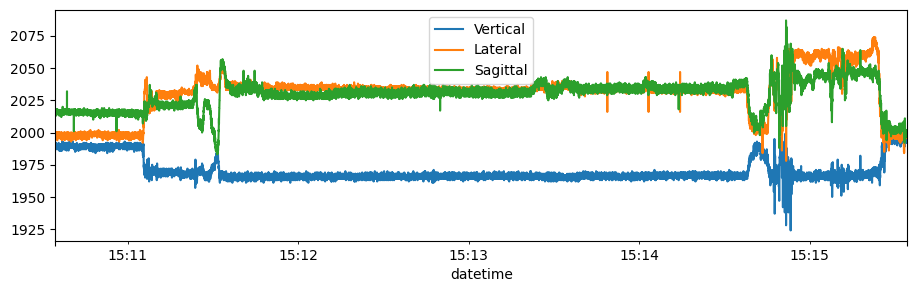

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_03-08_57_56_Accel.csv
Original CSV file size: 186.73 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_acceleration_006.feather (61.53 MB)
Visualizing data for sensor 'acceleration' in patient 006


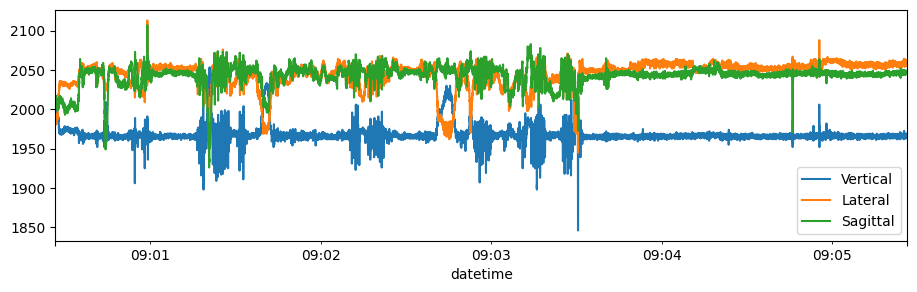

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_02-08_03_53_Accel.csv
Original CSV file size: 63.52 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_acceleration_006.feather (21.13 MB)
Visualizing data for sensor 'acceleration' in patient 006


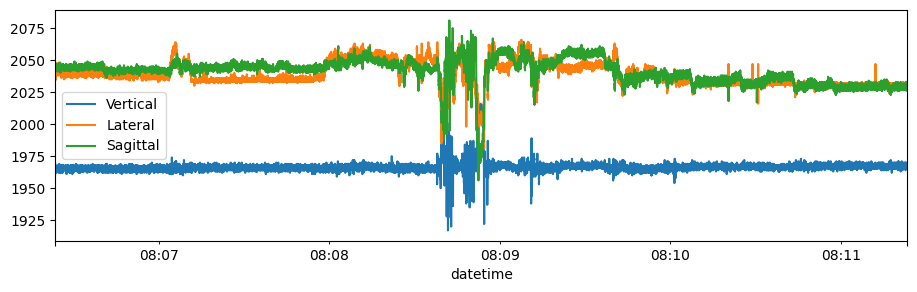

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_01-06_46_44_Accel.csv
Original CSV file size: 111.88 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_acceleration_006.feather (36.81 MB)
Visualizing data for sensor 'acceleration' in patient 006


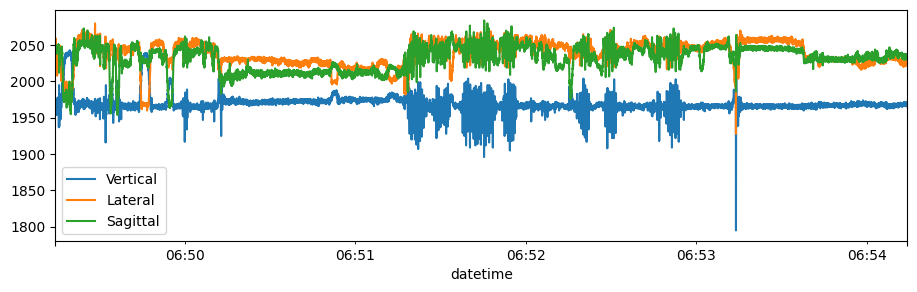

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_04-10_30_26_Accel.csv
Original CSV file size: 153.24 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_acceleration_006.feather (49.38 MB)
Visualizing data for sensor 'acceleration' in patient 006


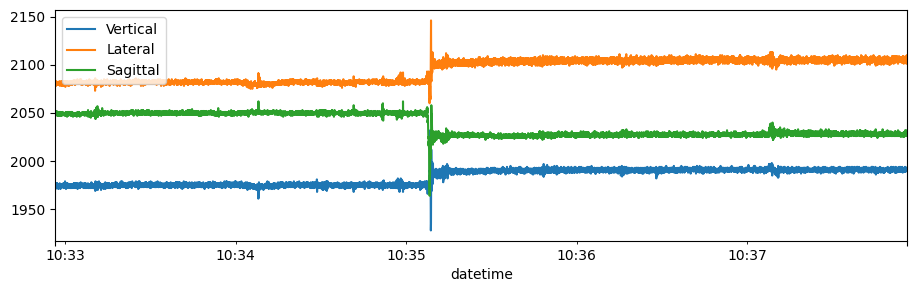

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/acceleration/2014_10_02-15_13_03_Accel.csv
Original CSV file size: 85.11 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_acceleration_006.feather (27.86 MB)
Visualizing data for sensor 'acceleration' in patient 006


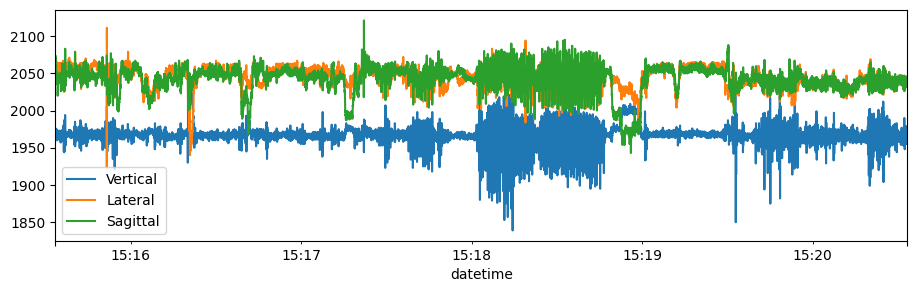

Detected CSV files for sensor 'BB' in patient 006: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_01-06_46_44_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_02-15_13_03_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_03-08_57_56_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_02-08_03_53_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_01-15_08_04_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_04-10_30_26_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_01-06_46_44_BB.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_BB_006.feather (0.03 MB)
Visualizing data for sensor 'BB' in patient 006


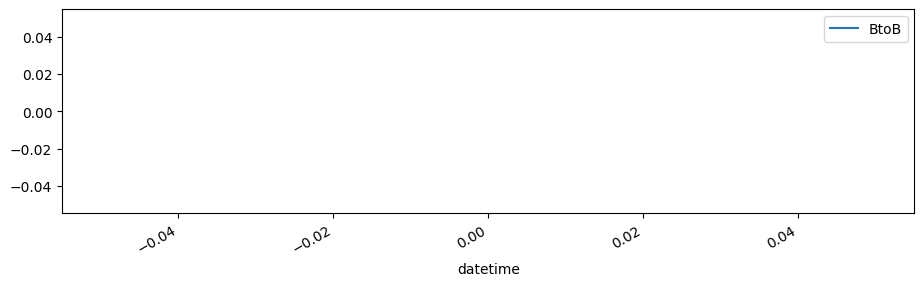

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_02-15_13_03_BB.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_BB_006.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 006


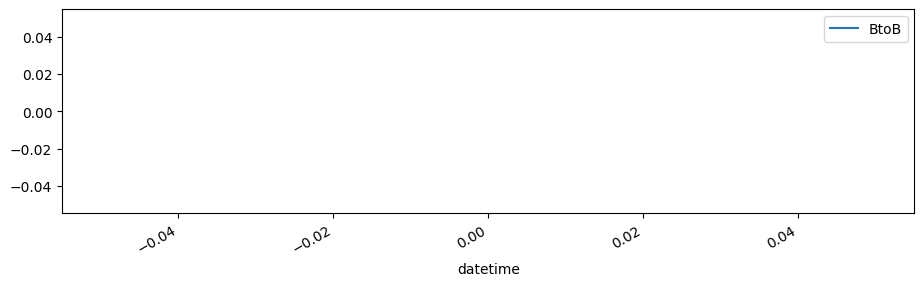

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_03-08_57_56_BB.csv
Original CSV file size: 0.10 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_BB_006.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 006


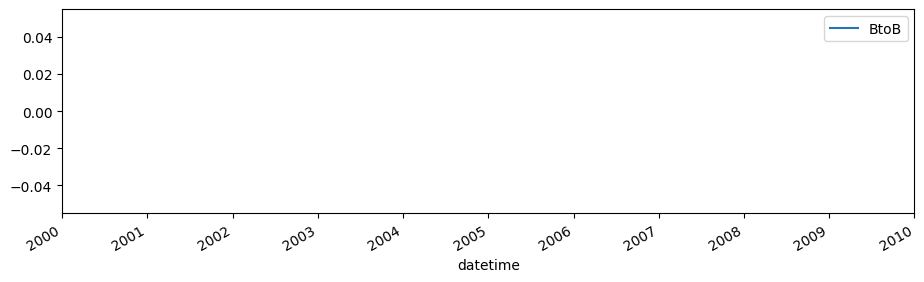

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_02-08_03_53_BB.csv
Original CSV file size: 0.03 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_BB_006.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 006


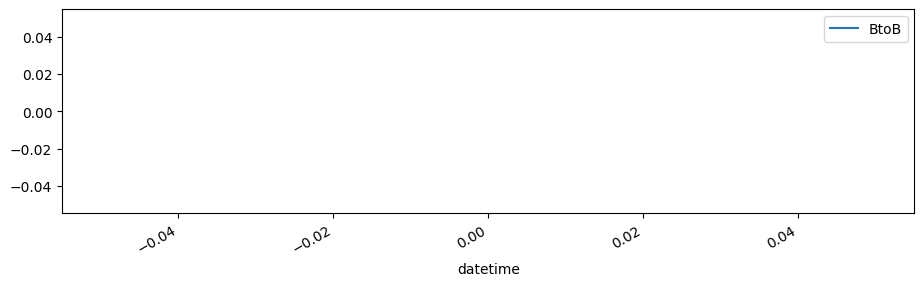

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_01-15_08_04_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_BB_006.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 006


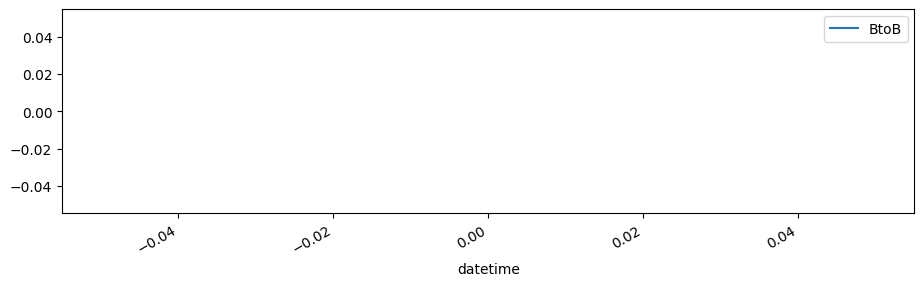

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/BB/2014_10_04-10_30_26_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_BB_006.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 006


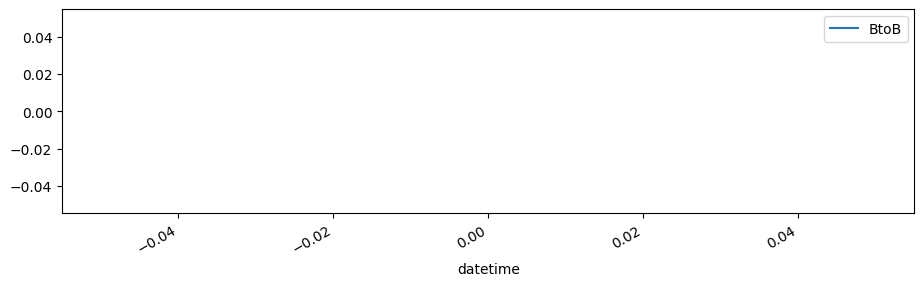

Detected CSV files for sensor 'breathing' in patient 006: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_01-15_08_04_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_02-15_13_03_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_01-06_46_44_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_02-08_03_53_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_04-10_30_26_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_03-08_57_56_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_01-15_08_04_Breathing.csv
Original CSV file size: 30.37 MB
Saved to feather: ../raw_data/sensor/006/d1namo

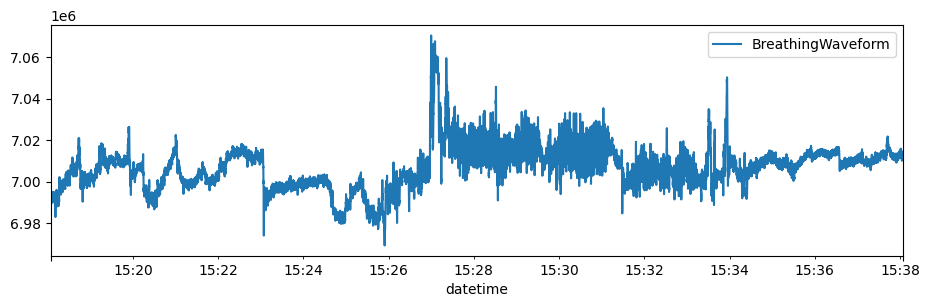

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_02-15_13_03_Breathing.csv
Original CSV file size: 17.46 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_breathing_006.feather (5.06 MB)
Visualizing data for sensor 'breathing' in patient 006


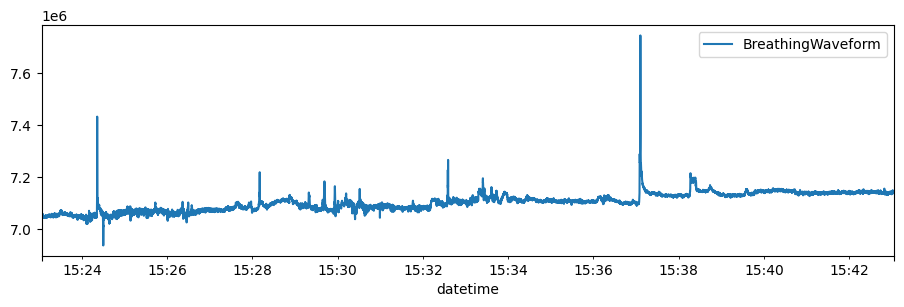

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_01-06_46_44_Breathing.csv
Original CSV file size: 22.95 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_breathing_006.feather (6.56 MB)
Visualizing data for sensor 'breathing' in patient 006


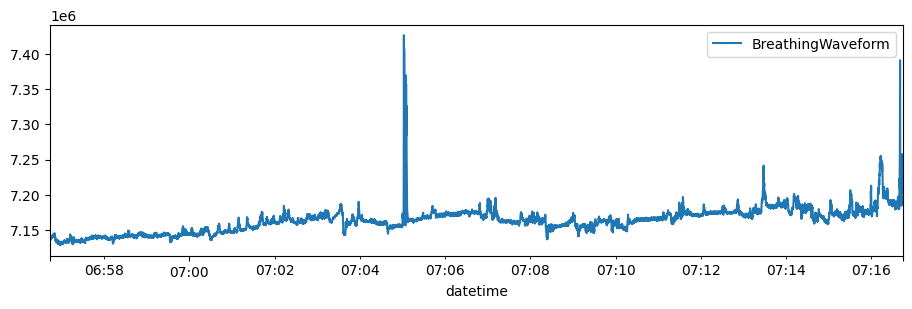

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_02-08_03_53_Breathing.csv
Original CSV file size: 13.03 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_breathing_006.feather (3.75 MB)
Visualizing data for sensor 'breathing' in patient 006


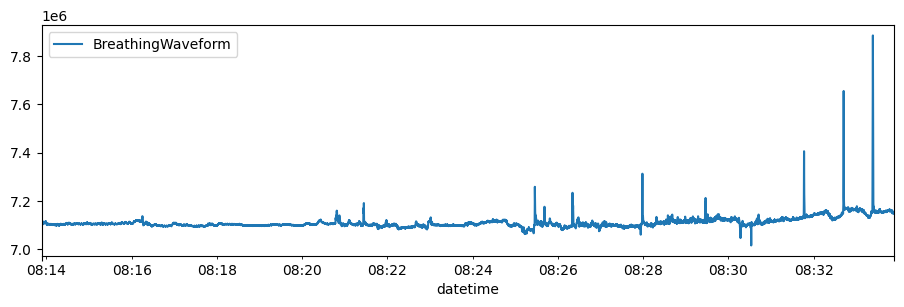

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_04-10_30_26_Breathing.csv
Original CSV file size: 31.43 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_breathing_006.feather (8.96 MB)
Visualizing data for sensor 'breathing' in patient 006


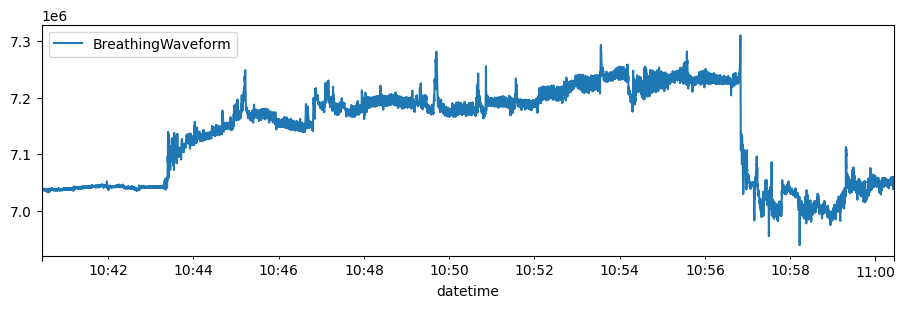

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/breathing/2014_10_03-08_57_56_Breathing.csv
Original CSV file size: 38.30 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_breathing_006.feather (11.00 MB)
Visualizing data for sensor 'breathing' in patient 006


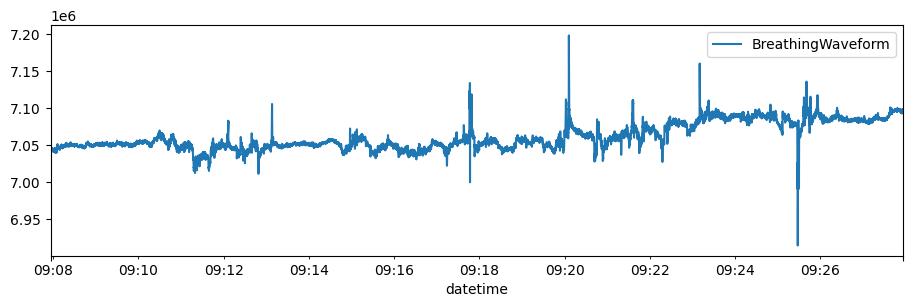

Detected CSV files for sensor 'RR' in patient 006: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_03-08_57_56_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_02-08_03_53_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_01-15_08_04_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_04-10_30_26_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_01-06_46_44_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_02-15_13_03_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_03-08_57_56_RR.csv
Original CSV file size: 0.29 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_RR_006.feather (0.18 MB)
Visualizing data for sensor 'RR' in patient 006


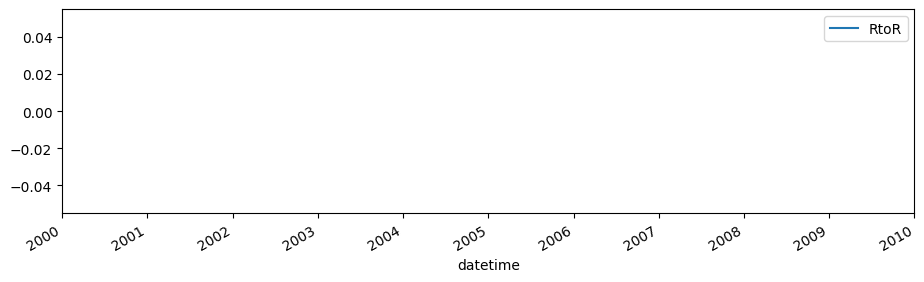

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_02-08_03_53_RR.csv
Original CSV file size: 0.15 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_RR_006.feather (0.09 MB)
Visualizing data for sensor 'RR' in patient 006


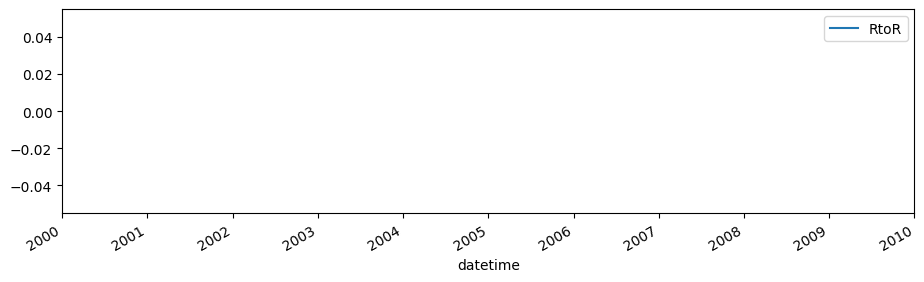

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_01-15_08_04_RR.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_RR_006.feather (0.04 MB)
Visualizing data for sensor 'RR' in patient 006


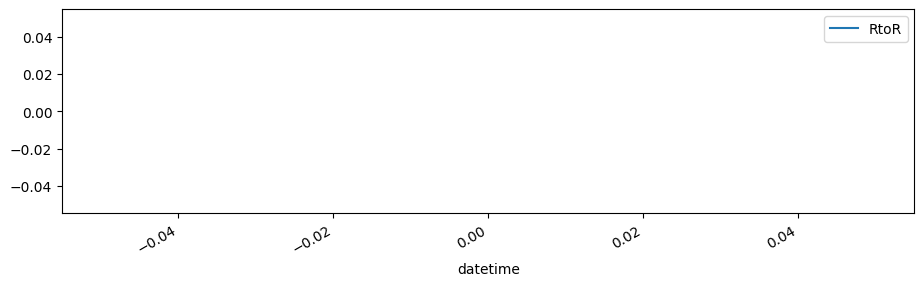

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_04-10_30_26_RR.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_RR_006.feather (0.05 MB)
Visualizing data for sensor 'RR' in patient 006


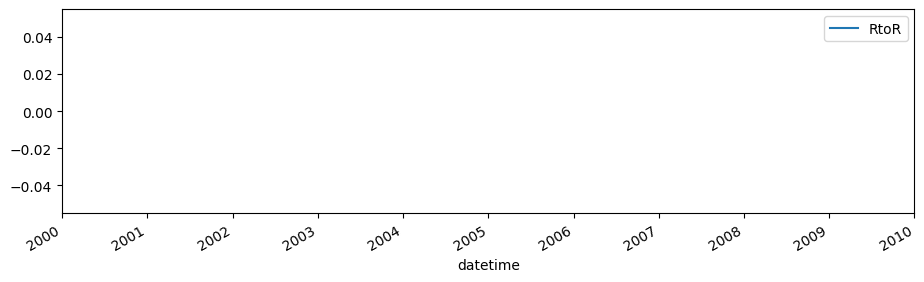

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_01-06_46_44_RR.csv
Original CSV file size: 0.13 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_RR_006.feather (0.08 MB)
Visualizing data for sensor 'RR' in patient 006


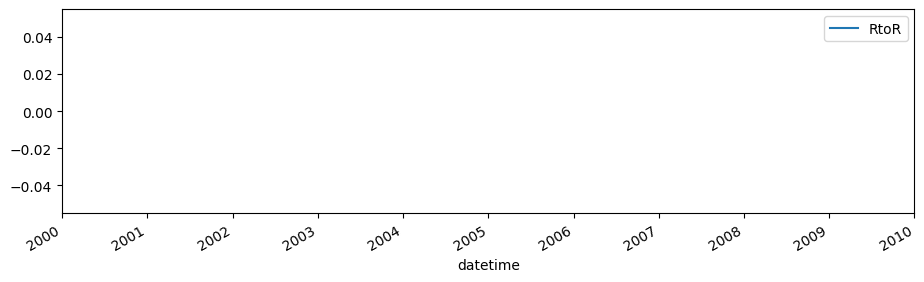

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/RR/2014_10_02-15_13_03_RR.csv
Original CSV file size: 0.16 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_RR_006.feather (0.10 MB)
Visualizing data for sensor 'RR' in patient 006


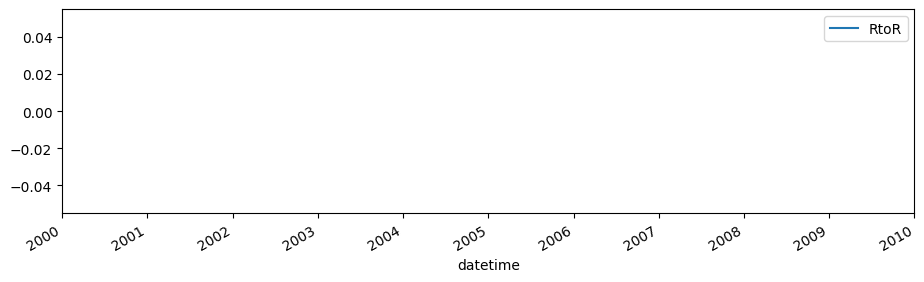

Detected CSV files for sensor 'summary' in patient 006: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_01-06_46_44_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_02-08_03_53_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_04-10_30_26_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_03-08_57_56_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_01-15_08_04_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_02-15_13_03_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_01-06_46_44_Summary.csv
Original CSV file size: 5.62 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_summary_006.feather (1.32 

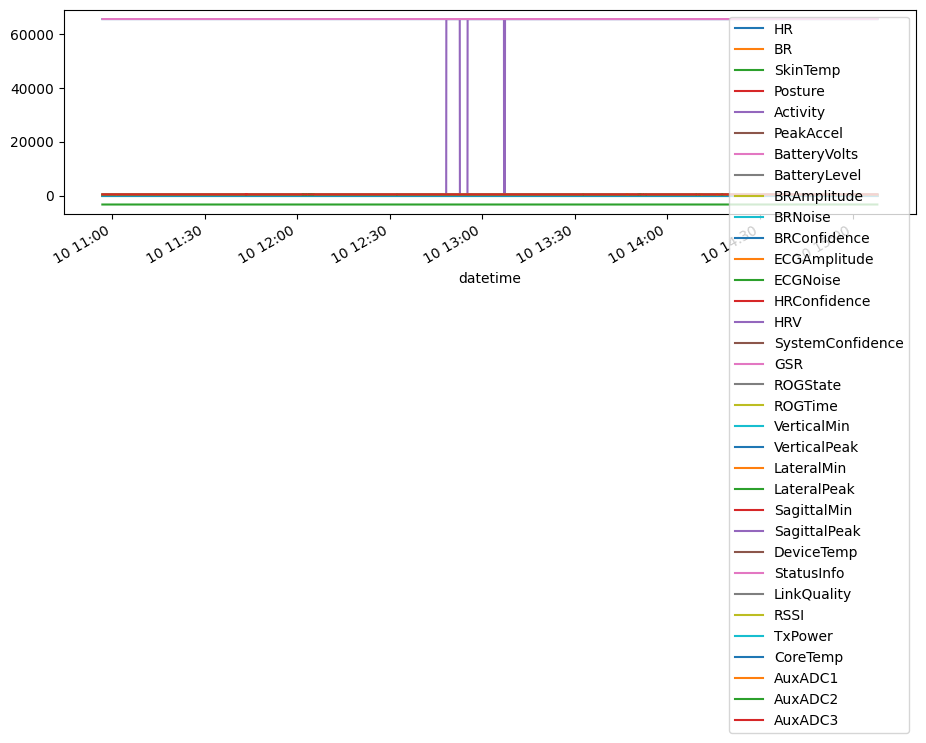

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_02-08_03_53_Summary.csv
Original CSV file size: 3.22 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_summary_006.feather (0.81 MB)
Visualizing data for sensor 'summary' in patient 006


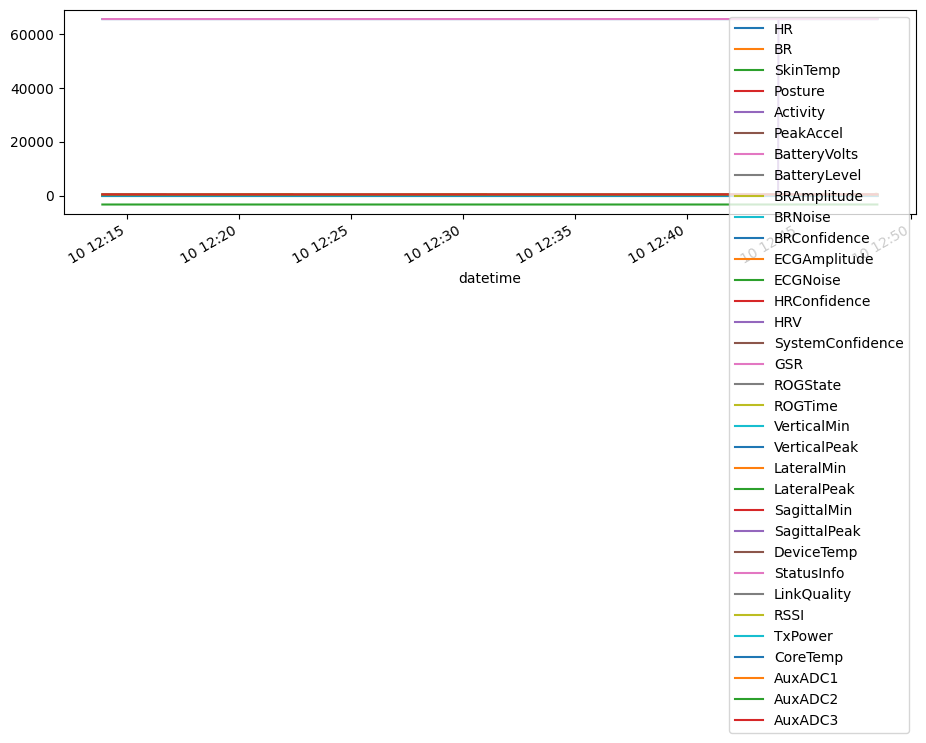

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_04-10_30_26_Summary.csv
Original CSV file size: 7.65 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_summary_006.feather (1.58 MB)
Visualizing data for sensor 'summary' in patient 006


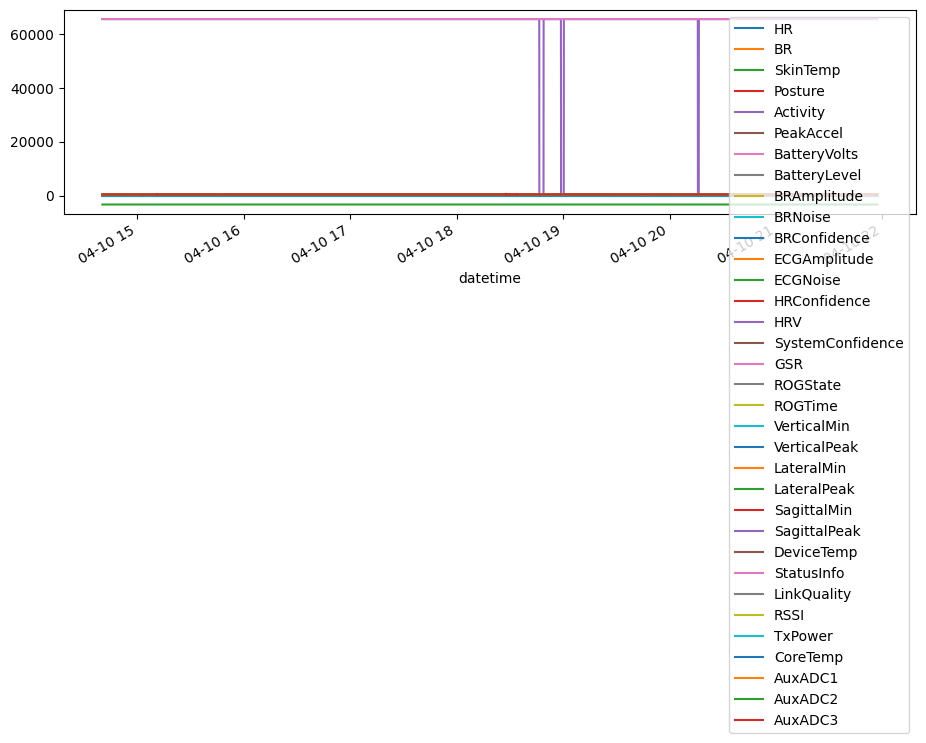

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_03-08_57_56_Summary.csv
Original CSV file size: 9.45 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_summary_006.feather (2.25 MB)
Visualizing data for sensor 'summary' in patient 006


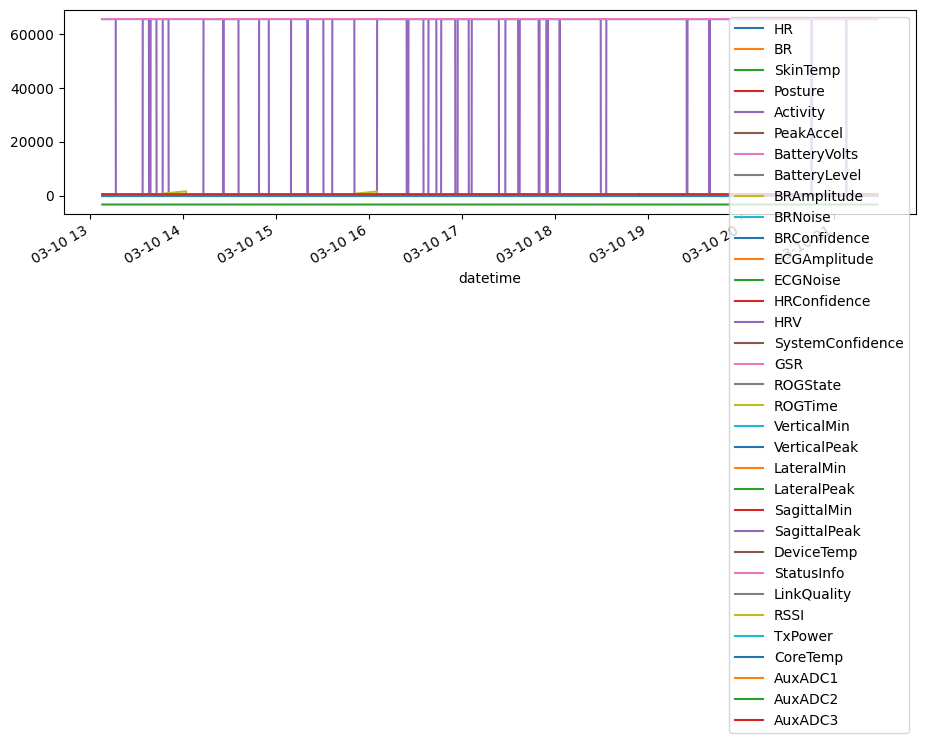

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_01-15_08_04_Summary.csv
Original CSV file size: 7.40 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_summary_006.feather (1.62 MB)
Visualizing data for sensor 'summary' in patient 006


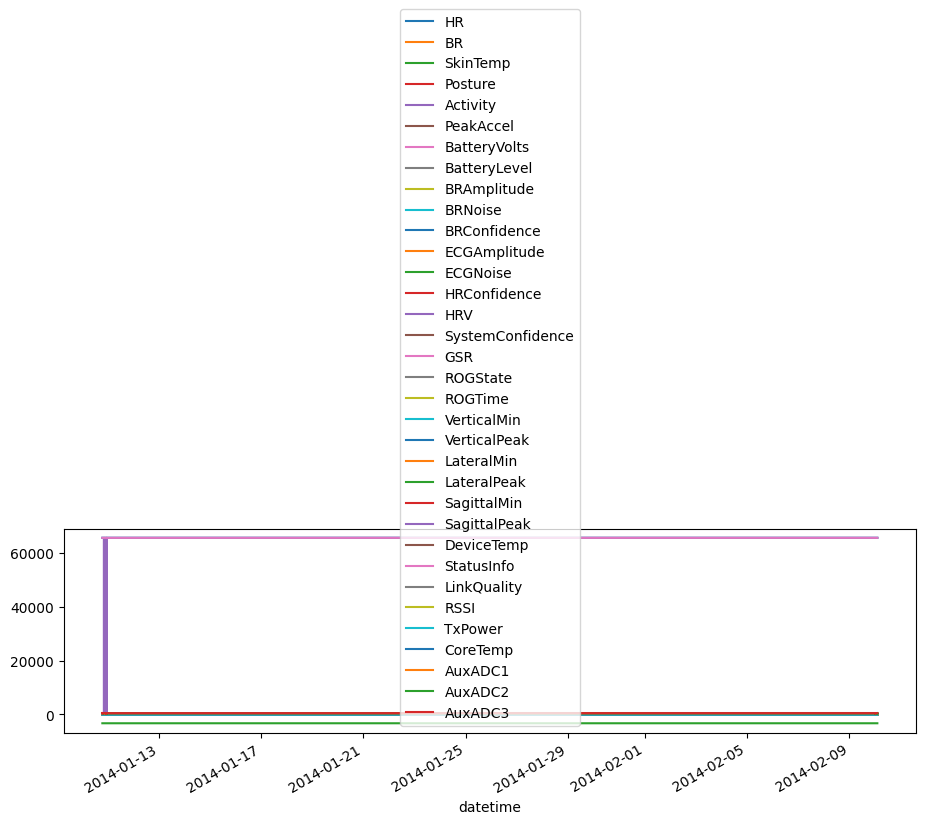

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/006/summary/2014_10_02-15_13_03_Summary.csv
Original CSV file size: 4.30 MB
Saved to feather: ../raw_data/sensor/006/d1namo_t1d_summary_006.feather (1.00 MB)
Visualizing data for sensor 'summary' in patient 006


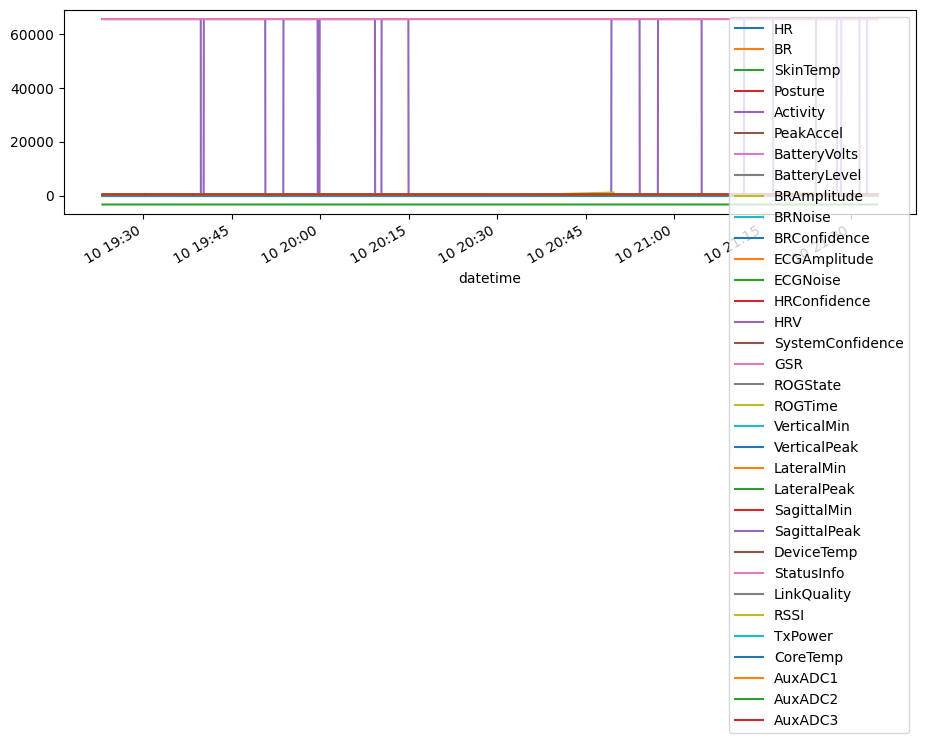


Processing data for patient 003 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003
Detected sensors for patient 003: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary']
Detected CSV files for sensor 'acceleration' in patient 003: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_04-05_33_24_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_03-18_06_15_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_02-09_24_32_Accel.csv', 

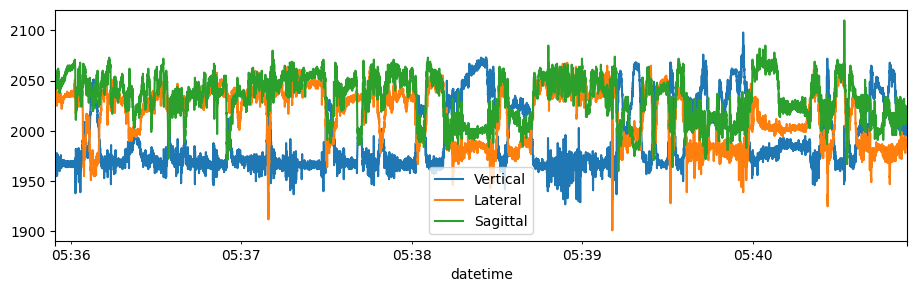

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_03-18_06_15_Accel.csv
Original CSV file size: 45.86 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_acceleration_003.feather (15.05 MB)
Visualizing data for sensor 'acceleration' in patient 003


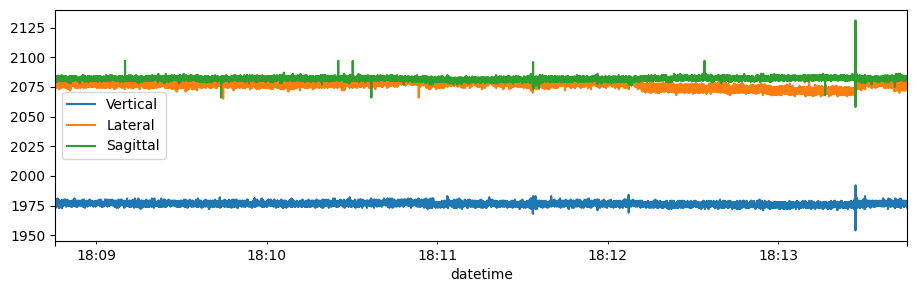

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_02-09_24_32_Accel.csv
Original CSV file size: 207.57 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_acceleration_003.feather (68.96 MB)
Visualizing data for sensor 'acceleration' in patient 003


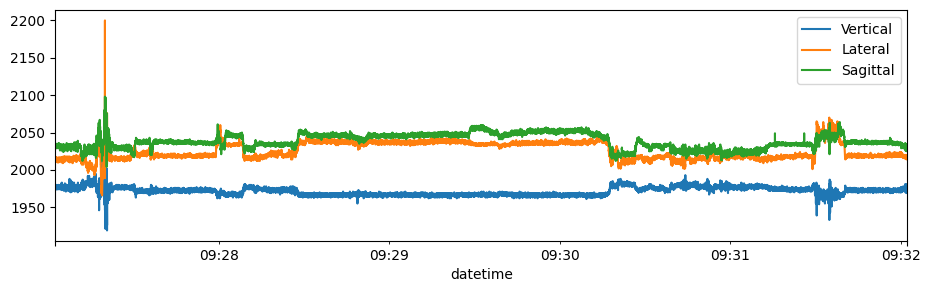

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_01-06_00_57_Accel.csv
Original CSV file size: 216.78 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_acceleration_003.feather (72.03 MB)
Visualizing data for sensor 'acceleration' in patient 003


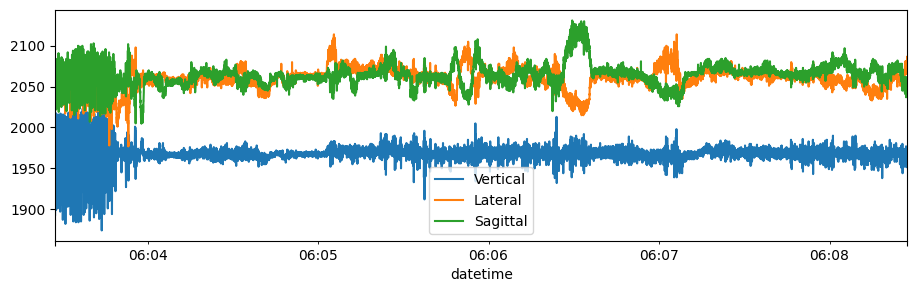

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/acceleration/2014_10_03-00_54_40_Accel.csv
Original CSV file size: 53.90 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_acceleration_003.feather (17.74 MB)
Visualizing data for sensor 'acceleration' in patient 003


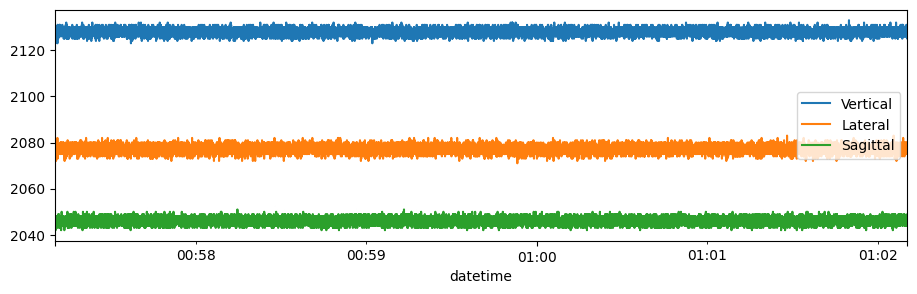

Detected CSV files for sensor 'BB' in patient 003: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_04-05_33_24_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_01-06_00_57_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_03-18_06_15_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_03-00_54_40_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_02-09_24_32_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_04-05_33_24_BB.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_BB_003.feather (0.03 MB)
Visualizing data for sensor 'BB' in patient 003


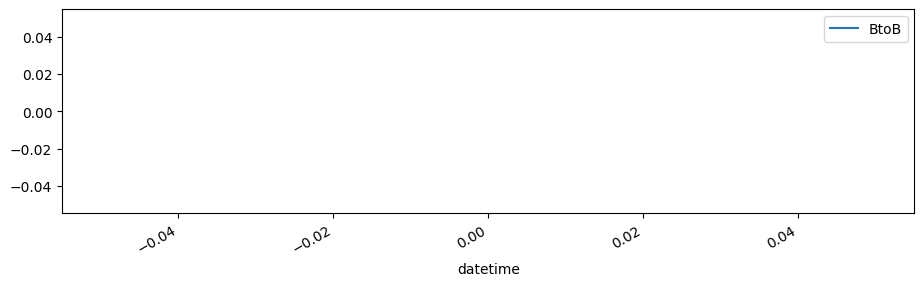

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_01-06_00_57_BB.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_BB_003.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 003


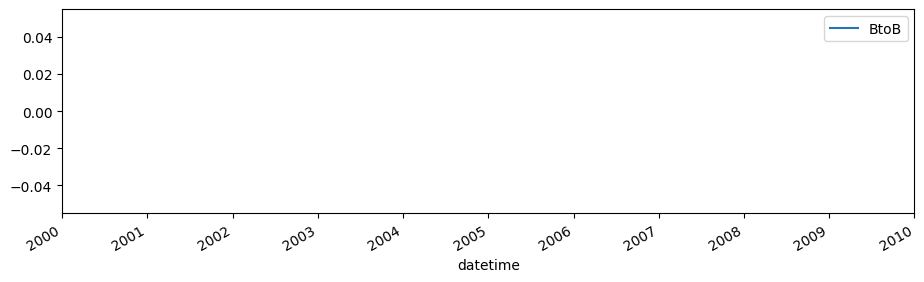

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_03-18_06_15_BB.csv
Original CSV file size: 0.02 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_BB_003.feather (0.01 MB)
Visualizing data for sensor 'BB' in patient 003


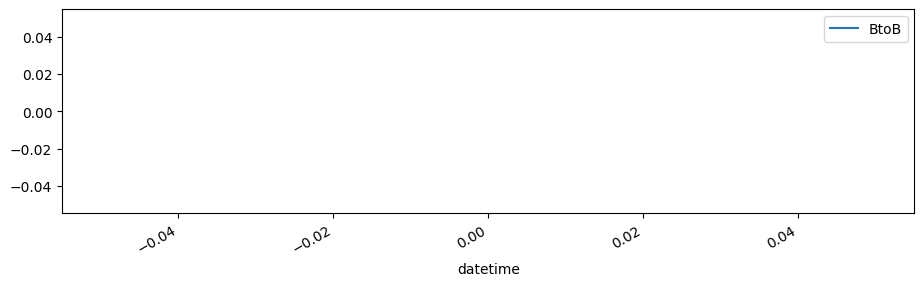

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_03-00_54_40_BB.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_BB_003.feather (0.00 MB)
Visualizing data for sensor 'BB' in patient 003
Error processing file /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_03-00_54_40_BB.csv: no numeric data to plot. Skipping...
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/BB/2014_10_02-09_24_32_BB.csv
Original CSV file size: 0.03 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_BB_003.feather (0.02 MB)
Visualizing data for sensor 'BB' in patient 003


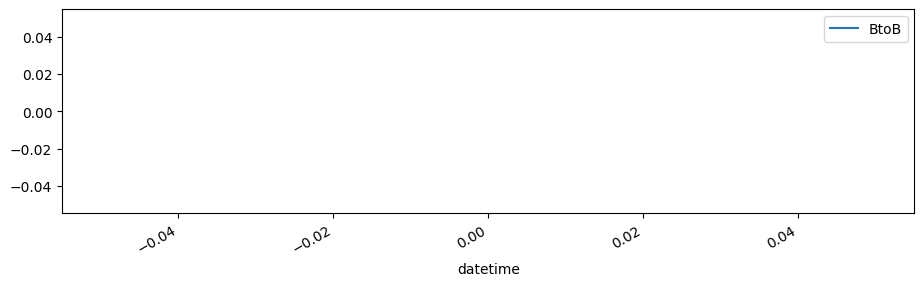

Detected CSV files for sensor 'breathing' in patient 003: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_04-05_33_24_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_02-09_24_32_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_03-00_54_40_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_03-18_06_15_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_01-06_00_57_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_04-05_33_24_Breathing.csv
Original CSV file size: 26.74 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_breathing_003.feather (7.54 MB)
Visualizing data for sensor 'breathing' in patient 003


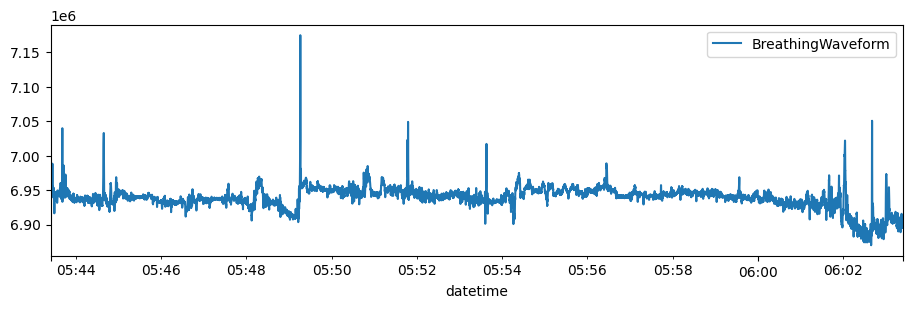

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_02-09_24_32_Breathing.csv
Original CSV file size: 42.58 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_breathing_003.feather (11.95 MB)
Visualizing data for sensor 'breathing' in patient 003


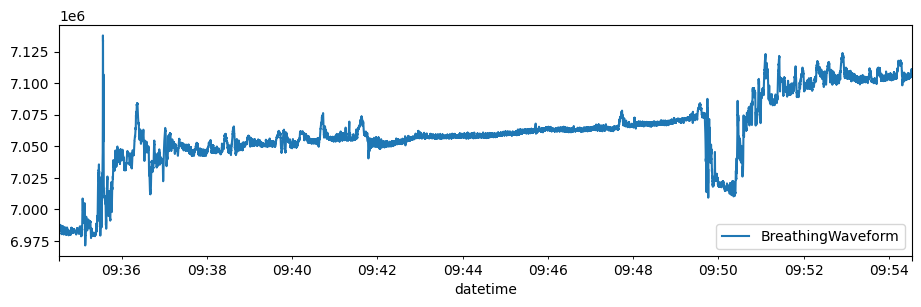

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_03-00_54_40_Breathing.csv
Original CSV file size: 11.06 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_breathing_003.feather (3.06 MB)
Visualizing data for sensor 'breathing' in patient 003


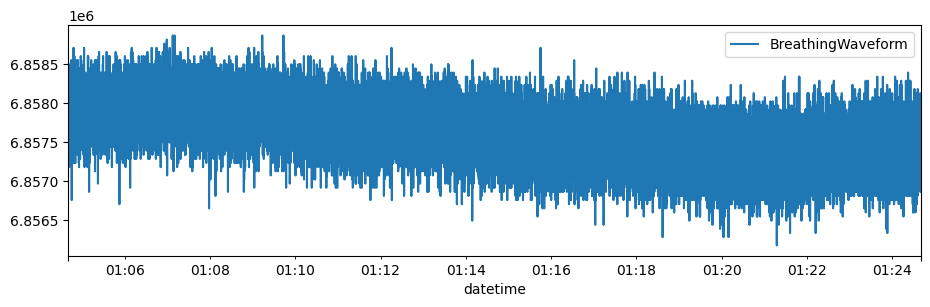

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_03-18_06_15_Breathing.csv
Original CSV file size: 9.41 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_breathing_003.feather (2.66 MB)
Visualizing data for sensor 'breathing' in patient 003


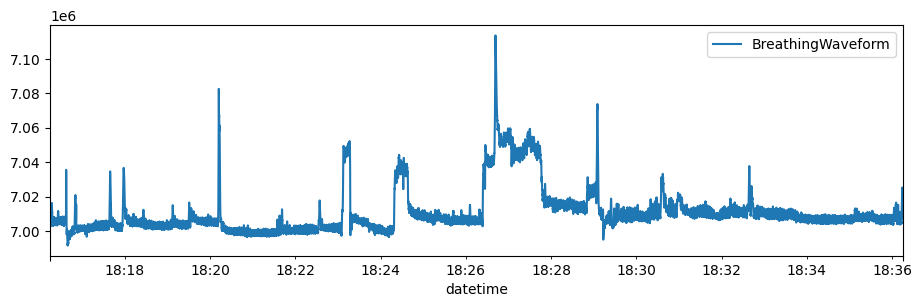

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/breathing/2014_10_01-06_00_57_Breathing.csv
Original CSV file size: 44.47 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_breathing_003.feather (12.57 MB)
Visualizing data for sensor 'breathing' in patient 003


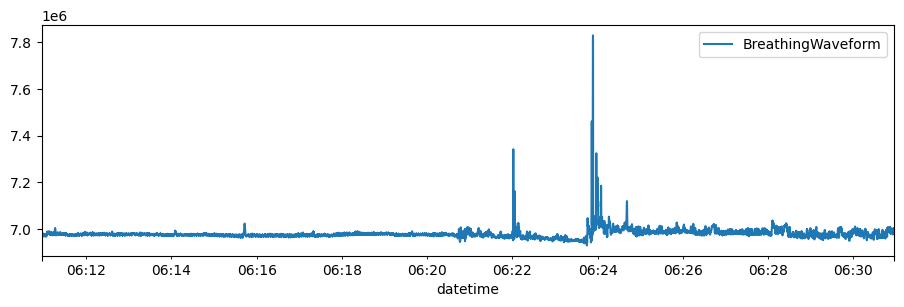

Detected CSV files for sensor 'RR' in patient 003: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_03-00_54_40_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_02-09_24_32_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_04-05_33_24_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_01-06_00_57_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_03-18_06_15_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_03-00_54_40_RR.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_RR_003.feather (0.00 MB)
Visualizing data for sensor 'RR' in patient 003
Error processing file /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_03-00_54_40_RR.csv: no numer

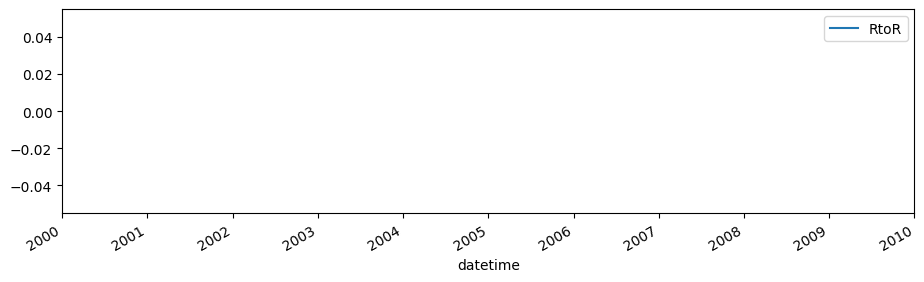

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_04-05_33_24_RR.csv
Original CSV file size: 0.14 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_RR_003.feather (0.09 MB)
Visualizing data for sensor 'RR' in patient 003


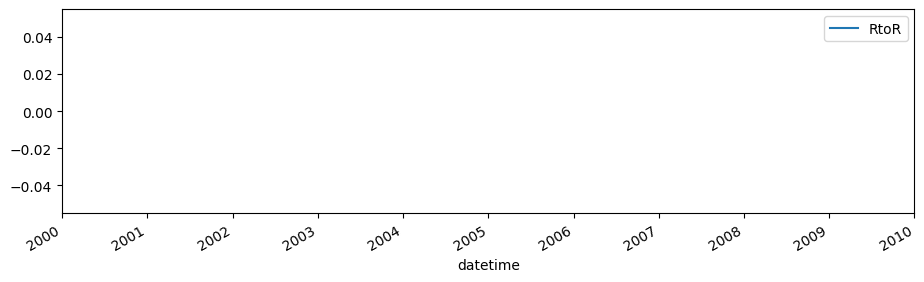

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_01-06_00_57_RR.csv
Original CSV file size: 0.18 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_RR_003.feather (0.12 MB)
Visualizing data for sensor 'RR' in patient 003


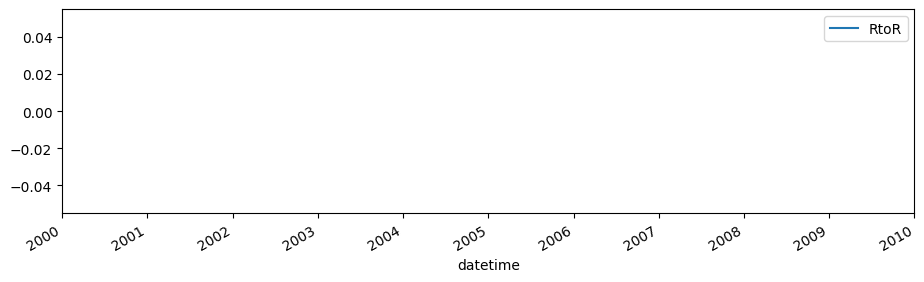

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/RR/2014_10_03-18_06_15_RR.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_RR_003.feather (0.04 MB)
Visualizing data for sensor 'RR' in patient 003


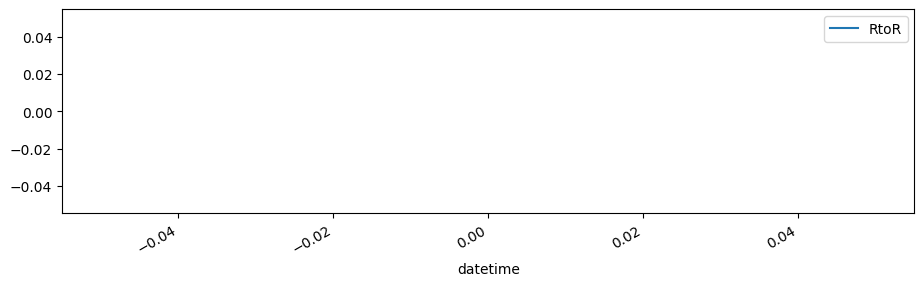

Detected CSV files for sensor 'summary' in patient 003: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_03-18_06_15_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_04-05_33_24_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_02-09_24_32_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_03-00_54_40_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_01-06_00_57_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_03-18_06_15_Summary.csv
Original CSV file size: 2.33 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_summary_003.feather (0.56 MB)
Visualizing data for sensor 'summary' in patient 003


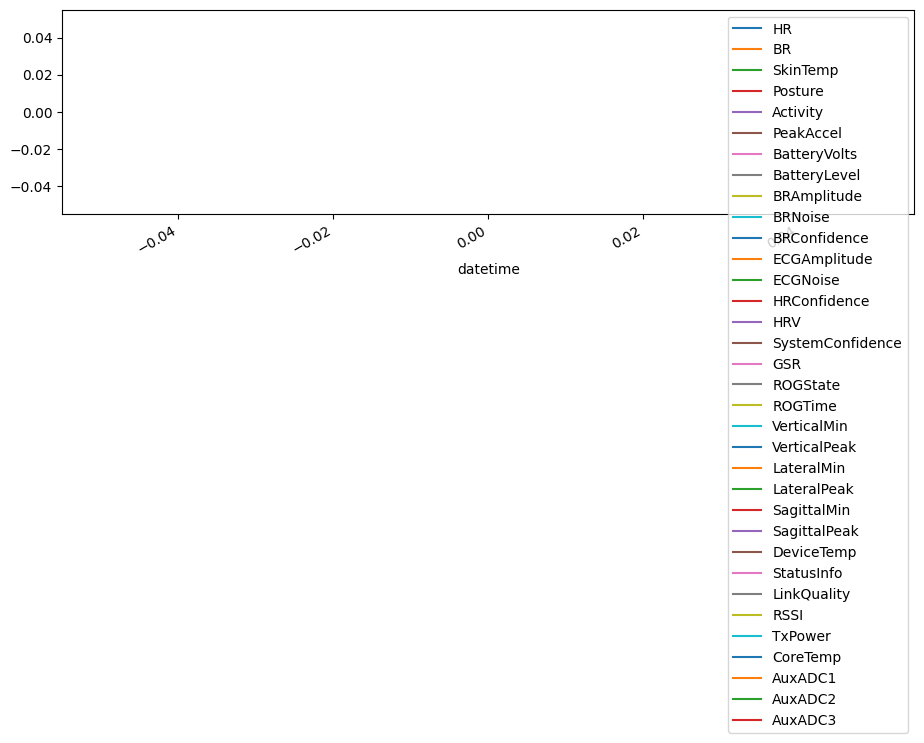

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_04-05_33_24_Summary.csv
Original CSV file size: 6.57 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_summary_003.feather (1.59 MB)
Visualizing data for sensor 'summary' in patient 003


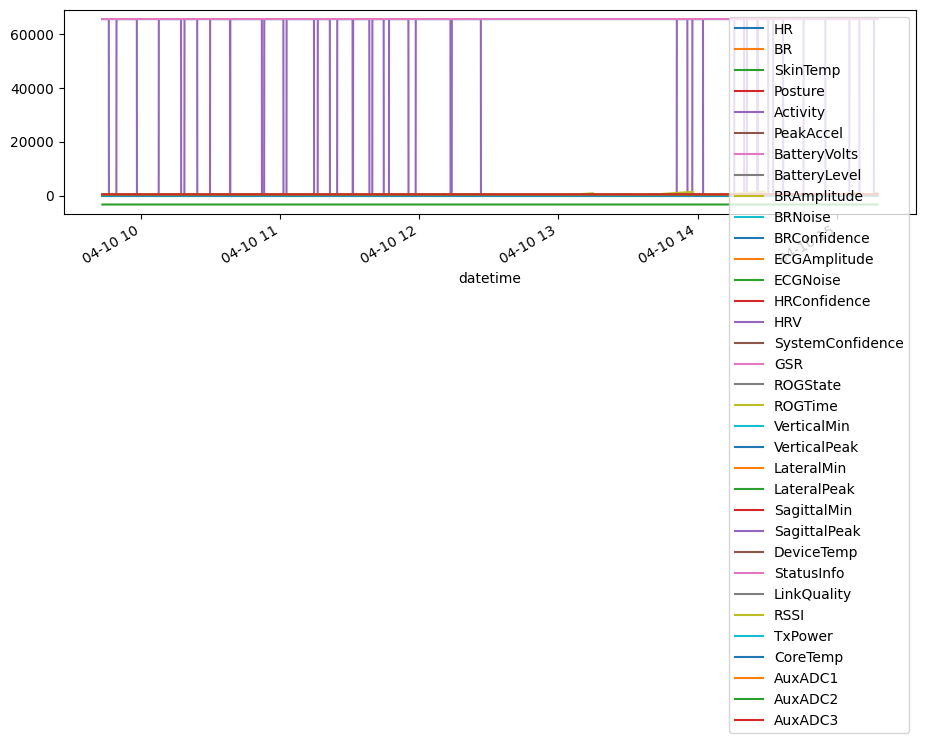

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_02-09_24_32_Summary.csv
Original CSV file size: 10.22 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_summary_003.feather (1.93 MB)
Visualizing data for sensor 'summary' in patient 003


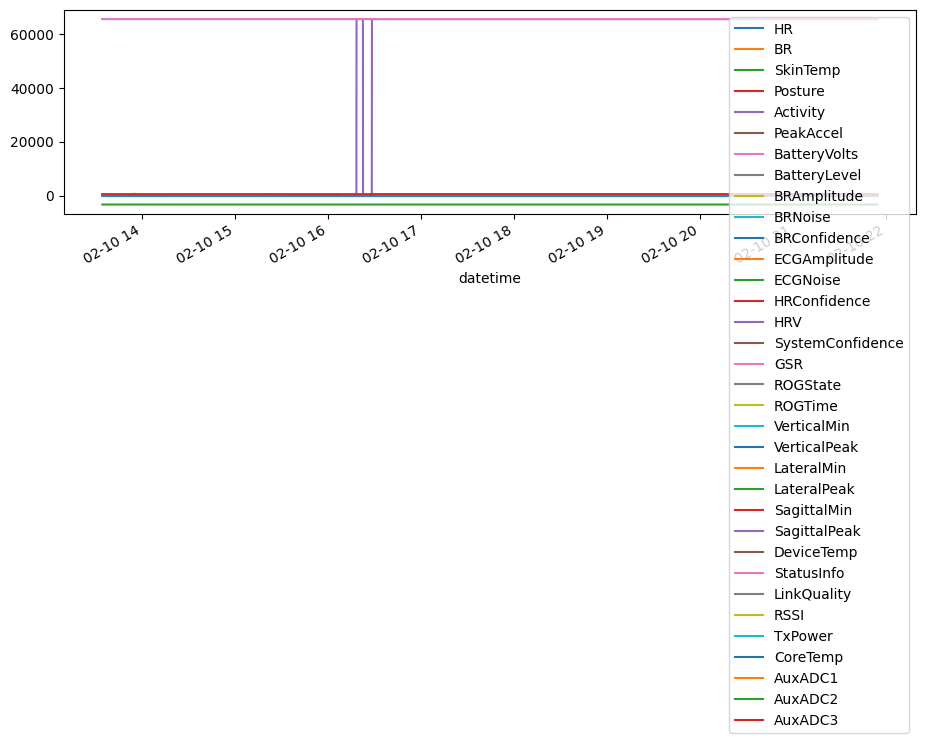

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_03-00_54_40_Summary.csv
Original CSV file size: 2.62 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_summary_003.feather (0.40 MB)
Visualizing data for sensor 'summary' in patient 003


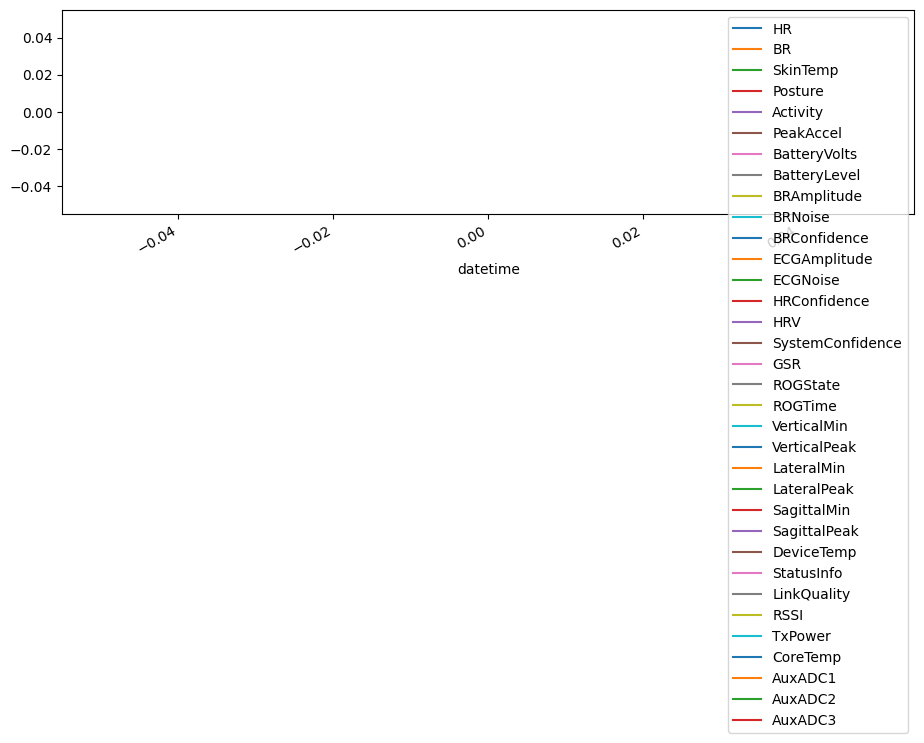

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/003/summary/2014_10_01-06_00_57_Summary.csv
Original CSV file size: 10.85 MB
Saved to feather: ../raw_data/sensor/003/d1namo_t1d_summary_003.feather (2.53 MB)
Visualizing data for sensor 'summary' in patient 003


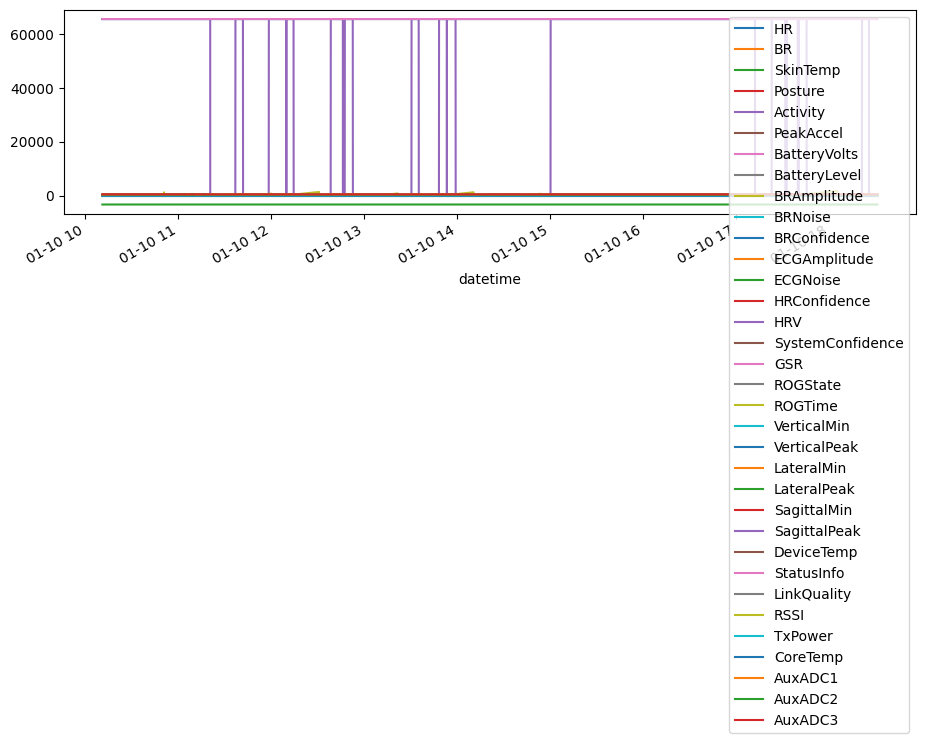


Processing data for patient 004 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004
Detected sensors for patient 004: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary']
Detected CSV files for sensor 'acceleration' in patient 004: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_02-07_21_06_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_01-06_55_10_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_01-19_33_00_Accel.csv', 

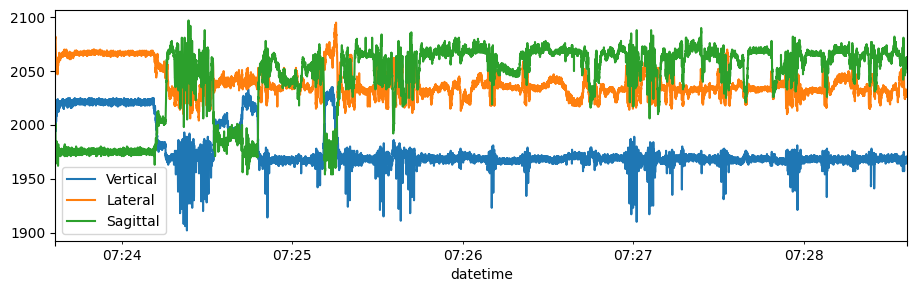

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_01-06_55_10_Accel.csv
Original CSV file size: 156.44 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_acceleration_004.feather (52.23 MB)
Visualizing data for sensor 'acceleration' in patient 004


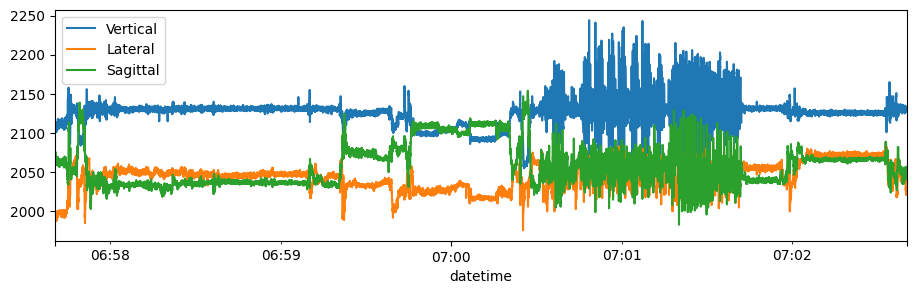

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_01-19_33_00_Accel.csv
Original CSV file size: 5.71 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_acceleration_004.feather (1.88 MB)
Visualizing data for sensor 'acceleration' in patient 004


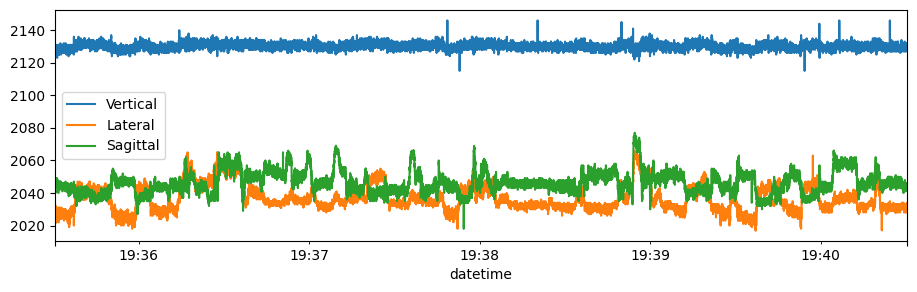

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_03-08_05_42_Accel.csv
Original CSV file size: 107.48 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_acceleration_004.feather (35.62 MB)
Visualizing data for sensor 'acceleration' in patient 004


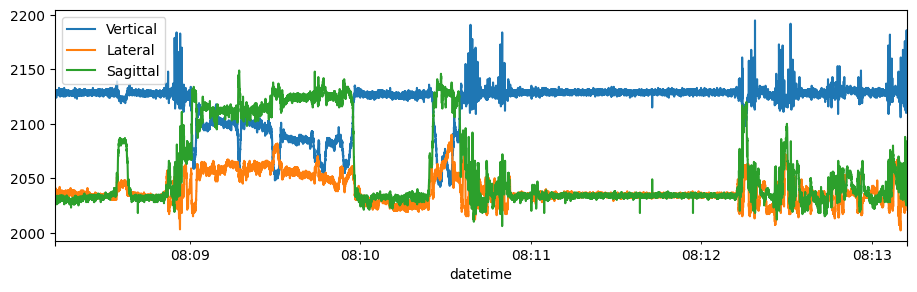

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_04-16_49_30_Accel.csv
Original CSV file size: 12.59 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_acceleration_004.feather (4.19 MB)
Visualizing data for sensor 'acceleration' in patient 004


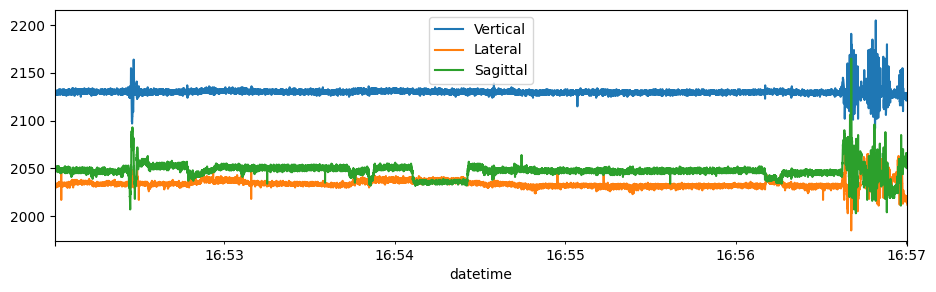

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/acceleration/2014_10_04-06_32_58_Accel.csv
Original CSV file size: 137.59 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_acceleration_004.feather (45.86 MB)
Visualizing data for sensor 'acceleration' in patient 004


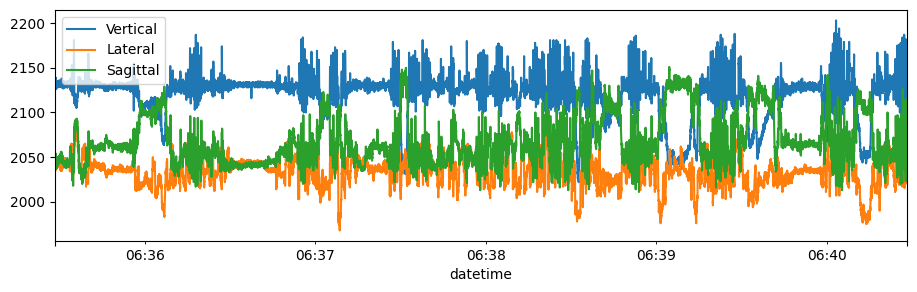

Detected CSV files for sensor 'BB' in patient 004: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_04-06_32_58_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_01-19_33_00_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_04-16_49_30_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_03-08_05_42_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_02-07_21_06_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_01-06_55_10_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_04-06_32_58_BB.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_BB_004.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 004


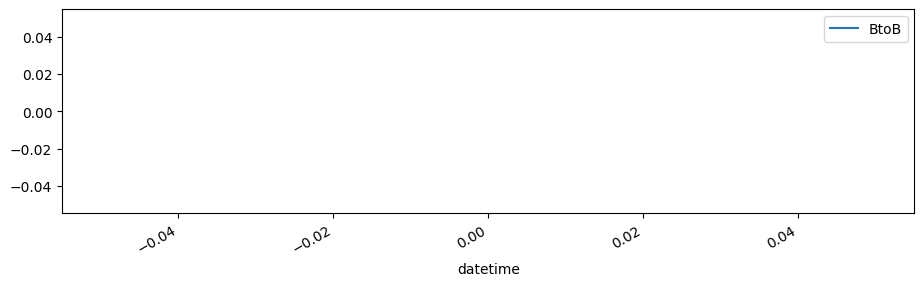

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_01-19_33_00_BB.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_BB_004.feather (0.00 MB)
Visualizing data for sensor 'BB' in patient 004


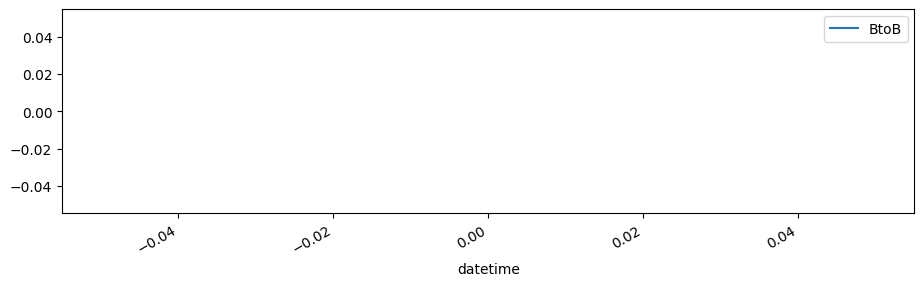

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_04-16_49_30_BB.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_BB_004.feather (0.01 MB)
Visualizing data for sensor 'BB' in patient 004


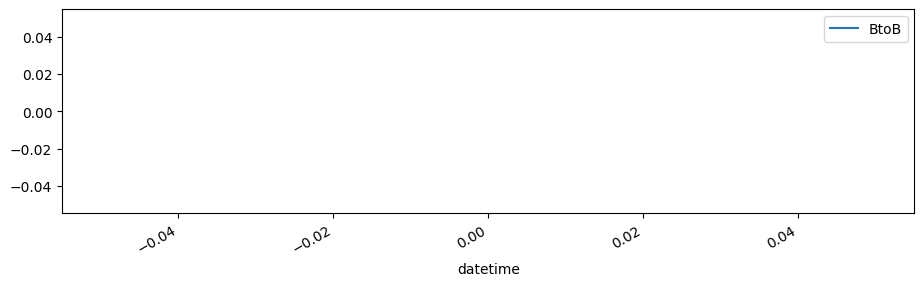

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_03-08_05_42_BB.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_BB_004.feather (0.03 MB)
Visualizing data for sensor 'BB' in patient 004


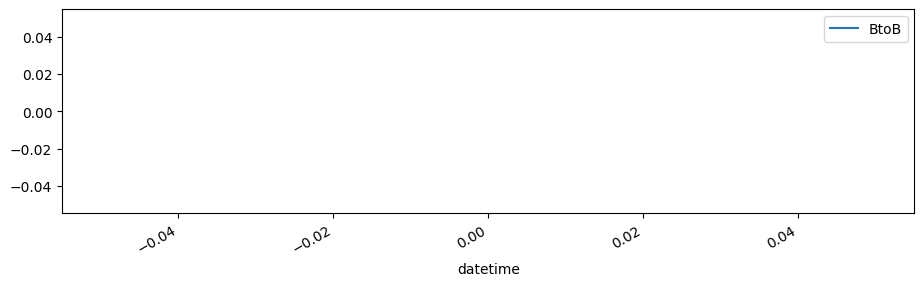

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_02-07_21_06_BB.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_BB_004.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 004


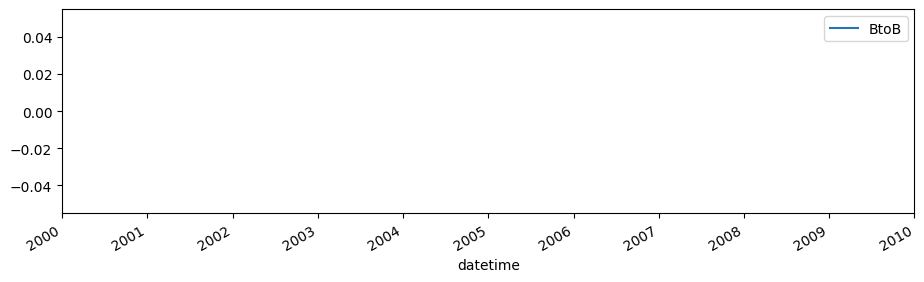

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/BB/2014_10_01-06_55_10_BB.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_BB_004.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 004


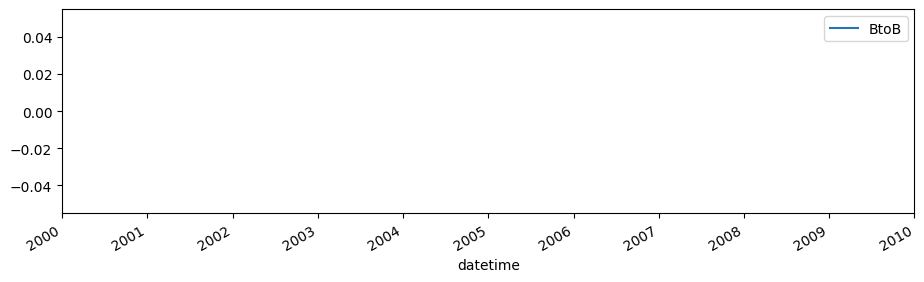

Detected CSV files for sensor 'breathing' in patient 004: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_01-19_33_00_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_03-08_05_42_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_02-07_21_06_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_04-16_49_30_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_01-06_55_10_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_04-06_32_58_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_01-19_33_00_Breathing.csv
Original CSV file size: 1.17 MB
Saved to feather: ../raw_data/sensor/004/d1namo_

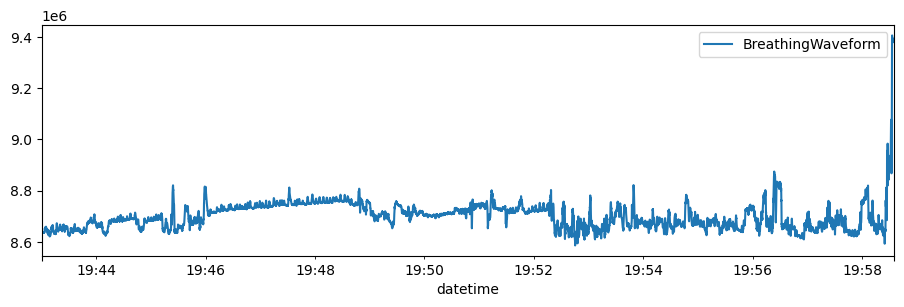

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_03-08_05_42_Breathing.csv
Original CSV file size: 22.43 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_breathing_004.feather (6.59 MB)
Visualizing data for sensor 'breathing' in patient 004


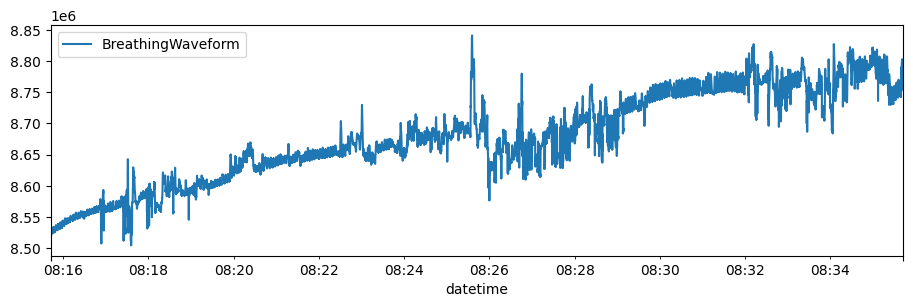

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_02-07_21_06_Breathing.csv
Original CSV file size: 34.39 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_breathing_004.feather (10.10 MB)
Visualizing data for sensor 'breathing' in patient 004


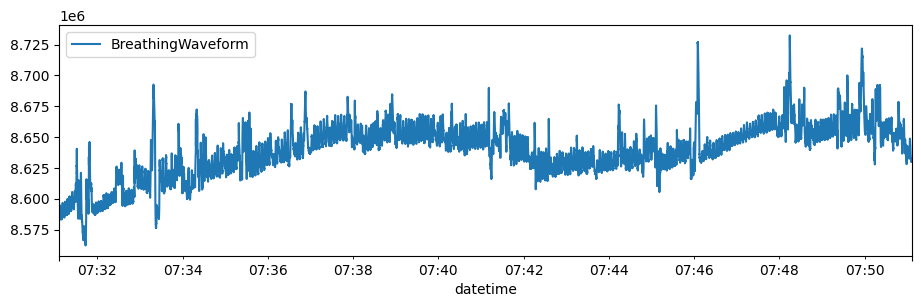

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_04-16_49_30_Breathing.csv
Original CSV file size: 2.58 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_breathing_004.feather (0.75 MB)
Visualizing data for sensor 'breathing' in patient 004


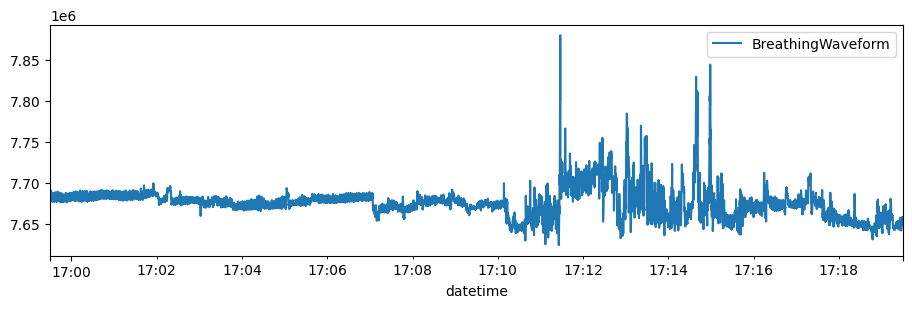

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_01-06_55_10_Breathing.csv
Original CSV file size: 32.09 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_breathing_004.feather (9.37 MB)
Visualizing data for sensor 'breathing' in patient 004


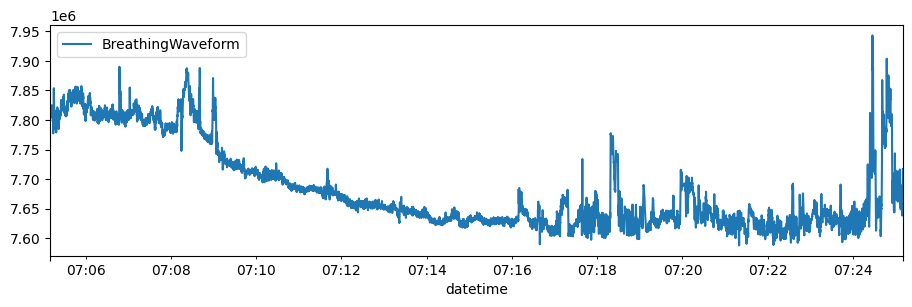

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/breathing/2014_10_04-06_32_58_Breathing.csv
Original CSV file size: 28.22 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_breathing_004.feather (8.23 MB)
Visualizing data for sensor 'breathing' in patient 004


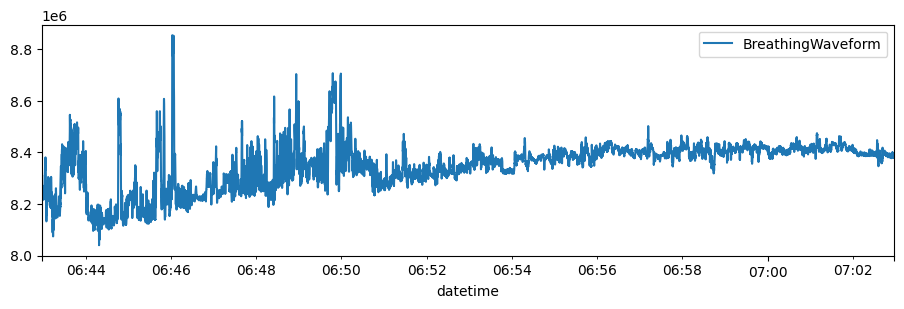

Detected CSV files for sensor 'RR' in patient 004: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_02-07_21_06_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_01-06_55_10_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_04-06_32_58_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_01-19_33_00_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_04-16_49_30_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_03-08_05_42_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_02-07_21_06_RR.csv
Original CSV file size: 0.17 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_RR_004.feather (0.11 MB)
Visualizing data for sensor 'RR' in patient 004


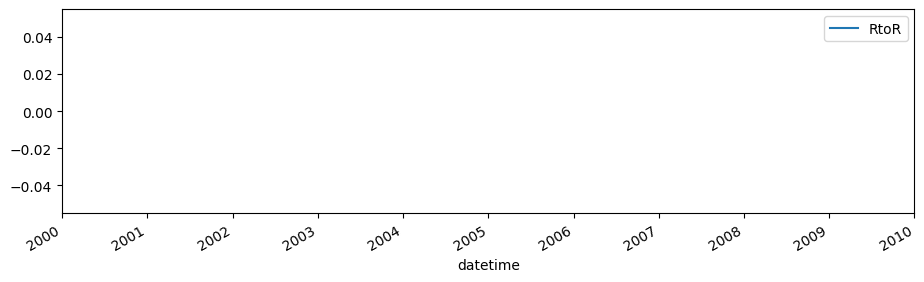

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_01-06_55_10_RR.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_RR_004.feather (0.04 MB)
Visualizing data for sensor 'RR' in patient 004


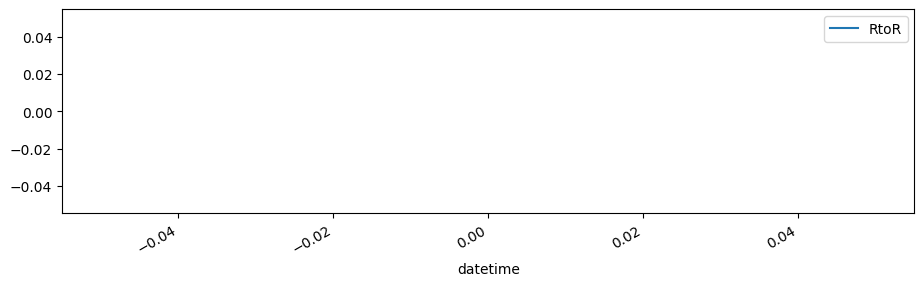

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_04-06_32_58_RR.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_RR_004.feather (0.03 MB)
Visualizing data for sensor 'RR' in patient 004


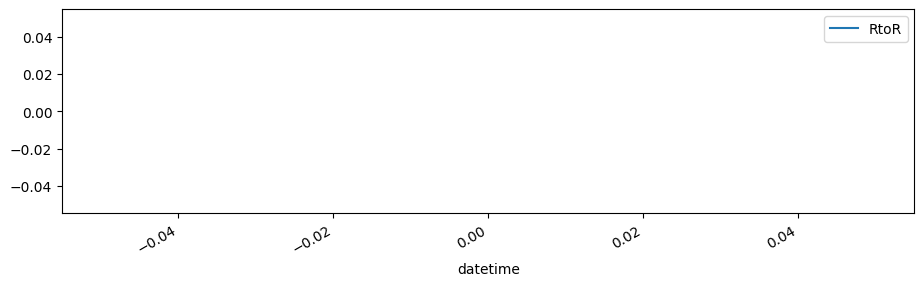

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_01-19_33_00_RR.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_RR_004.feather (0.00 MB)
Visualizing data for sensor 'RR' in patient 004


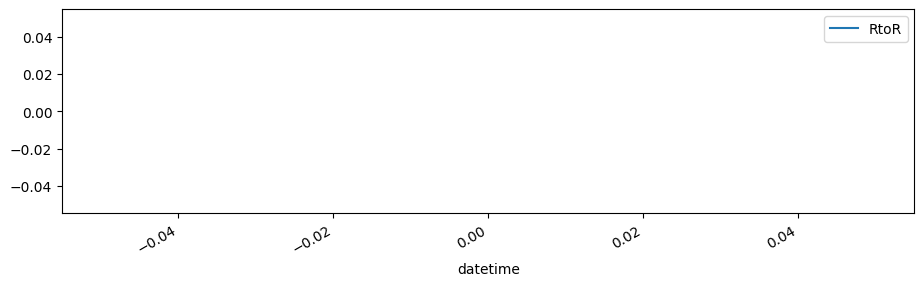

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_04-16_49_30_RR.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_RR_004.feather (0.00 MB)
Visualizing data for sensor 'RR' in patient 004


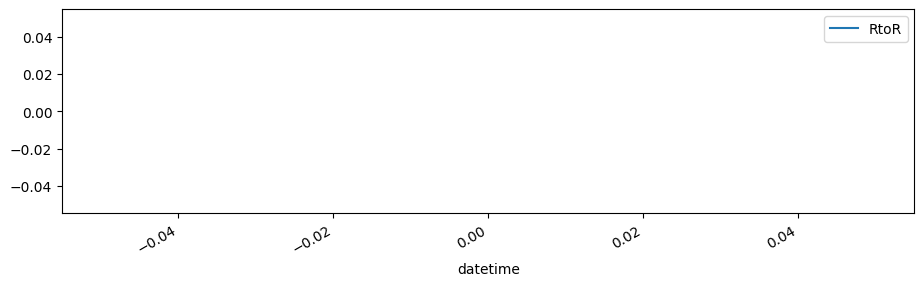

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/RR/2014_10_03-08_05_42_RR.csv
Original CSV file size: 0.18 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_RR_004.feather (0.12 MB)
Visualizing data for sensor 'RR' in patient 004


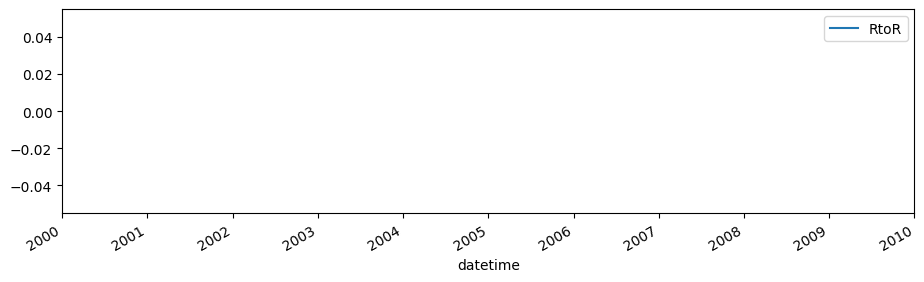

Detected CSV files for sensor 'summary' in patient 004: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_04-16_49_30_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_01-19_33_00_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_04-06_32_58_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_01-06_55_10_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_02-07_21_06_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_03-08_05_42_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_04-16_49_30_Summary.csv
Original CSV file size: 0.63 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_summary_004.feather (0.17 

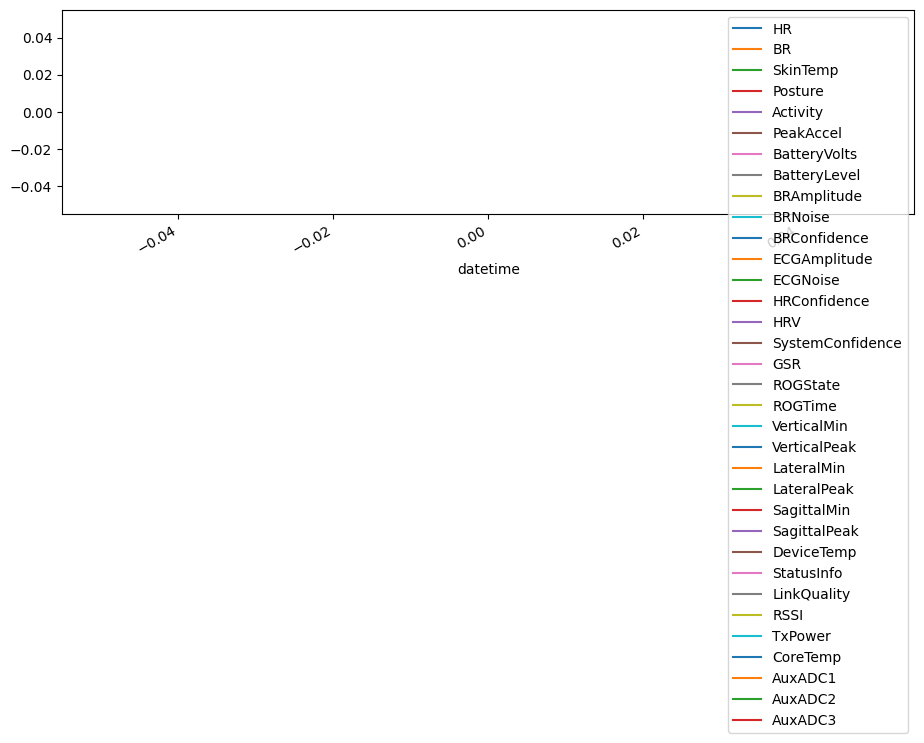

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_01-19_33_00_Summary.csv
Original CSV file size: 0.29 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_summary_004.feather (0.09 MB)
Visualizing data for sensor 'summary' in patient 004


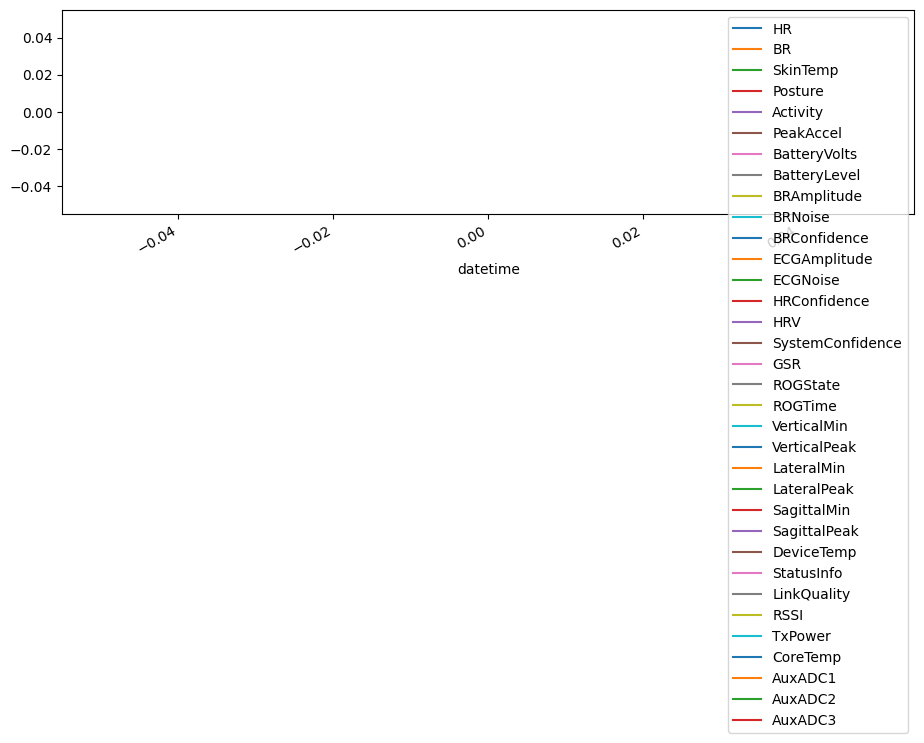

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_04-06_32_58_Summary.csv
Original CSV file size: 6.88 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_summary_004.feather (1.69 MB)
Visualizing data for sensor 'summary' in patient 004


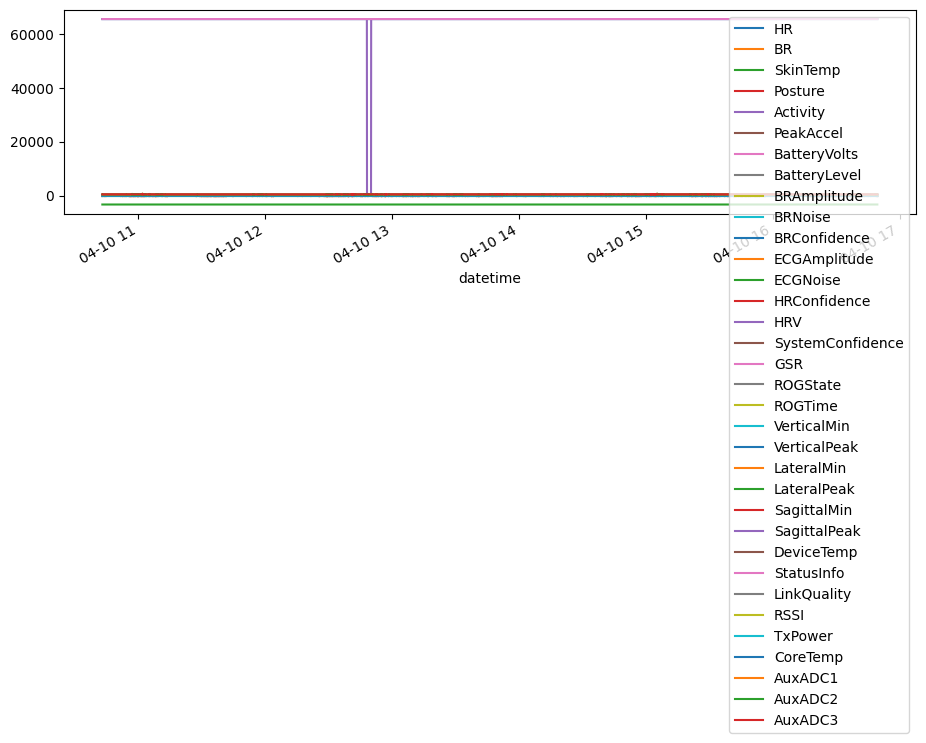

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_01-06_55_10_Summary.csv
Original CSV file size: 7.83 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_summary_004.feather (1.94 MB)
Visualizing data for sensor 'summary' in patient 004


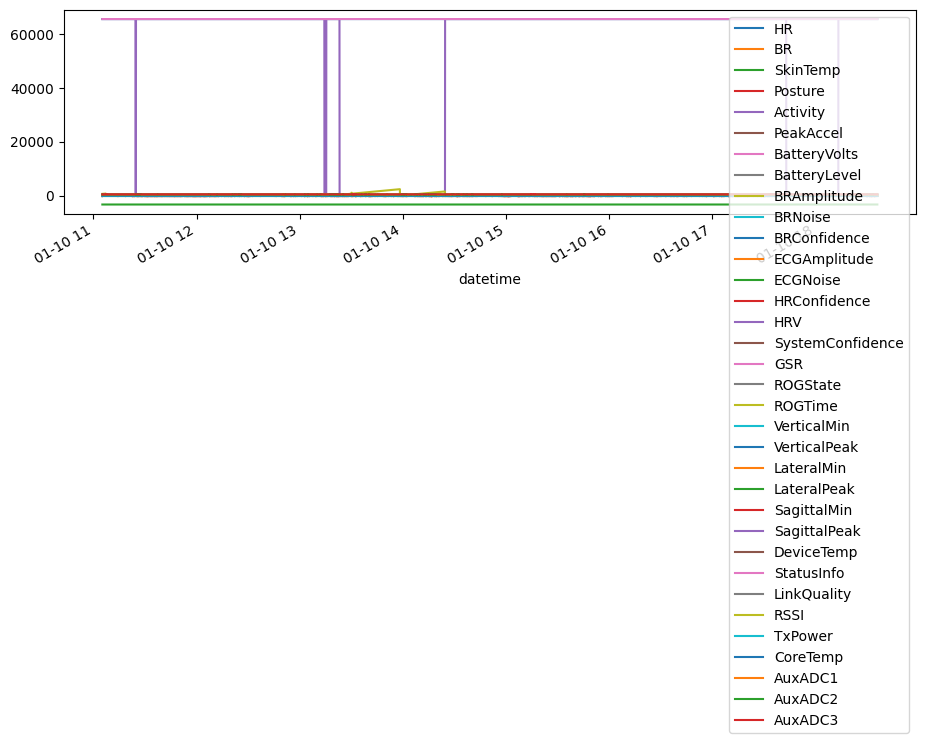

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_02-07_21_06_Summary.csv
Original CSV file size: 8.35 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_summary_004.feather (2.21 MB)
Visualizing data for sensor 'summary' in patient 004


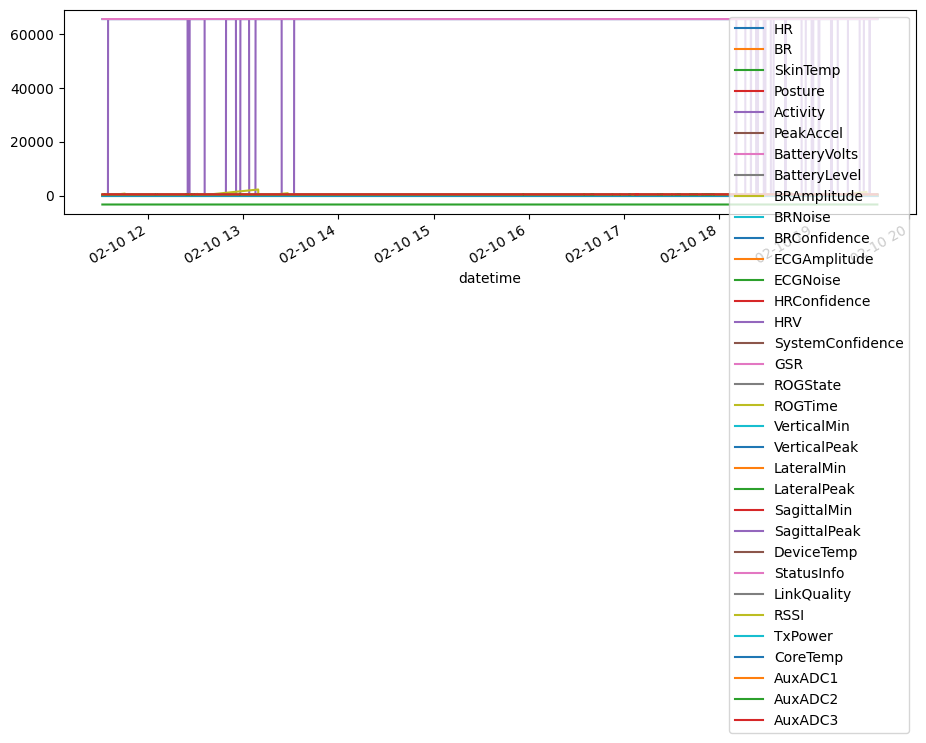

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/004/summary/2014_10_03-08_05_42_Summary.csv
Original CSV file size: 5.43 MB
Saved to feather: ../raw_data/sensor/004/d1namo_t1d_summary_004.feather (1.31 MB)
Visualizing data for sensor 'summary' in patient 004


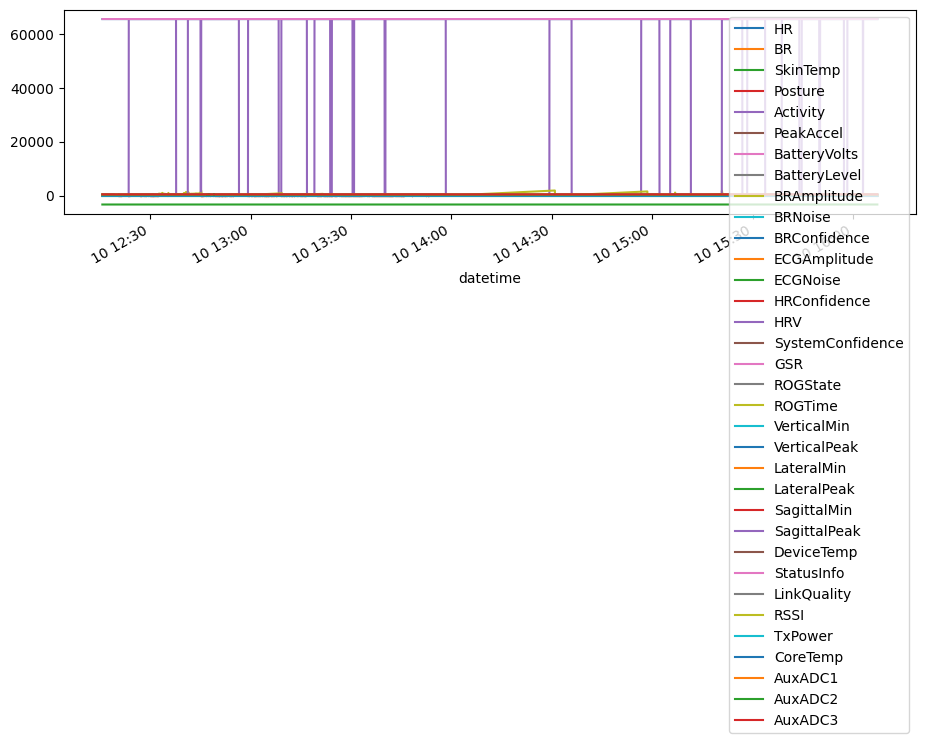


Processing data for patient 005 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005
Detected sensors for patient 005: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary']
Detected CSV files for sensor 'acceleration' in patient 005: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_01-10_27_42_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_02-09_23_58_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_03-08_42_25_Accel.csv', 

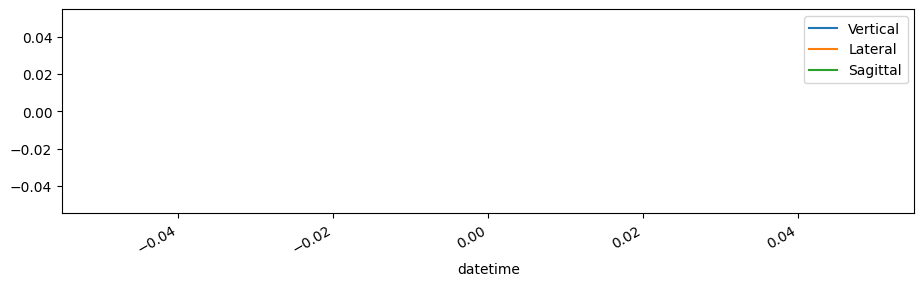

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_02-09_23_58_Accel.csv
Original CSV file size: 30.47 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_acceleration_005.feather (10.14 MB)
Visualizing data for sensor 'acceleration' in patient 005


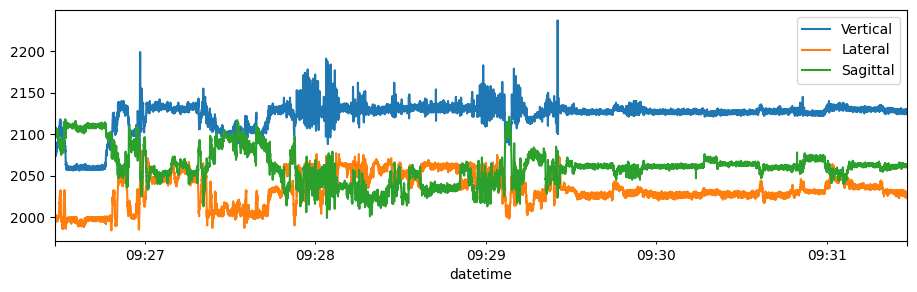

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_03-08_42_25_Accel.csv
Original CSV file size: 188.18 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_acceleration_005.feather (62.84 MB)
Visualizing data for sensor 'acceleration' in patient 005


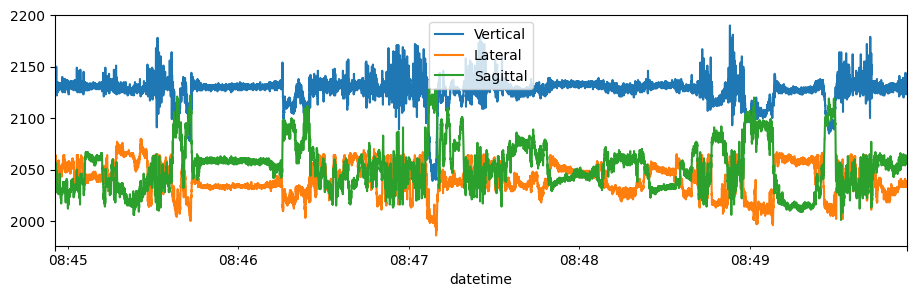

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_02-11_40_30_Accel.csv
Original CSV file size: 152.18 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_acceleration_005.feather (50.61 MB)
Visualizing data for sensor 'acceleration' in patient 005


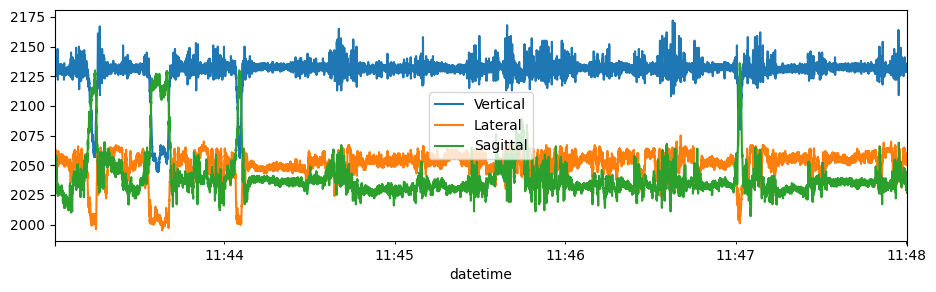

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_01-10_40_51_Accel.csv
Original CSV file size: 157.68 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_acceleration_005.feather (52.54 MB)
Visualizing data for sensor 'acceleration' in patient 005


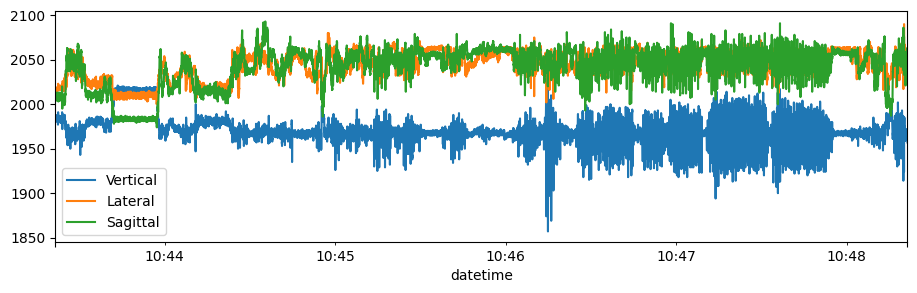

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/acceleration/2014_10_04-08_02_17_Accel.csv
Original CSV file size: 98.22 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_acceleration_005.feather (32.75 MB)
Visualizing data for sensor 'acceleration' in patient 005


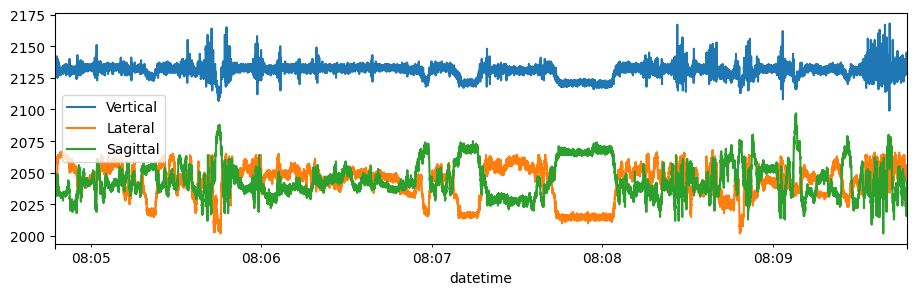

Detected CSV files for sensor 'BB' in patient 005: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_01-10_27_42_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_02-09_23_58_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_04-08_02_17_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_01-10_40_51_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_02-11_40_30_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_03-08_42_25_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_01-10_27_42_BB.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_BB_005.feather (0.00 MB)
Visualizing data for sensor 'BB' in patient 005


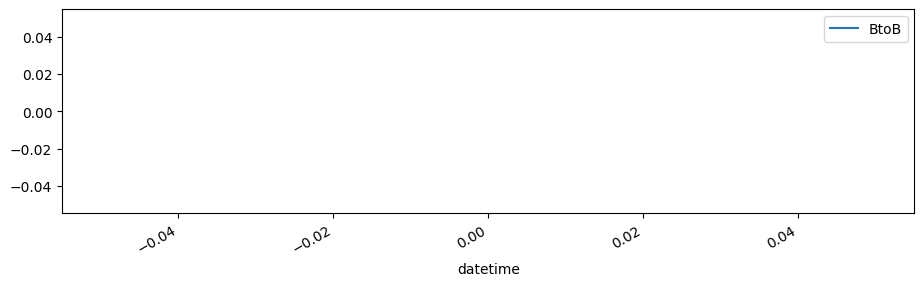

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_02-09_23_58_BB.csv
Original CSV file size: 0.02 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_BB_005.feather (0.01 MB)
Visualizing data for sensor 'BB' in patient 005


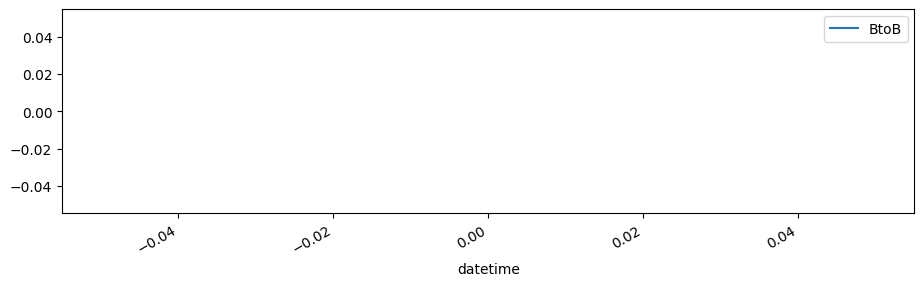

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_04-08_02_17_BB.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_BB_005.feather (0.03 MB)
Visualizing data for sensor 'BB' in patient 005


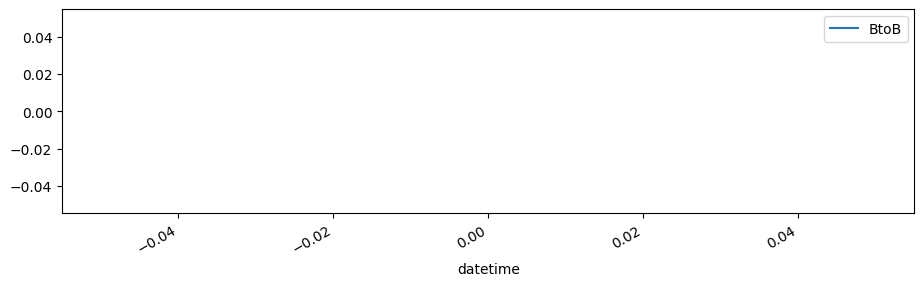

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_01-10_40_51_BB.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_BB_005.feather (0.05 MB)
Visualizing data for sensor 'BB' in patient 005


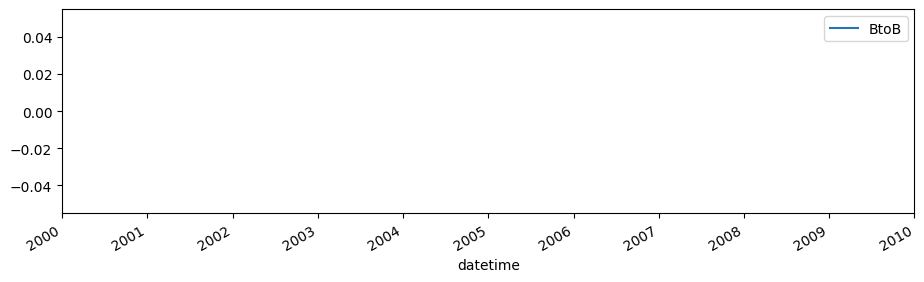

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_02-11_40_30_BB.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_BB_005.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 005


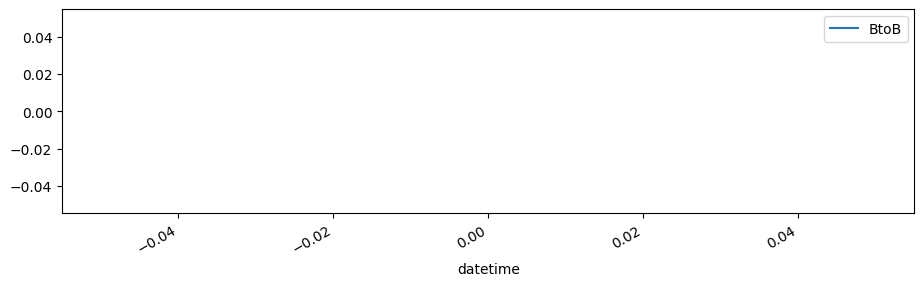

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/BB/2014_10_03-08_42_25_BB.csv
Original CSV file size: 0.10 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_BB_005.feather (0.06 MB)
Visualizing data for sensor 'BB' in patient 005


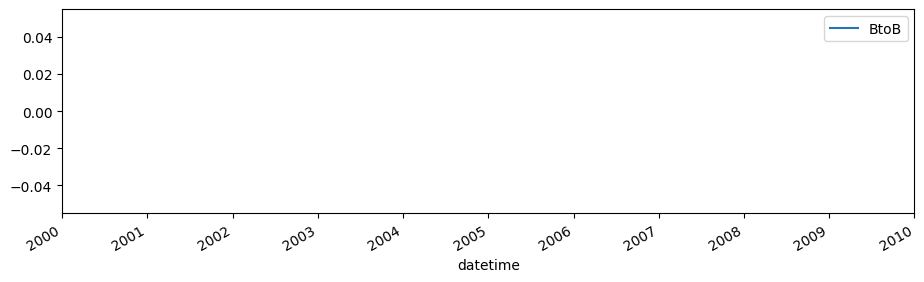

Detected CSV files for sensor 'breathing' in patient 005: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_04-08_02_17_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_01-10_40_51_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_02-09_23_58_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_03-08_42_25_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_02-11_40_30_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_01-10_27_42_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_04-08_02_17_Breathing.csv
Original CSV file size: 20.15 MB
Saved to feather: ../raw_data/sensor/005/d1namo

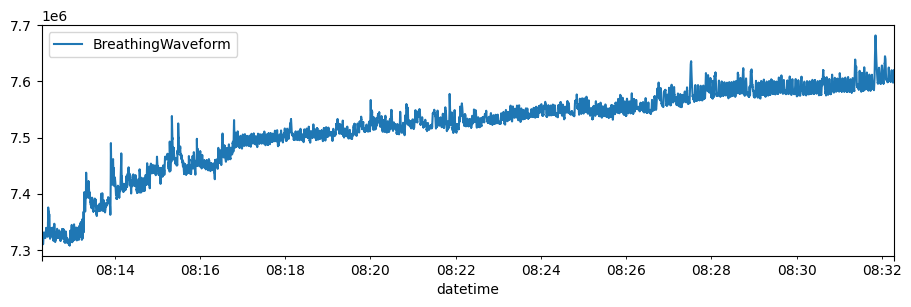

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_01-10_40_51_Breathing.csv
Original CSV file size: 32.35 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_breathing_005.feather (9.47 MB)
Visualizing data for sensor 'breathing' in patient 005


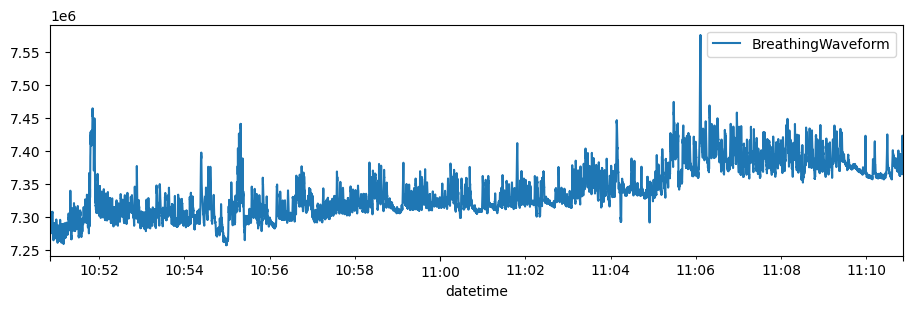

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_02-09_23_58_Breathing.csv
Original CSV file size: 6.25 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_breathing_005.feather (1.86 MB)
Visualizing data for sensor 'breathing' in patient 005


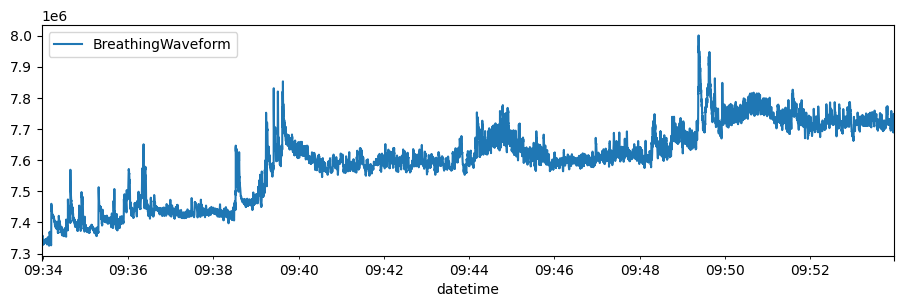

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_03-08_42_25_Breathing.csv
Original CSV file size: 38.60 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_breathing_005.feather (11.39 MB)
Visualizing data for sensor 'breathing' in patient 005


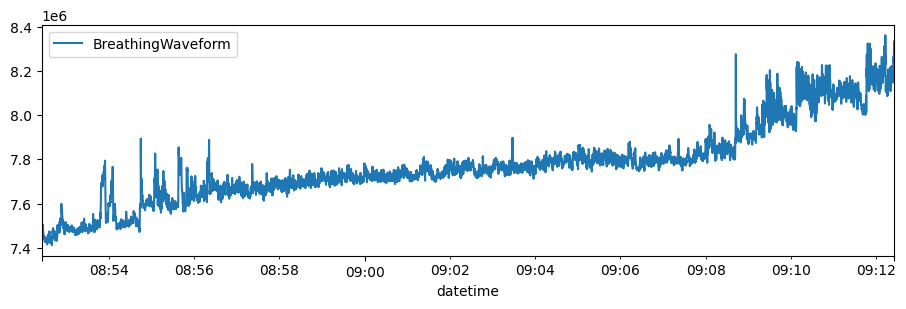

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_02-11_40_30_Breathing.csv
Original CSV file size: 31.22 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_breathing_005.feather (9.10 MB)
Visualizing data for sensor 'breathing' in patient 005


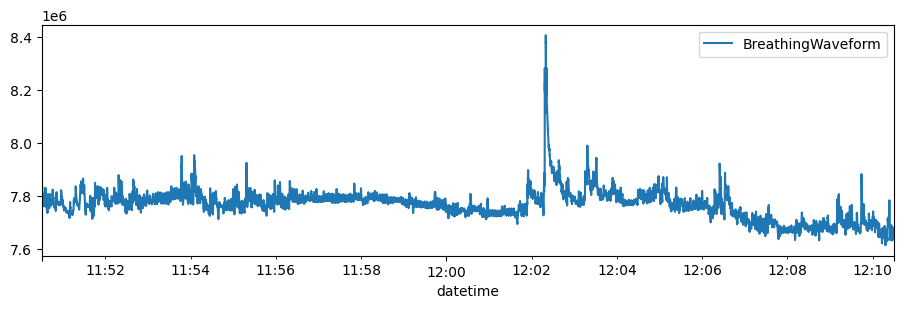

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/breathing/2014_10_01-10_27_42_Breathing.csv
Original CSV file size: 0.09 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_breathing_005.feather (0.03 MB)
Visualizing data for sensor 'breathing' in patient 005


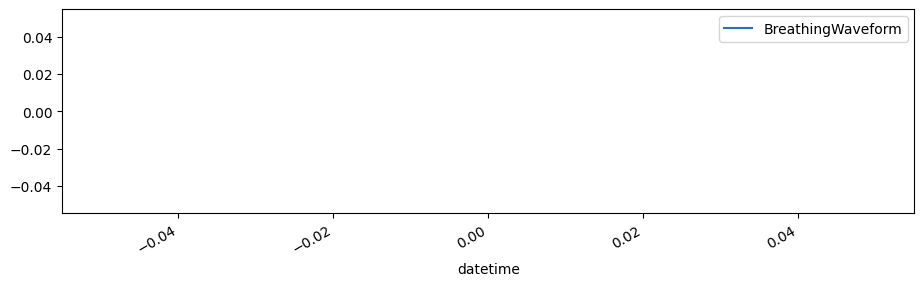

Detected CSV files for sensor 'RR' in patient 005: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_02-11_40_30_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_03-08_42_25_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_01-10_27_42_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_02-09_23_58_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_04-08_02_17_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_01-10_40_51_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_02-11_40_30_RR.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_RR_005.feather (0.03 MB)
Visualizing data for sensor 'RR' in patient 005


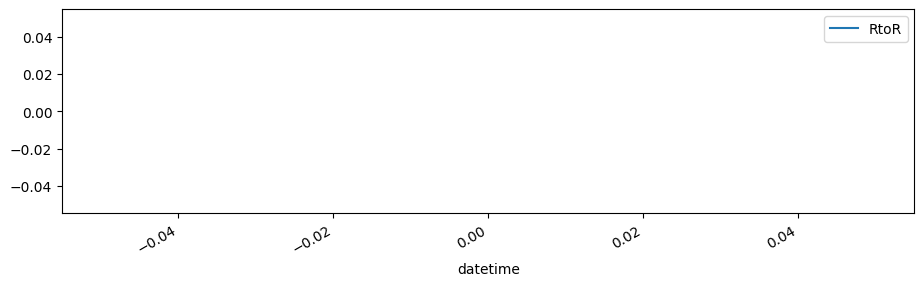

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_03-08_42_25_RR.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_RR_005.feather (0.02 MB)
Visualizing data for sensor 'RR' in patient 005


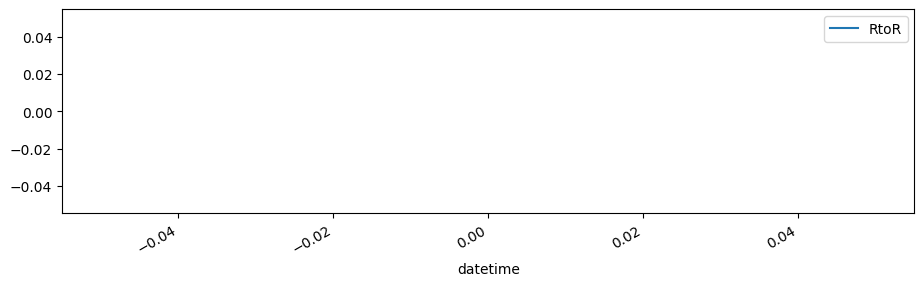

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_01-10_27_42_RR.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_RR_005.feather (0.00 MB)
Visualizing data for sensor 'RR' in patient 005


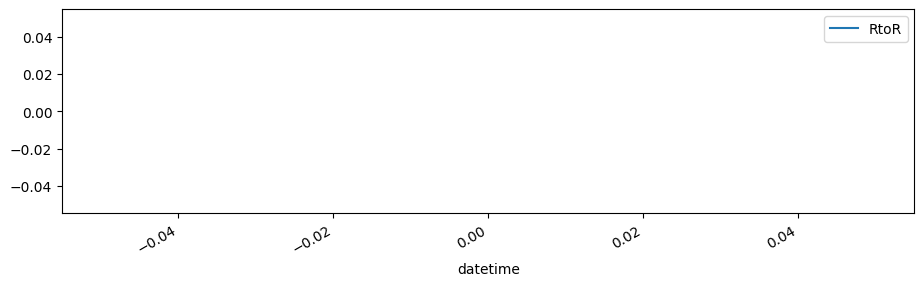

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_02-09_23_58_RR.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_RR_005.feather (0.01 MB)
Visualizing data for sensor 'RR' in patient 005


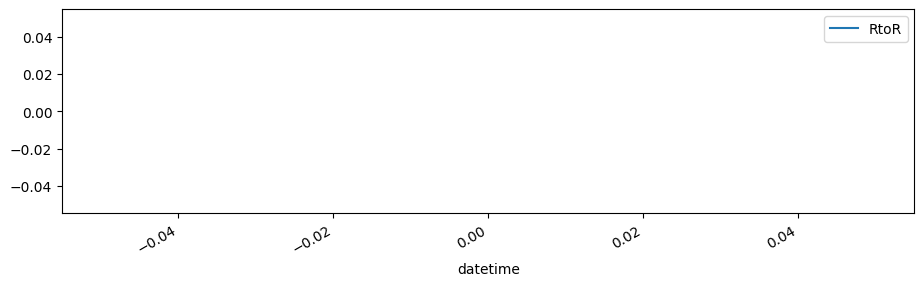

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_04-08_02_17_RR.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_RR_005.feather (0.01 MB)
Visualizing data for sensor 'RR' in patient 005


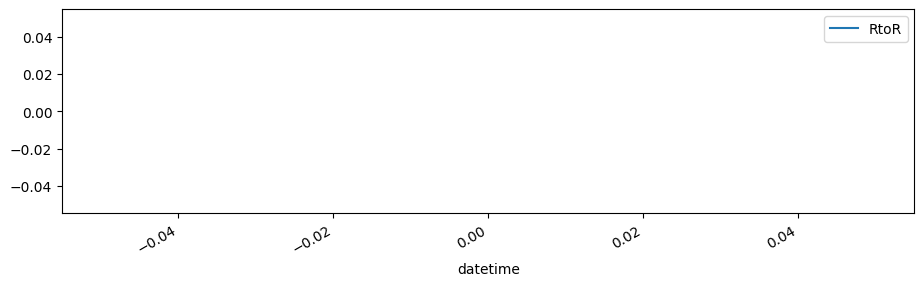

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/RR/2014_10_01-10_40_51_RR.csv
Original CSV file size: 0.03 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_RR_005.feather (0.02 MB)
Visualizing data for sensor 'RR' in patient 005


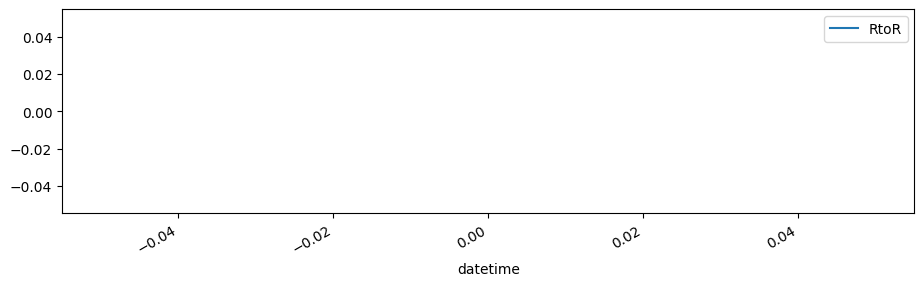

Detected CSV files for sensor 'summary' in patient 005: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_02-09_23_58_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_01-10_27_42_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_01-10_40_51_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_04-08_02_17_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_02-11_40_30_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_03-08_42_25_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_02-09_23_58_Summary.csv
Original CSV file size: 1.52 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_summary_005.feather (0.40 

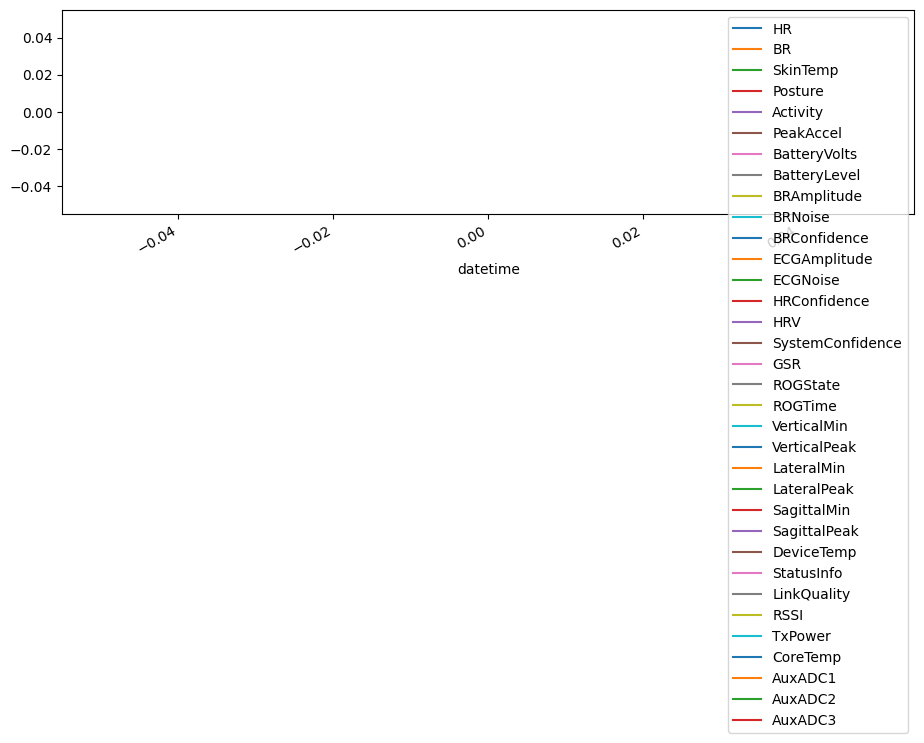

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_01-10_27_42_Summary.csv
Original CSV file size: 0.02 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_summary_005.feather (0.02 MB)
Visualizing data for sensor 'summary' in patient 005


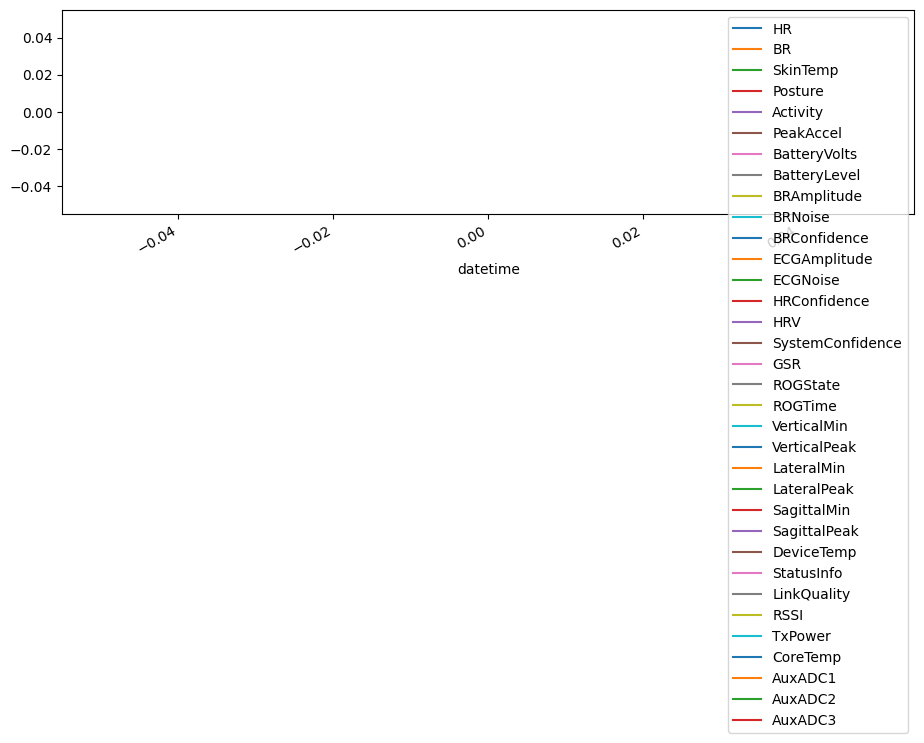

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_01-10_40_51_Summary.csv
Original CSV file size: 7.86 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_summary_005.feather (1.96 MB)
Visualizing data for sensor 'summary' in patient 005


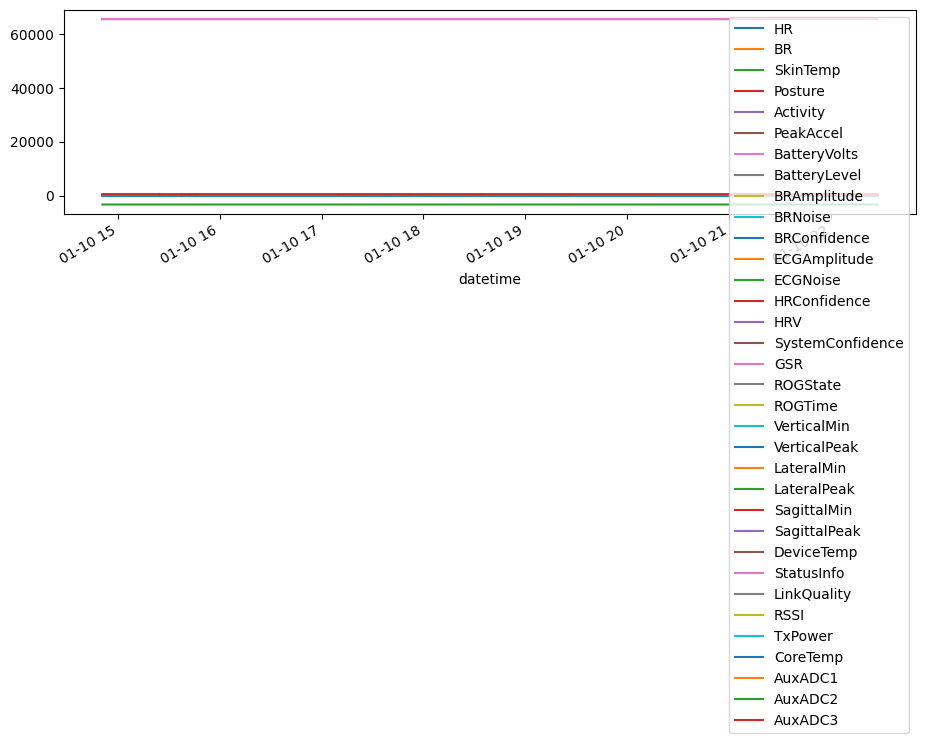

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_04-08_02_17_Summary.csv
Original CSV file size: 4.88 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_summary_005.feather (1.19 MB)
Visualizing data for sensor 'summary' in patient 005


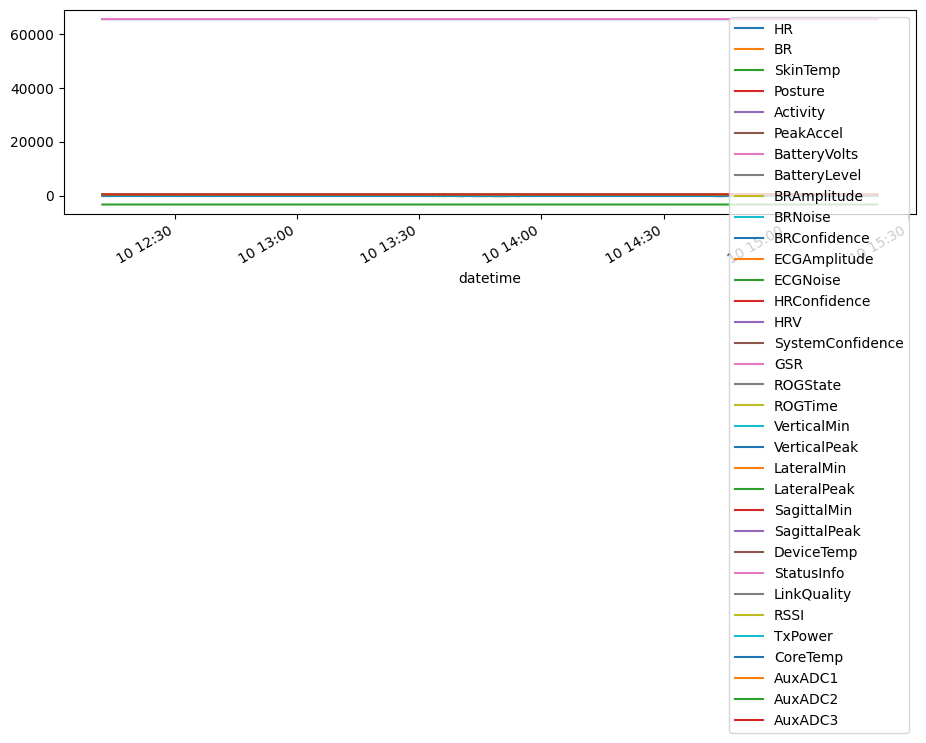

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_02-11_40_30_Summary.csv
Original CSV file size: 7.57 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_summary_005.feather (1.83 MB)
Visualizing data for sensor 'summary' in patient 005


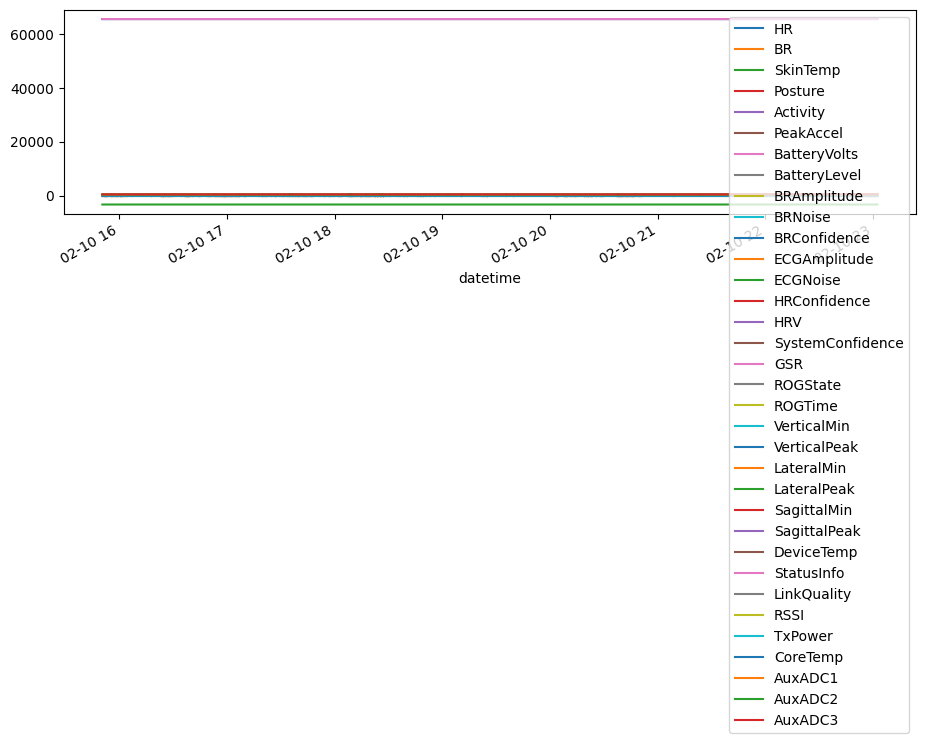

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/005/summary/2014_10_03-08_42_25_Summary.csv
Original CSV file size: 9.36 MB
Saved to feather: ../raw_data/sensor/005/d1namo_t1d_summary_005.feather (2.32 MB)
Visualizing data for sensor 'summary' in patient 005


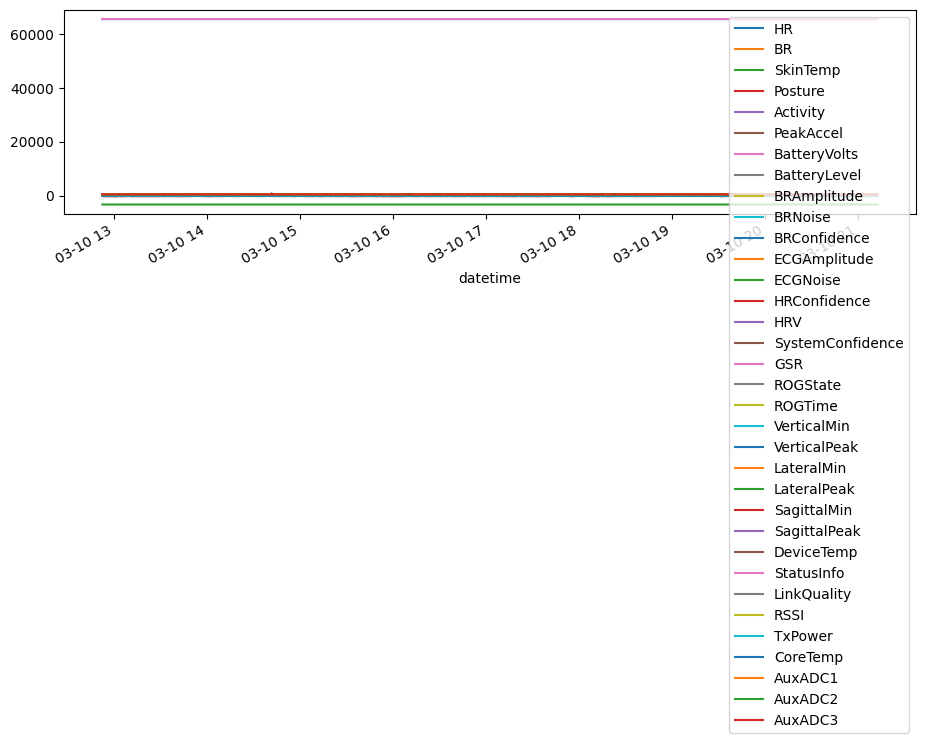


Processing data for patient 002 in directory: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002
Detected sensors for patient 002: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary']
Detected CSV files for sensor 'acceleration' in patient 002: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_04-07_01_03_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_01-20_29_57_Accel.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_02-06_44_21_Accel.csv', 

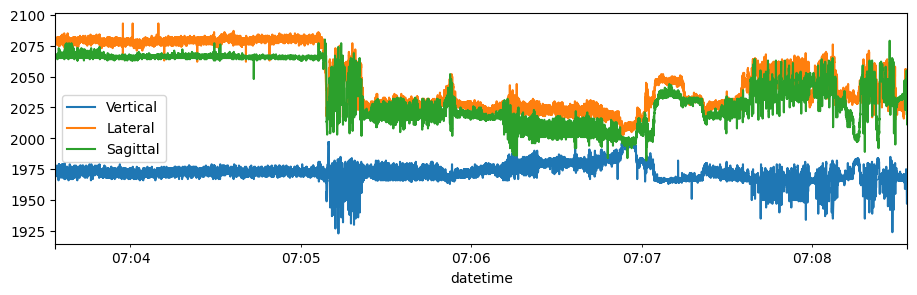

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_01-20_29_57_Accel.csv
Original CSV file size: 0.04 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_acceleration_002.feather (0.02 MB)
Visualizing data for sensor 'acceleration' in patient 002


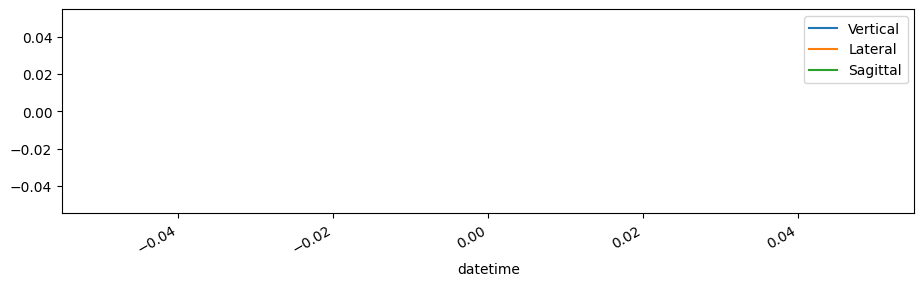

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_02-06_44_21_Accel.csv
Original CSV file size: 177.75 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_acceleration_002.feather (57.60 MB)
Visualizing data for sensor 'acceleration' in patient 002


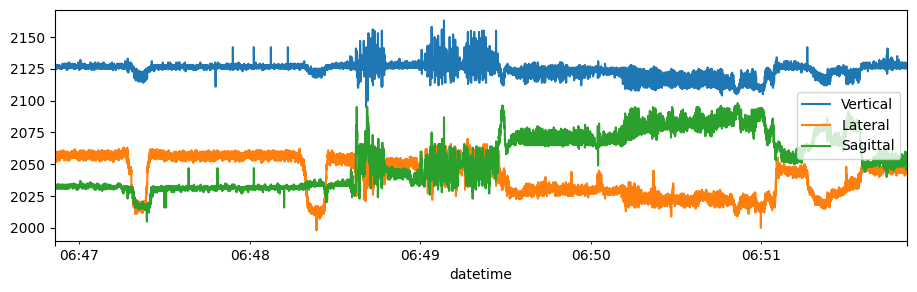

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_01-12_35_54_Accel.csv
Original CSV file size: 103.18 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_acceleration_002.feather (33.52 MB)
Visualizing data for sensor 'acceleration' in patient 002


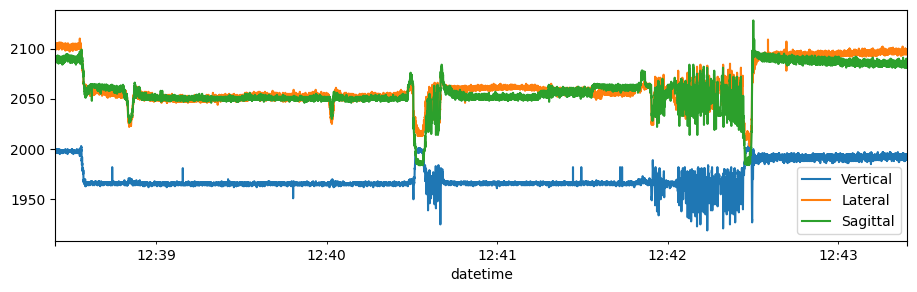

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_04-17_43_12_Accel.csv
Original CSV file size: 32.62 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_acceleration_002.feather (10.70 MB)
Visualizing data for sensor 'acceleration' in patient 002


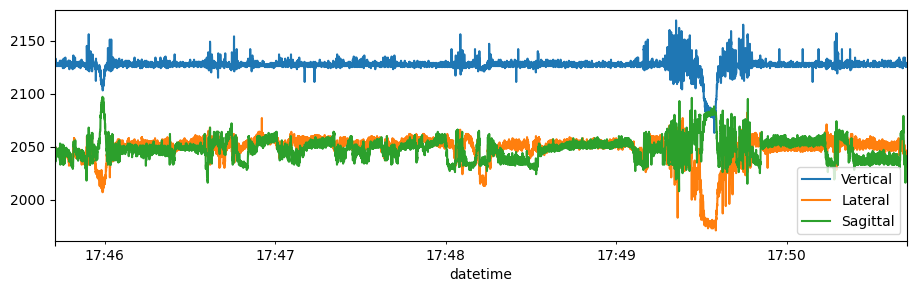

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_03-14_06_08_Accel.csv
Original CSV file size: 84.76 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_acceleration_002.feather (27.46 MB)
Visualizing data for sensor 'acceleration' in patient 002


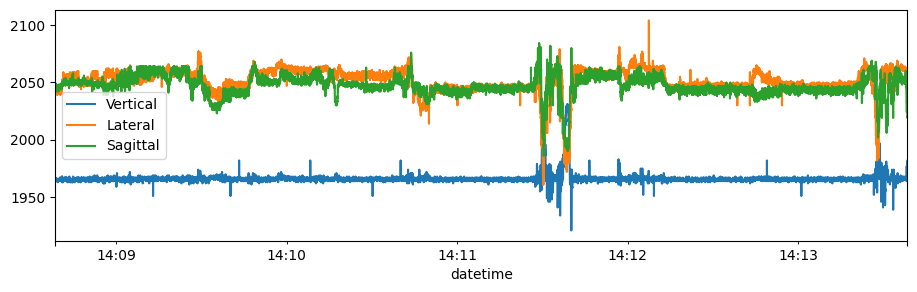

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/acceleration/2014_10_03-06_33_20_Accel.csv
Original CSV file size: 95.16 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_acceleration_002.feather (31.33 MB)
Visualizing data for sensor 'acceleration' in patient 002


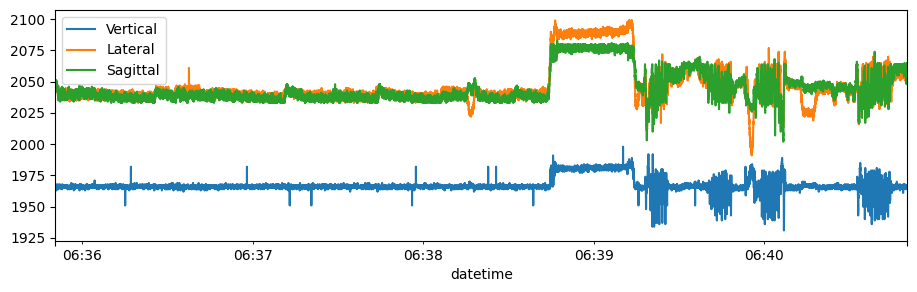

Detected CSV files for sensor 'BB' in patient 002: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_04-07_01_03_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_01-20_29_57_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_04-17_43_12_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_02-06_44_21_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_03-06_33_20_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_03-14_06_08_BB.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_01-12_35_54_BB.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_04-07_01_03_BB.csv
Original CSV file size: 0.08 MB
Saved to feather: ../raw_data/sensor/002/d1nam

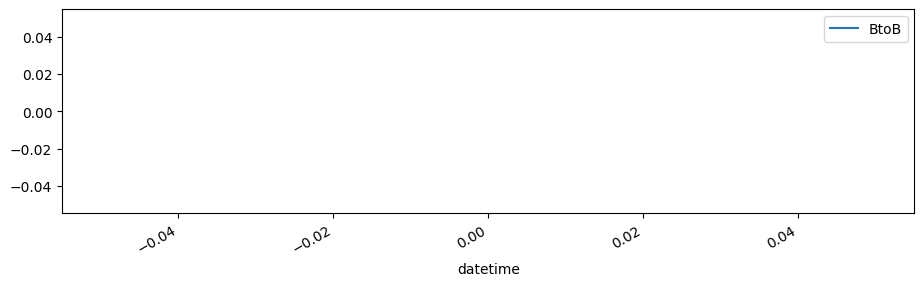

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_01-20_29_57_BB.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_BB_002.feather (0.00 MB)
Visualizing data for sensor 'BB' in patient 002


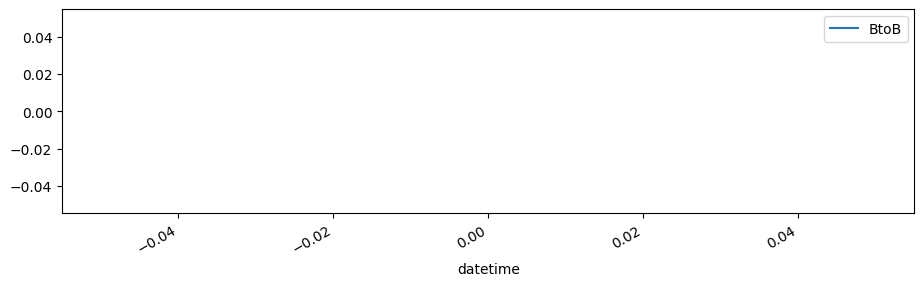

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_04-17_43_12_BB.csv
Original CSV file size: 0.02 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_BB_002.feather (0.01 MB)
Visualizing data for sensor 'BB' in patient 002


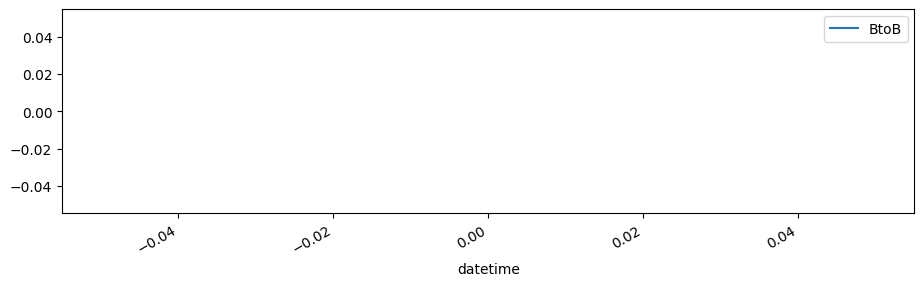

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_02-06_44_21_BB.csv
Original CSV file size: 0.11 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_BB_002.feather (0.06 MB)
Visualizing data for sensor 'BB' in patient 002


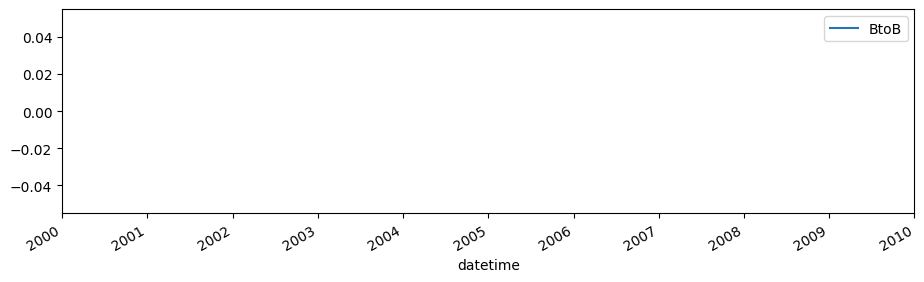

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_03-06_33_20_BB.csv
Original CSV file size: 0.06 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_BB_002.feather (0.03 MB)
Visualizing data for sensor 'BB' in patient 002


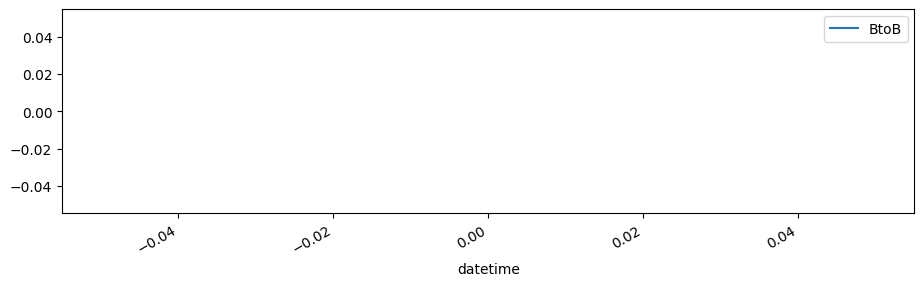

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_03-14_06_08_BB.csv
Original CSV file size: 0.05 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_BB_002.feather (0.03 MB)
Visualizing data for sensor 'BB' in patient 002


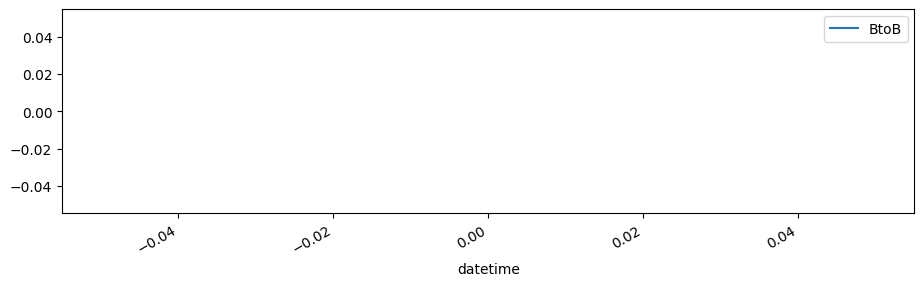

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/BB/2014_10_01-12_35_54_BB.csv
Original CSV file size: 0.07 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_BB_002.feather (0.04 MB)
Visualizing data for sensor 'BB' in patient 002


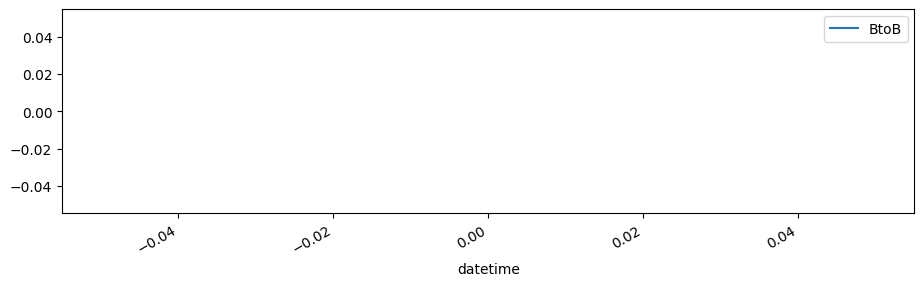

Detected CSV files for sensor 'breathing' in patient 002: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_03-06_33_20_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_02-06_44_21_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_01-12_35_54_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_01-20_29_57_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_04-17_43_12_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_03-14_06_08_Breathing.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_04-07_01_03_Breathing.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/bre

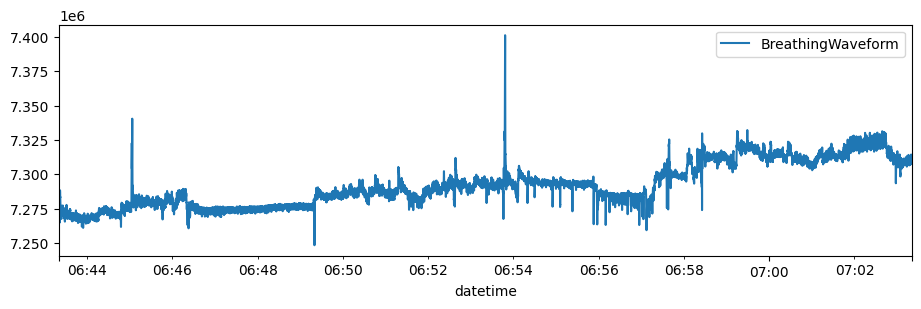

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_02-06_44_21_Breathing.csv
Original CSV file size: 36.46 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_breathing_002.feather (10.51 MB)
Visualizing data for sensor 'breathing' in patient 002


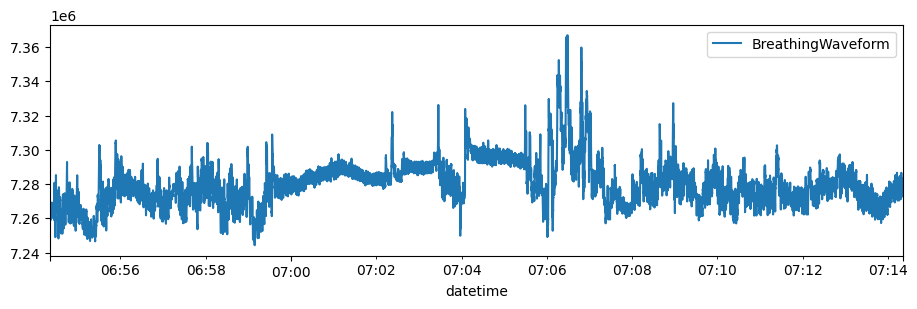

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_01-12_35_54_Breathing.csv
Original CSV file size: 21.16 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_breathing_002.feather (6.18 MB)
Visualizing data for sensor 'breathing' in patient 002


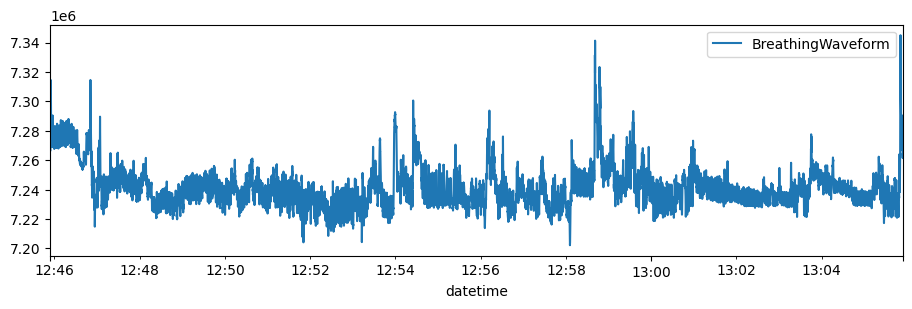

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_01-20_29_57_Breathing.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_breathing_002.feather (0.00 MB)
Visualizing data for sensor 'breathing' in patient 002


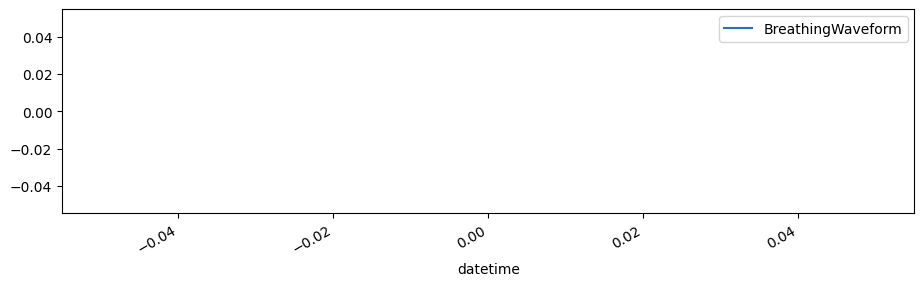

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_04-17_43_12_Breathing.csv
Original CSV file size: 6.69 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_breathing_002.feather (1.94 MB)
Visualizing data for sensor 'breathing' in patient 002


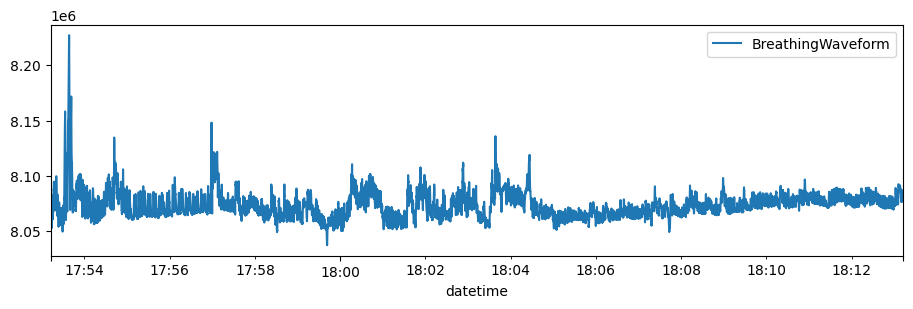

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_03-14_06_08_Breathing.csv
Original CSV file size: 17.39 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_breathing_002.feather (4.97 MB)
Visualizing data for sensor 'breathing' in patient 002


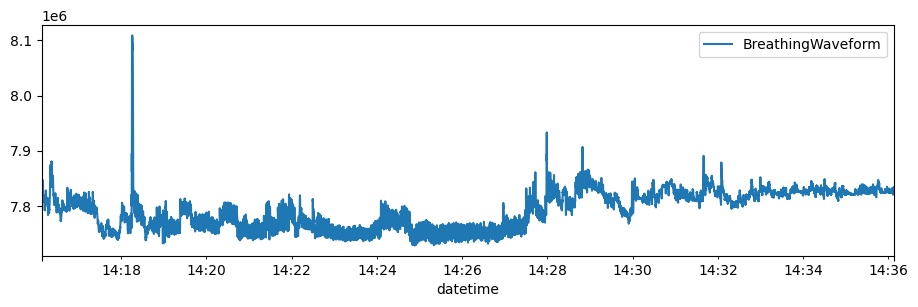

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/breathing/2014_10_04-07_01_03_Breathing.csv
Original CSV file size: 26.81 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_breathing_002.feather (7.73 MB)
Visualizing data for sensor 'breathing' in patient 002


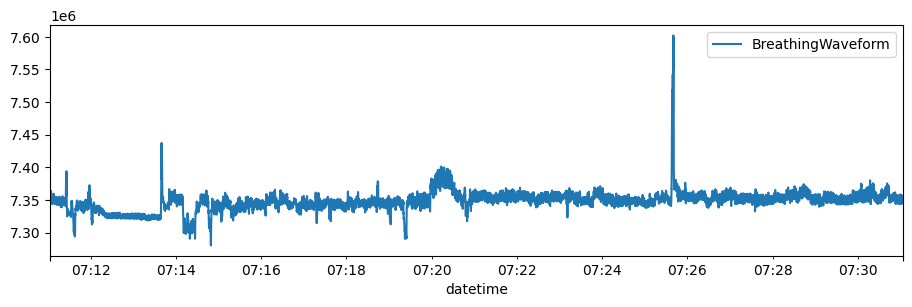

Detected CSV files for sensor 'RR' in patient 002: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_03-06_33_20_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_03-14_06_08_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_01-12_35_54_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_01-20_29_57_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_04-07_01_03_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_04-17_43_12_RR.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_02-06_44_21_RR.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_03-06_33_20_RR.csv
Original CSV file size: 0.12 MB
Saved to feather: ../raw_data/sensor/002/d1nam

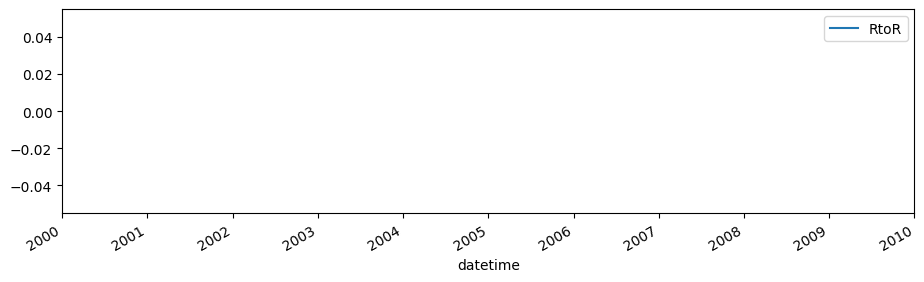

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_03-14_06_08_RR.csv
Original CSV file size: 0.19 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_RR_002.feather (0.11 MB)
Visualizing data for sensor 'RR' in patient 002


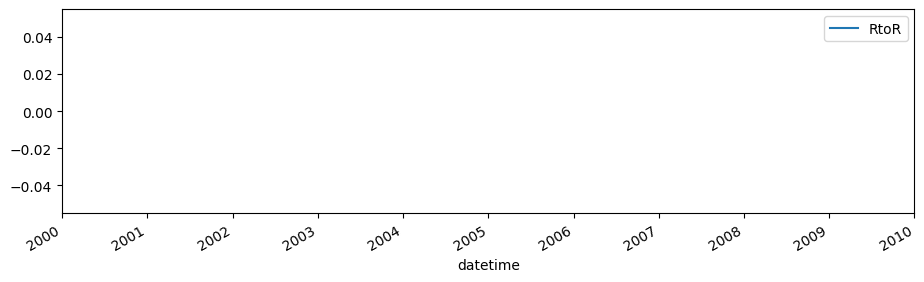

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_01-12_35_54_RR.csv
Original CSV file size: 0.16 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_RR_002.feather (0.10 MB)
Visualizing data for sensor 'RR' in patient 002


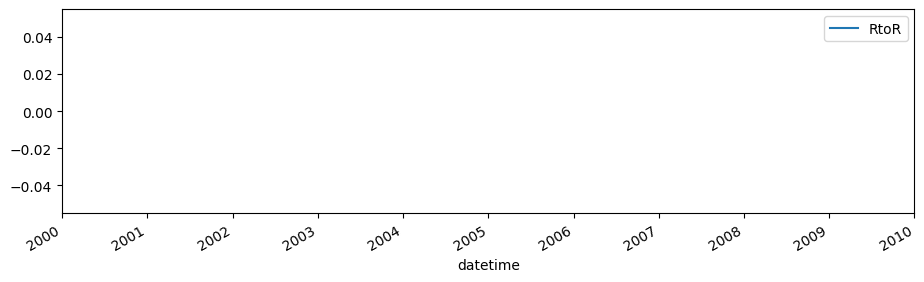

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_01-20_29_57_RR.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_RR_002.feather (0.00 MB)
Visualizing data for sensor 'RR' in patient 002
Error processing file /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_01-20_29_57_RR.csv: no numeric data to plot. Skipping...
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_04-07_01_03_RR.csv
Original CSV file size: 0.26 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_RR_002.feather (0.16 MB)
Visualizing data for sensor 'RR' in patient 002


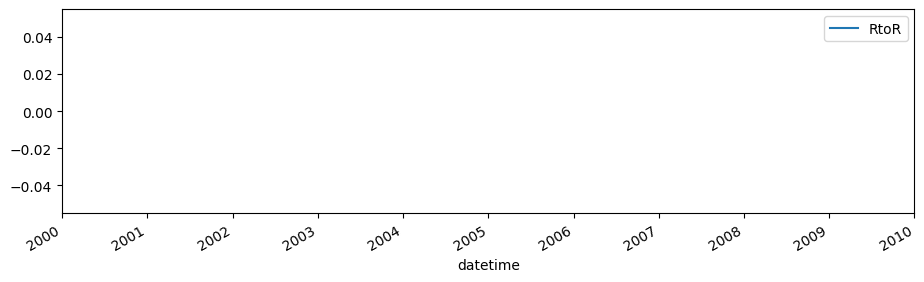

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_04-17_43_12_RR.csv
Original CSV file size: 0.01 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_RR_002.feather (0.01 MB)
Visualizing data for sensor 'RR' in patient 002


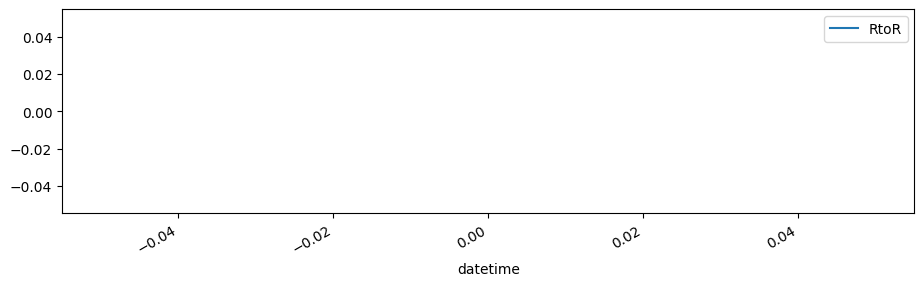

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/RR/2014_10_02-06_44_21_RR.csv
Original CSV file size: 0.26 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_RR_002.feather (0.16 MB)
Visualizing data for sensor 'RR' in patient 002


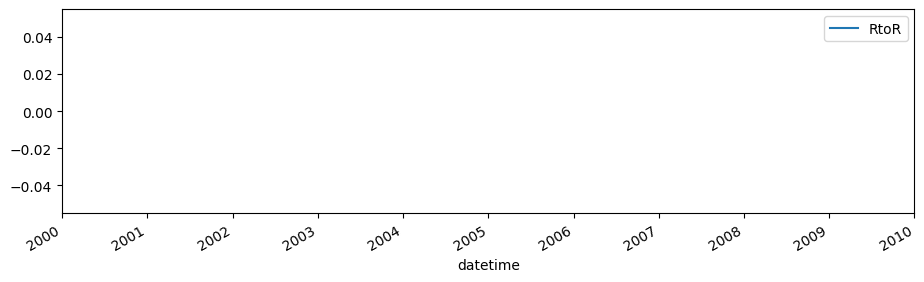

Detected CSV files for sensor 'summary' in patient 002: ['/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_04-17_43_12_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_03-14_06_08_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_03-06_33_20_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_01-20_29_57_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_02-06_44_21_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_04-07_01_03_Summary.csv', '/Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_01-12_35_54_Summary.csv']
Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_04-17_43_12_Summa

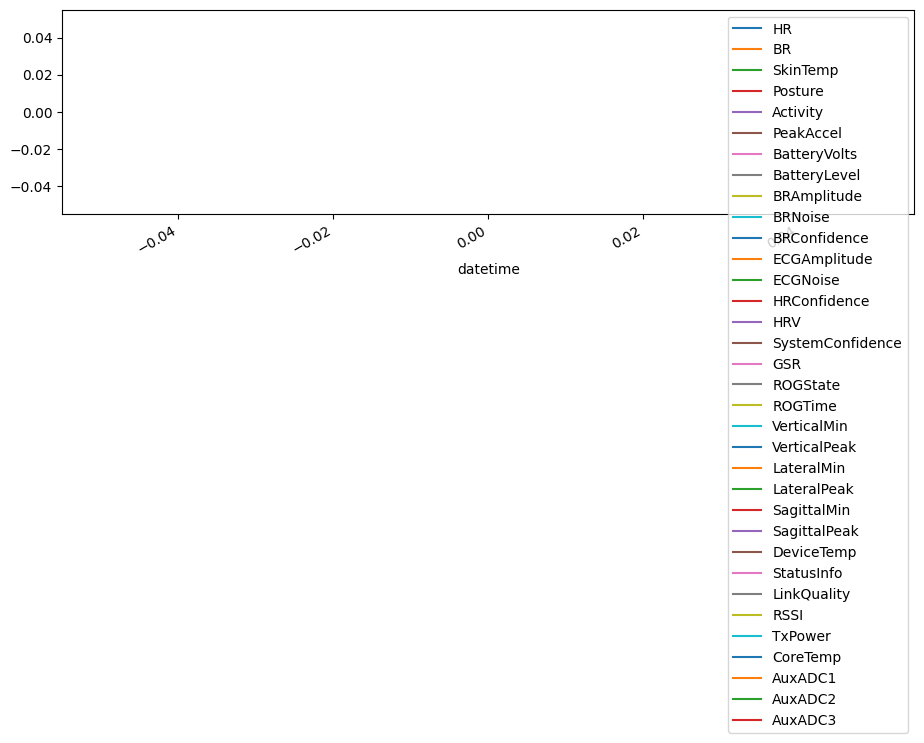

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_03-14_06_08_Summary.csv
Original CSV file size: 4.28 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_summary_002.feather (1.04 MB)
Visualizing data for sensor 'summary' in patient 002


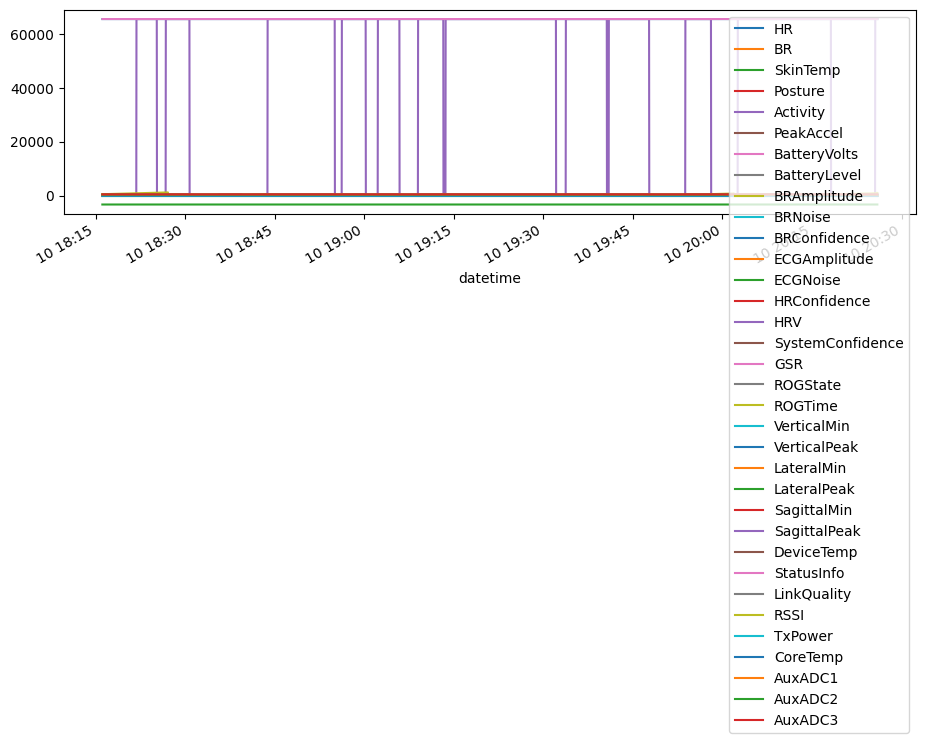

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_03-06_33_20_Summary.csv
Original CSV file size: 4.78 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_summary_002.feather (1.14 MB)
Visualizing data for sensor 'summary' in patient 002


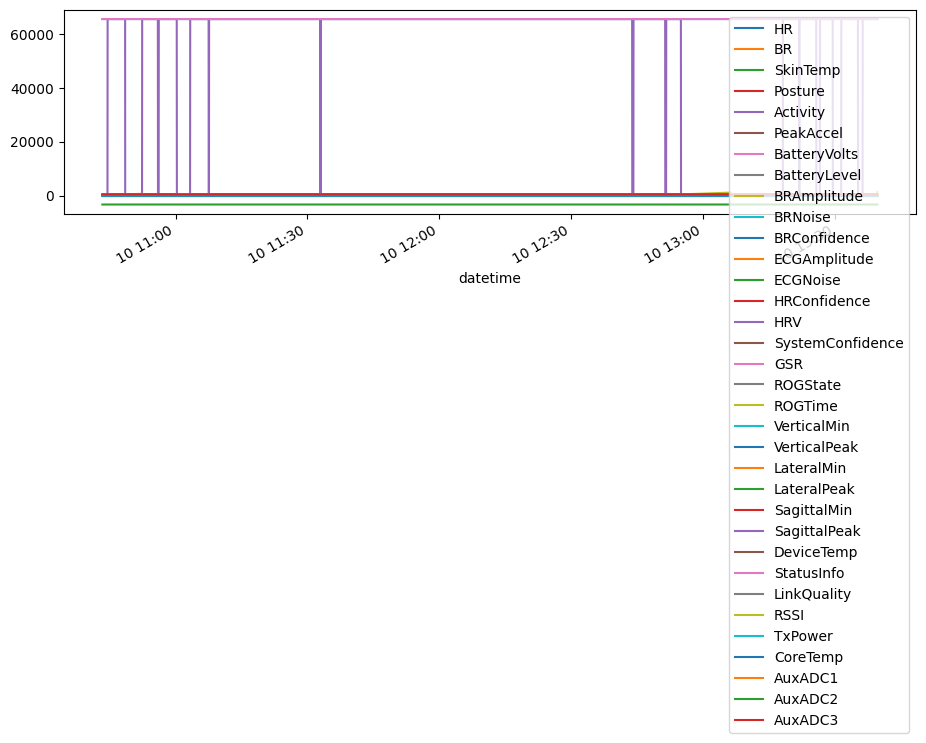

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_01-20_29_57_Summary.csv
Original CSV file size: 0.00 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_summary_002.feather (0.02 MB)
Visualizing data for sensor 'summary' in patient 002


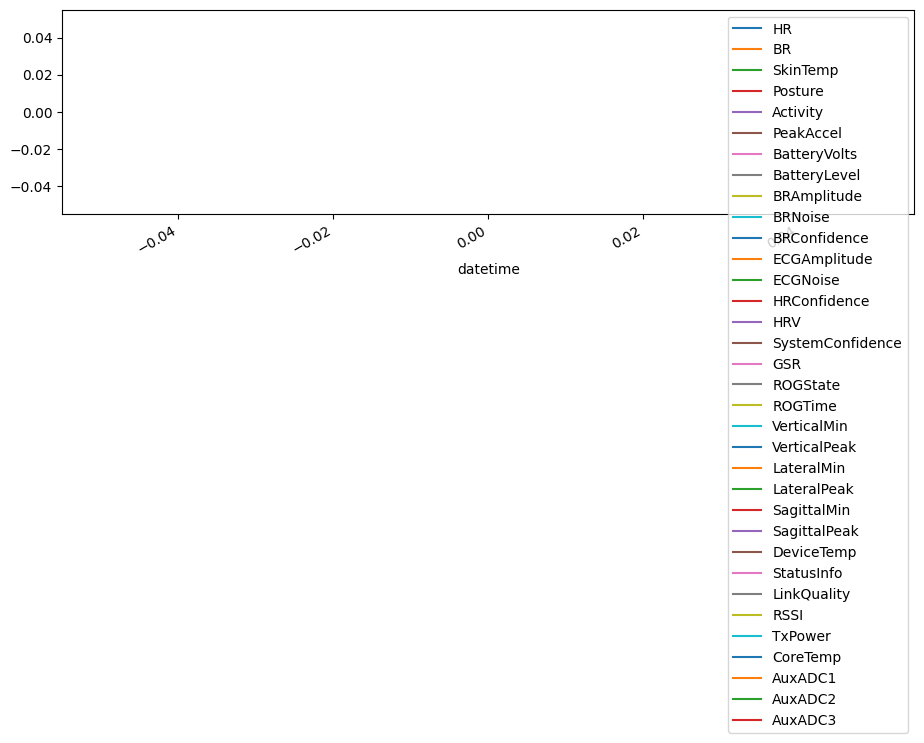

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_02-06_44_21_Summary.csv
Original CSV file size: 8.94 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_summary_002.feather (2.10 MB)
Visualizing data for sensor 'summary' in patient 002


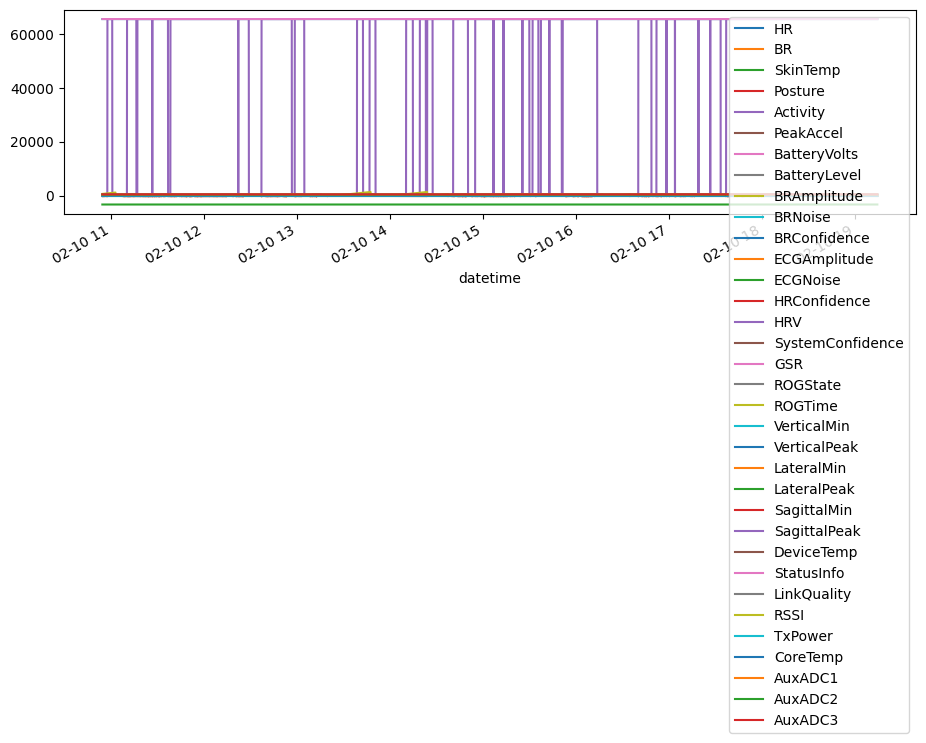

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_04-07_01_03_Summary.csv
Original CSV file size: 6.60 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_summary_002.feather (1.56 MB)
Visualizing data for sensor 'summary' in patient 002


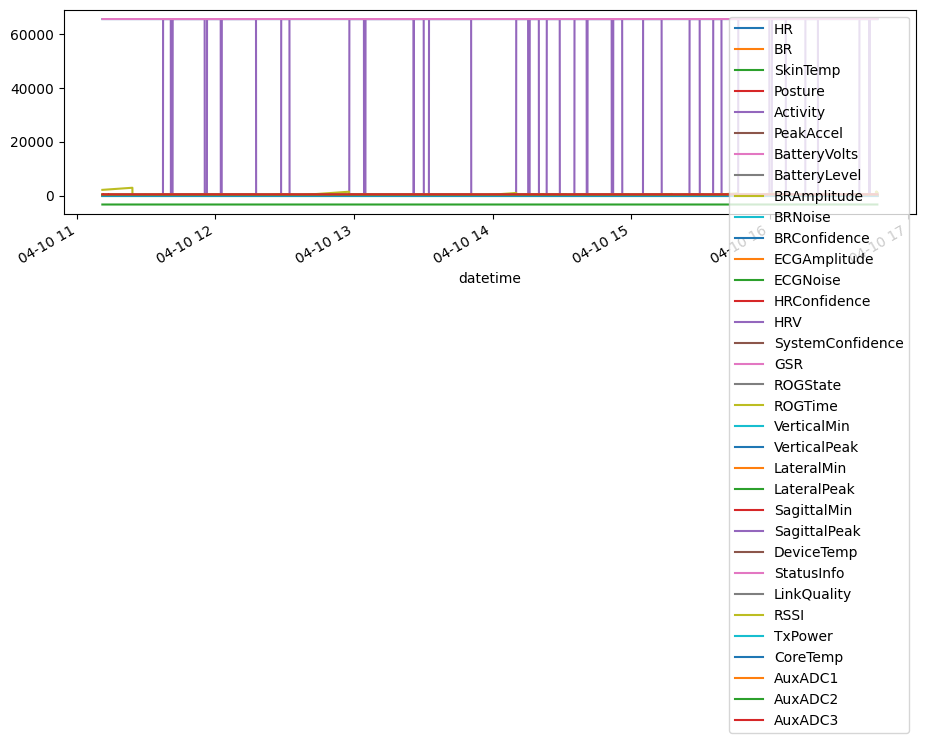

Processing file: /Users/jenniferdanielonwuchekwa/Downloads/diabetes_subset_sensor_data/002/summary/2014_10_01-12_35_54_Summary.csv
Original CSV file size: 5.20 MB
Saved to feather: ../raw_data/sensor/002/d1namo_t1d_summary_002.feather (1.26 MB)
Visualizing data for sensor 'summary' in patient 002


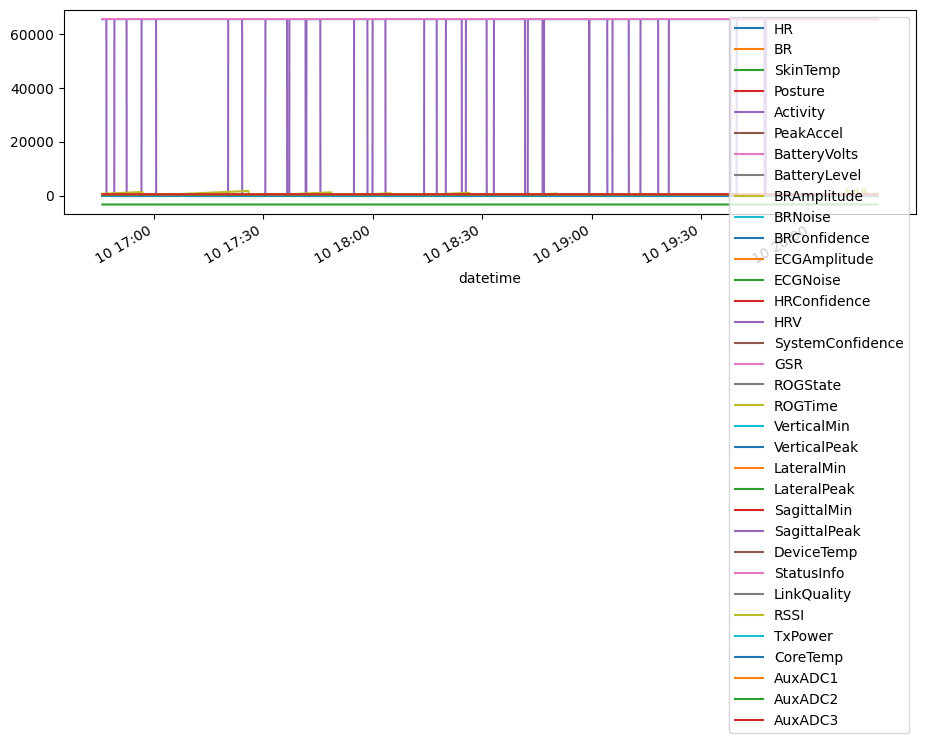

In [7]:
def process_all_data(base_dir):
    """
    Processes all sensor data files for all patients in the dataset.
    """
    try:
        patient_dirs = [os.path.join(base_dir, patient) for patient in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, patient))]
        if not patient_dirs:
            print("No patient directories found. Exiting...")
            return

        print(f"Detected patient directories: {patient_dirs}")

        for patient_dir in patient_dirs:
            patient_id = os.path.basename(patient_dir)  # Extract patient_id from folder name
            print(f"\nProcessing data for patient {patient_id} in directory: {patient_dir}")
            process_patient_data(patient_dir, patient_id)
    except Exception as e:
        print(f"Error processing all data: {e}. Exiting...")

# Run the preprocessing pipeline
if __name__ == "__main__":
    process_all_data(BASE_DIR)